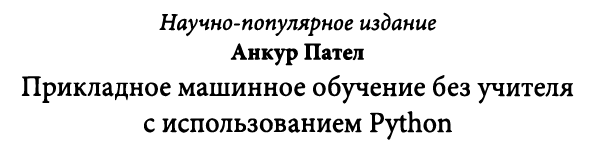

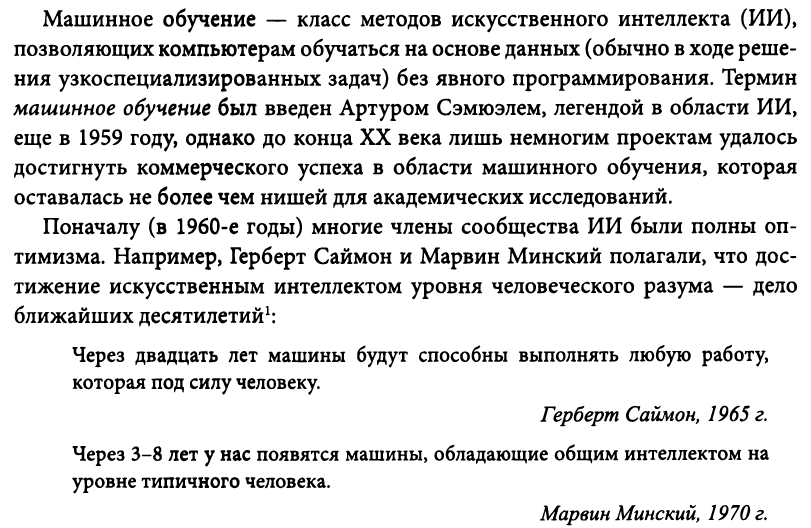

# <span style="color:blue">ЧАСТЬ 1. ОСНОВЫ ОБУЧЕНИЯ БЕЗ УЧИТЕЛЯ</span>

## Базовая терминология машинного обучения

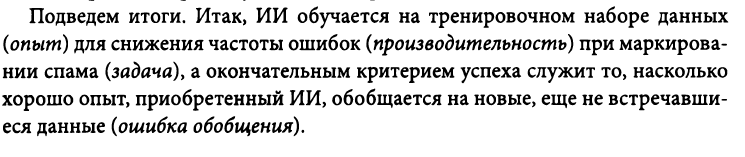

## Обучение, основанное на наборе правил, и машинное обучение

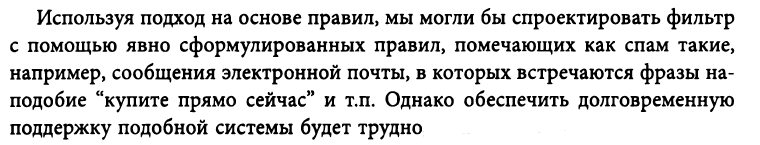

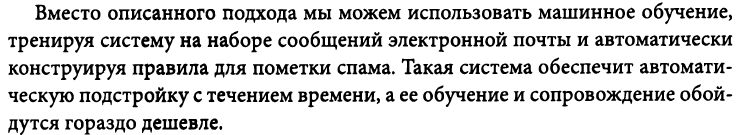

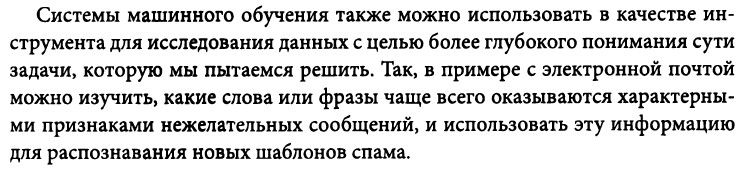

## Обучение с учителем и обучение без учителя

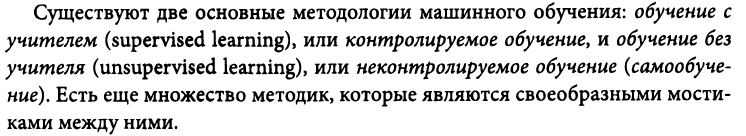

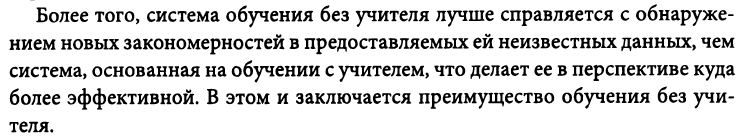

## Сильные и слабые стороны обучения с учителем

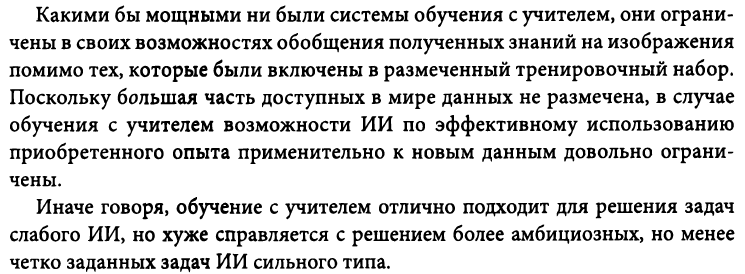

## Сильные и слабые стороны обучения без учителем

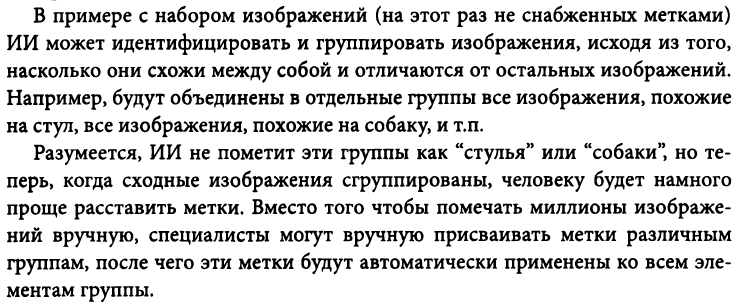

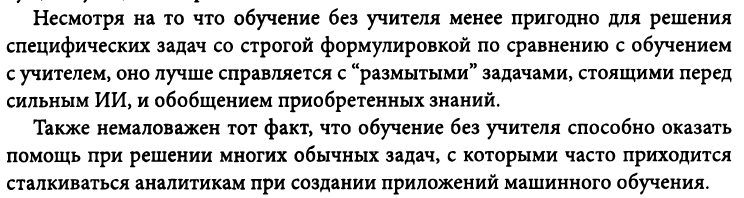

## Проклятие размерности

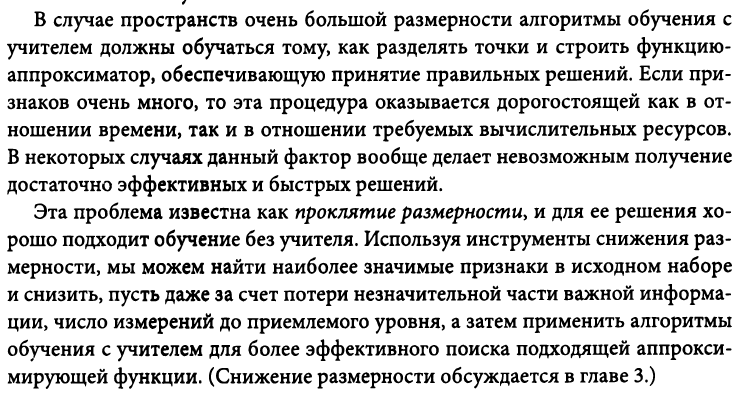

## Конструирование признаков

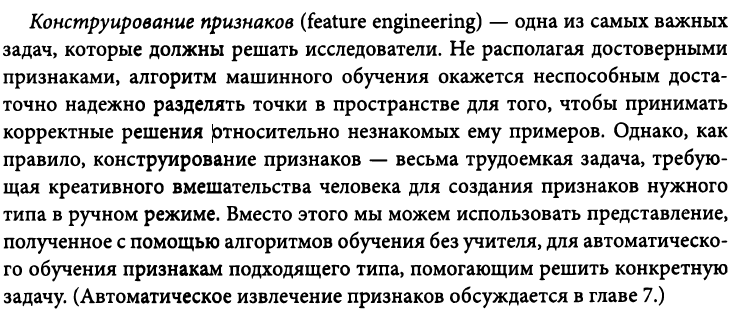

## Выбросы

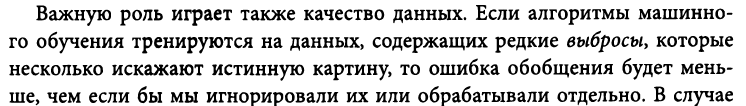

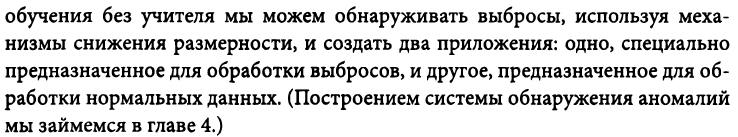

## Краткий обзор алгоритмов машинного обучения с учителем

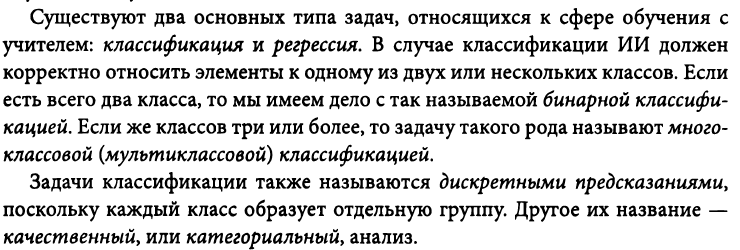

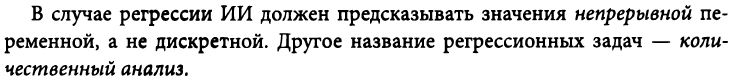

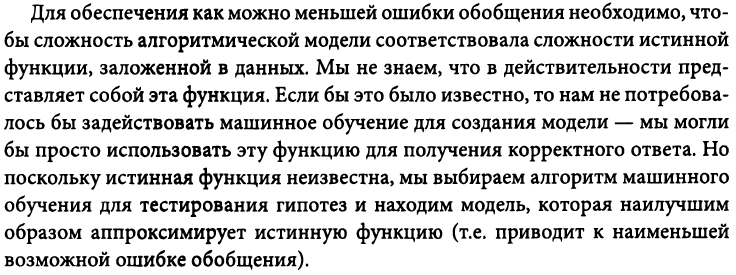

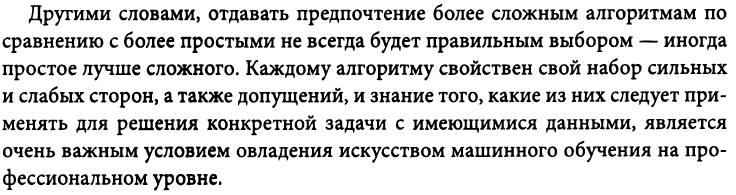

## Линейные методы

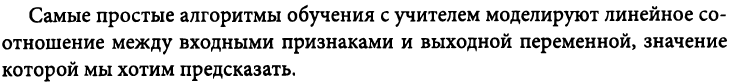

### Линейная регрессия

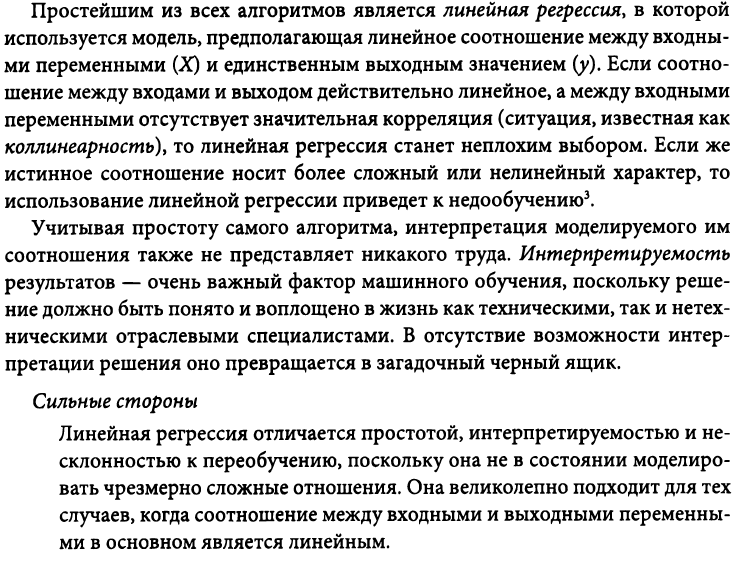

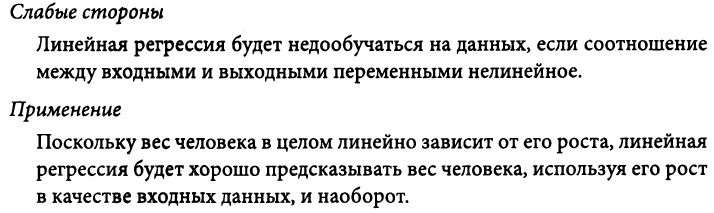

### Логистичесая регрессия

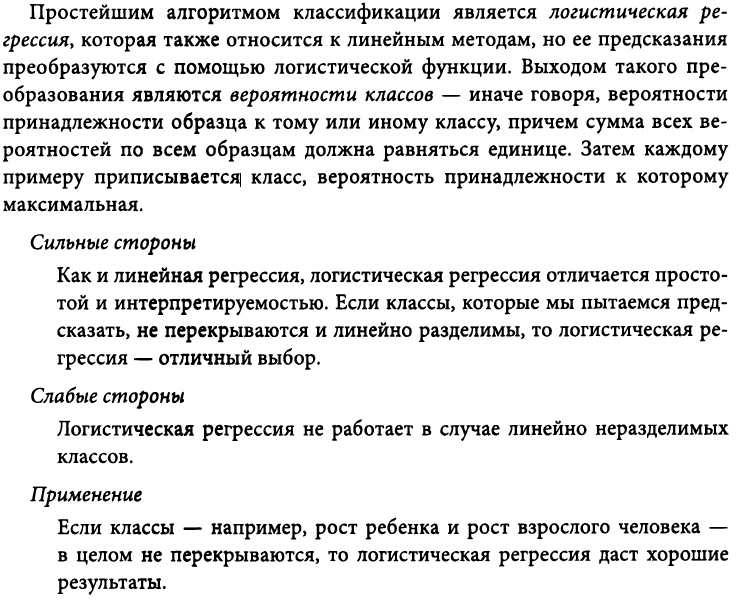

## Методы на основе соседства точек

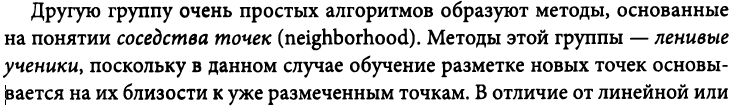

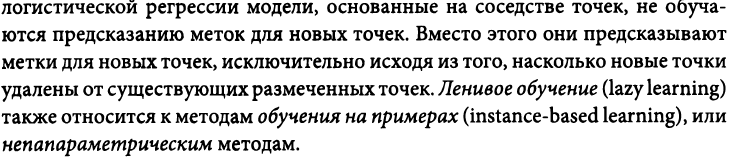

### Метод k-ближайших соседей

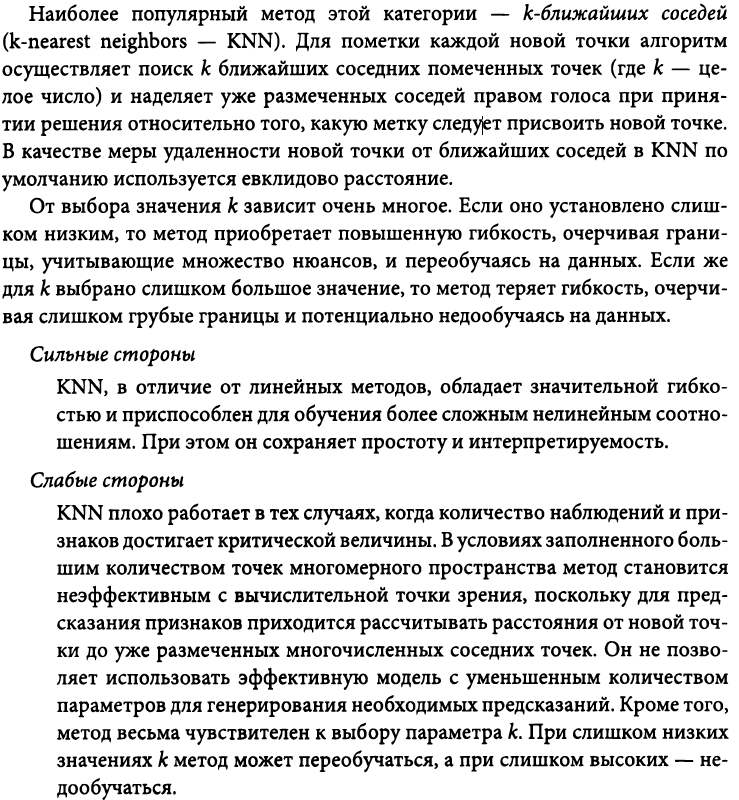

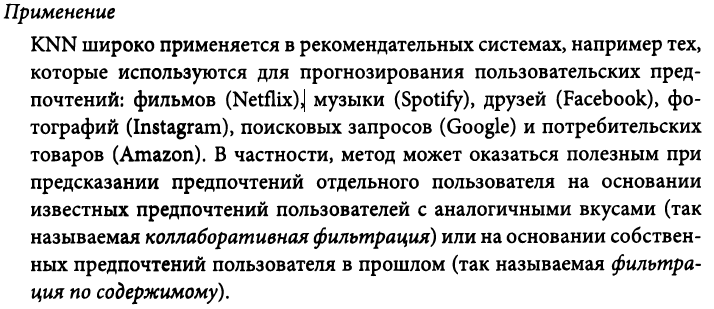

## Методы на основе деревьев решений

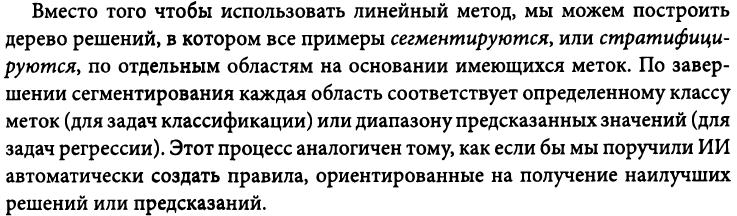

### Одиночное дерево решений

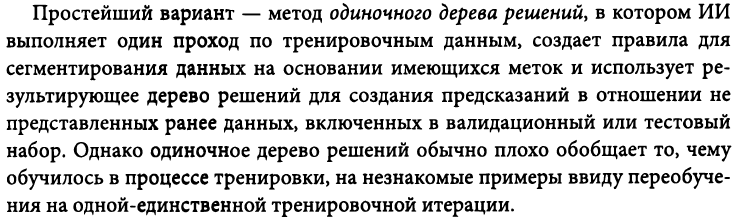

### Бэггинг

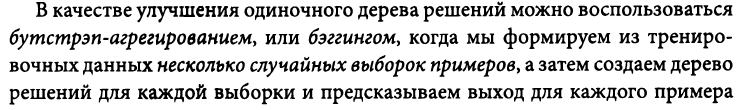

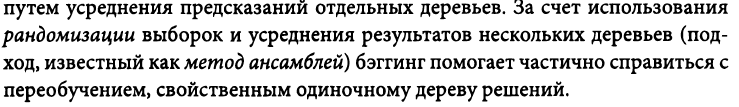

### Случайные леса

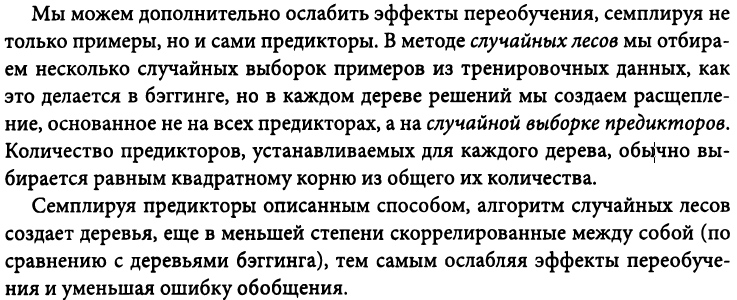

### Бустинг

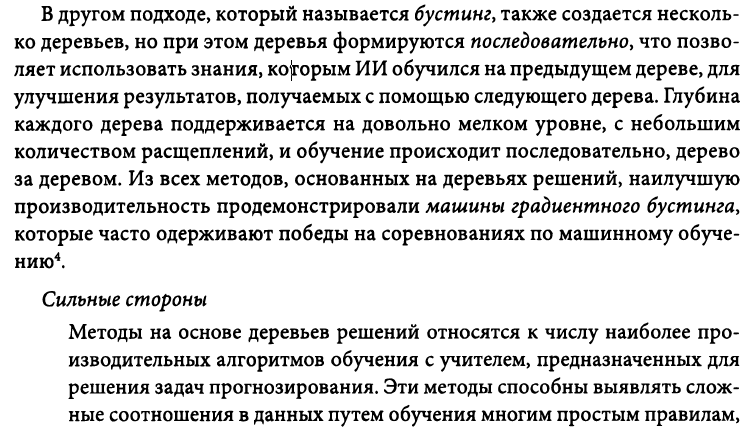

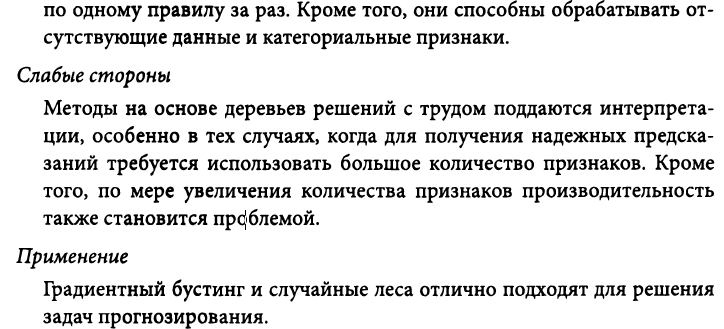

## Метод опорных векторов

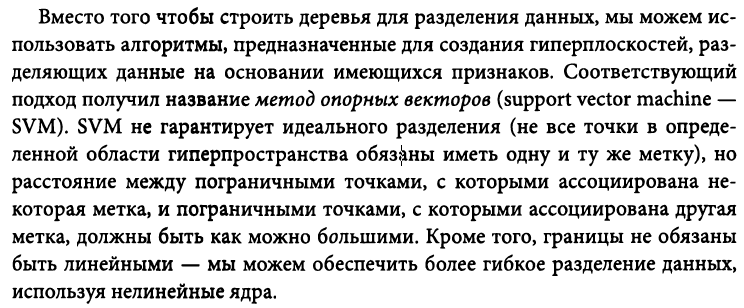

## Нейронные сети

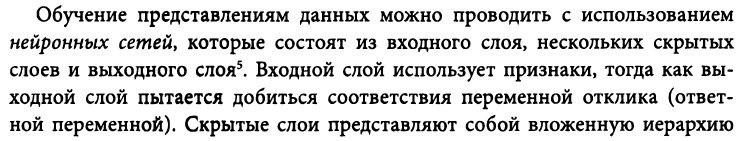

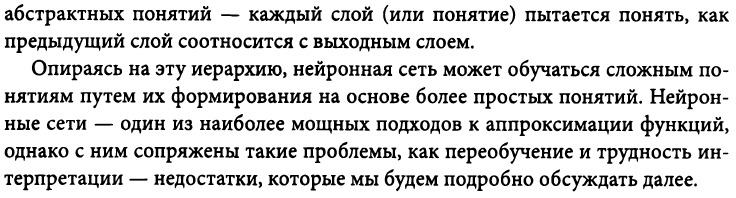

## Краткий обзор алгоритмов машинного обучения без учителя

## Снижение размерностии

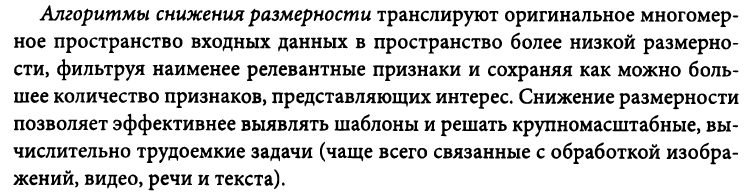

## Линейная проекция

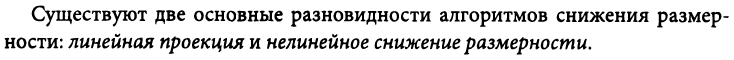

### Анализ главных компонент

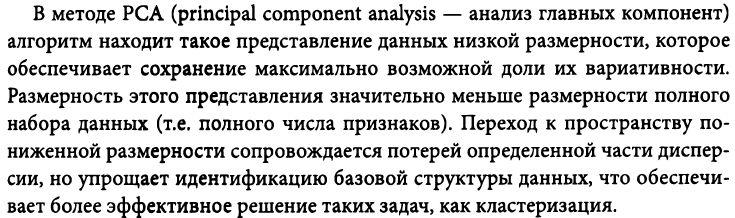

### Сингулярное разложение

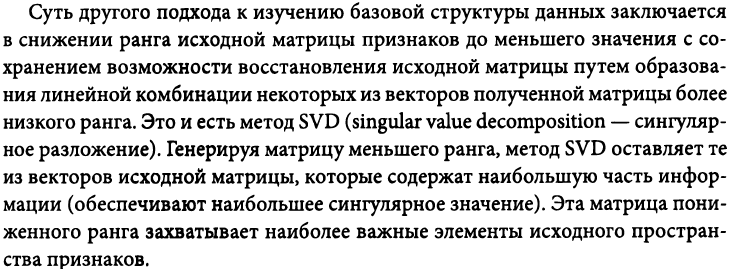

### Случайная проекция

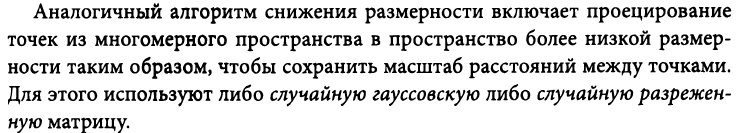

## Обучение на многообразиях

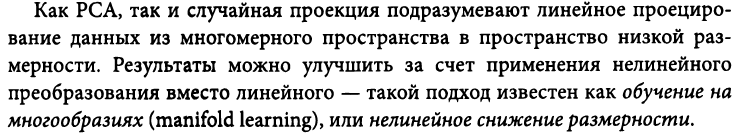

### Isomap

 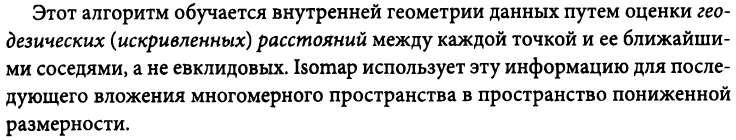

### Стохатическое вложение соседей с t-распределением

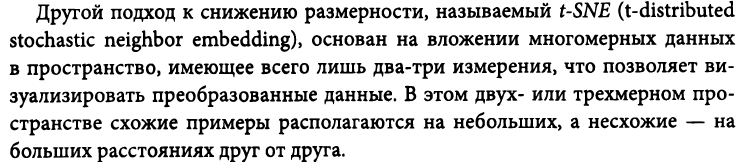

### Словарное обучение

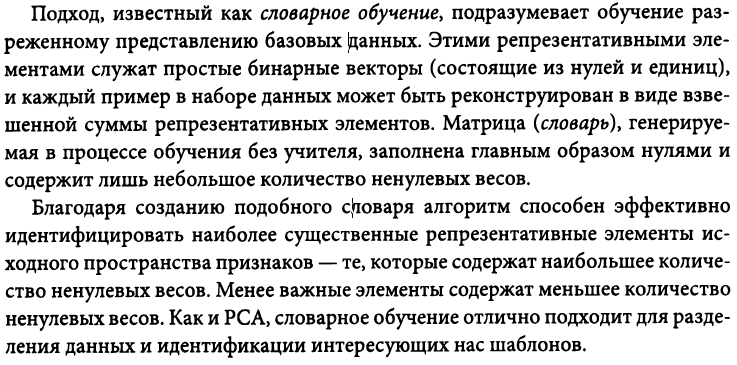

## Анализ независимых компонент

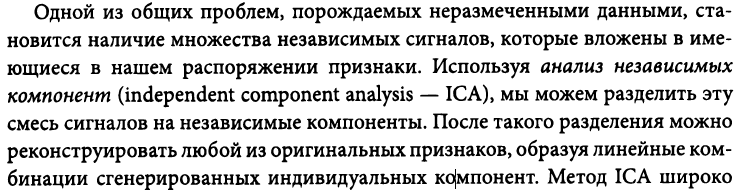

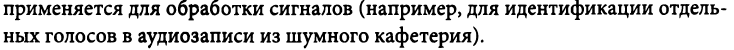

## Латентное размещение Дирихле

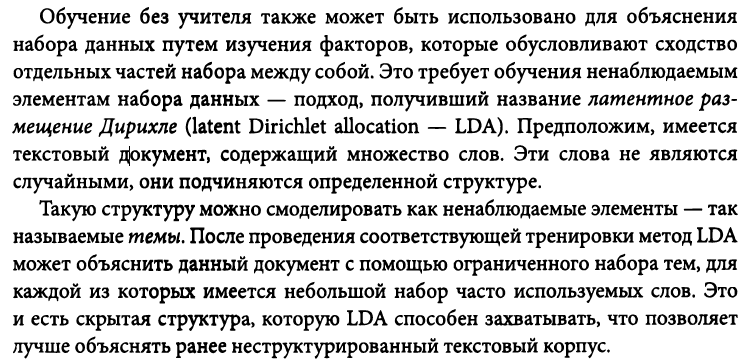

## Кластеризация

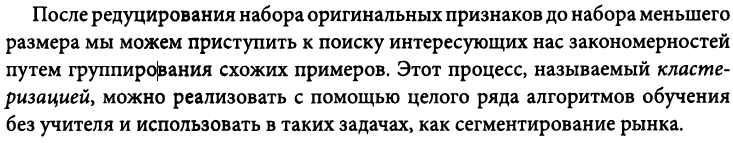

### Метод k-средних

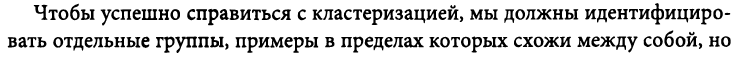

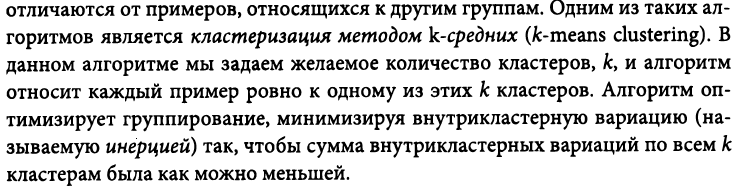

### Иерархическая кластеризация

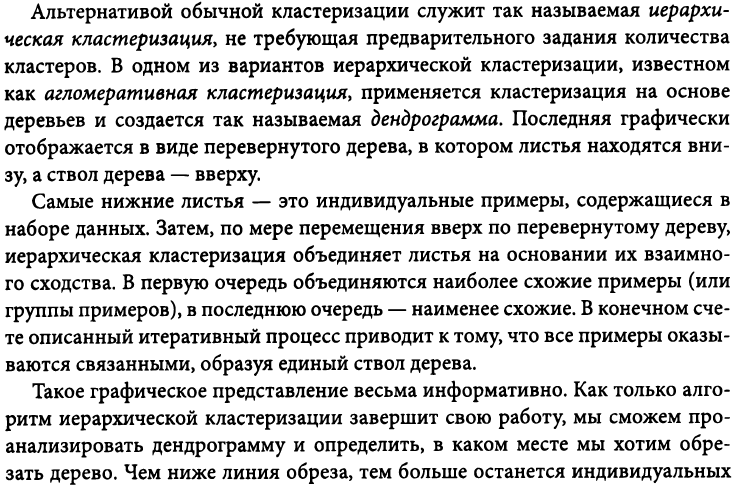

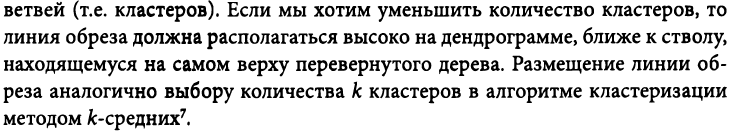

### DBSCAN

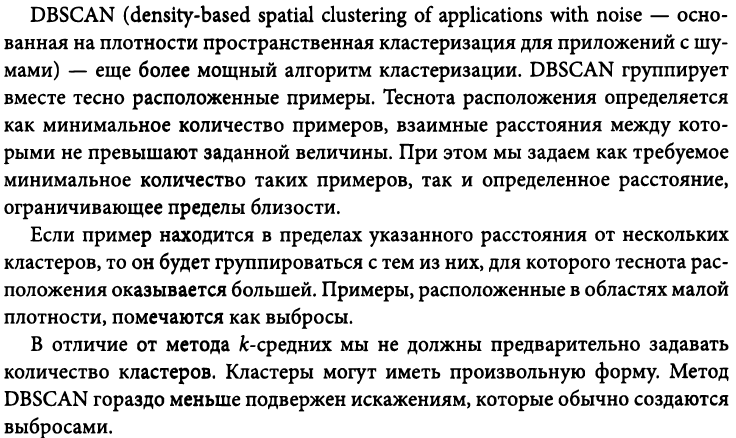

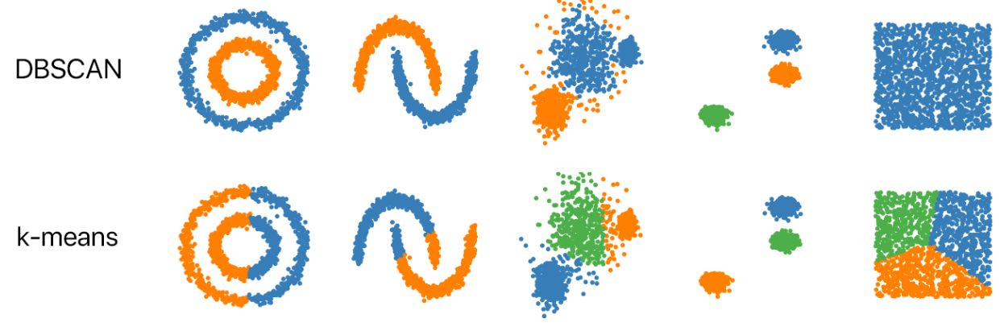

## Извлечение признаков

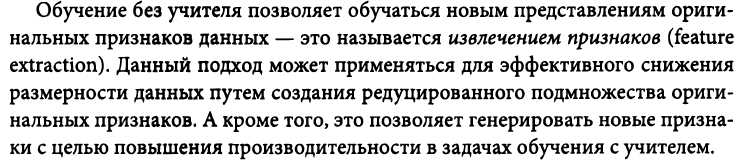

### Автокодировщики

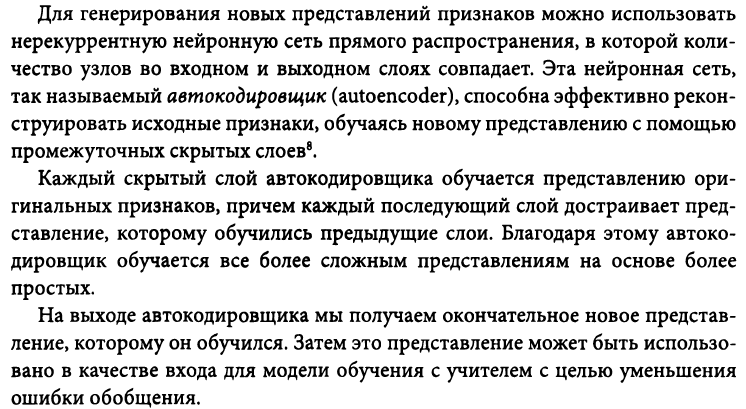

### Извлечение признаков путем контролируемого обучения сетей прямого распространения

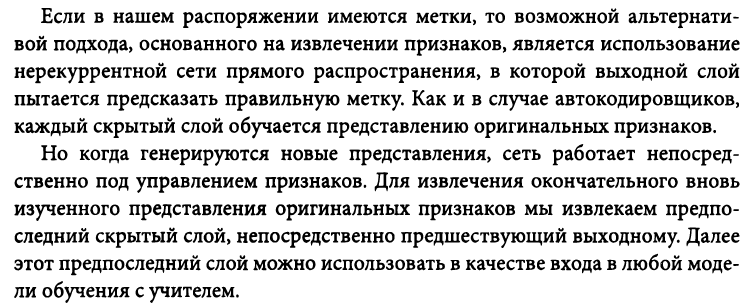

## Глубокое обучение без учителя

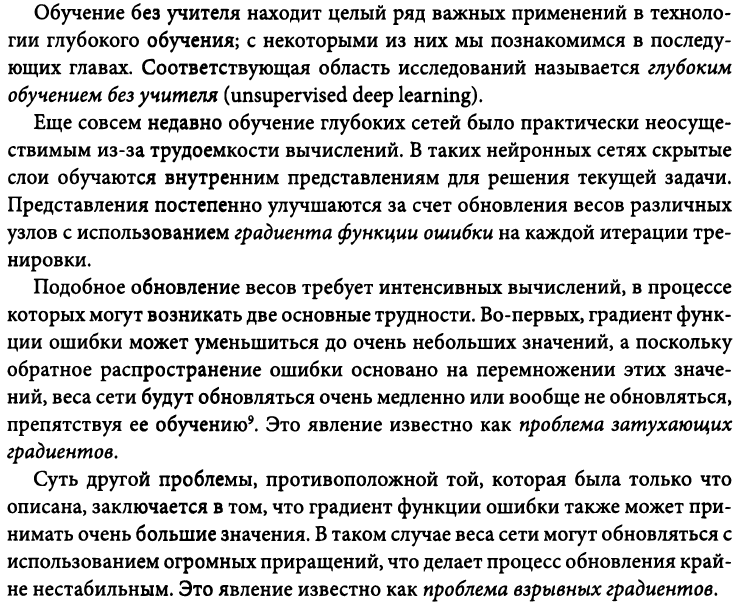

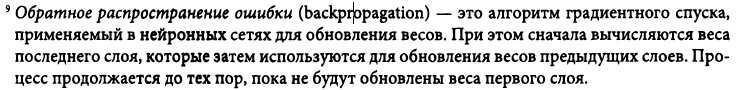

### Предварительное обучение без учителя

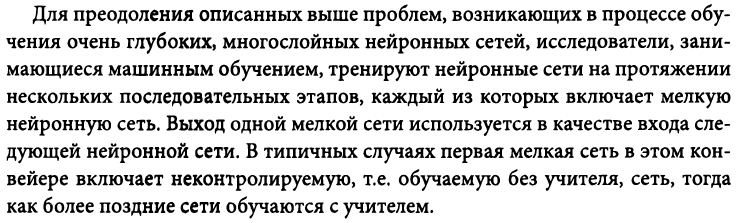

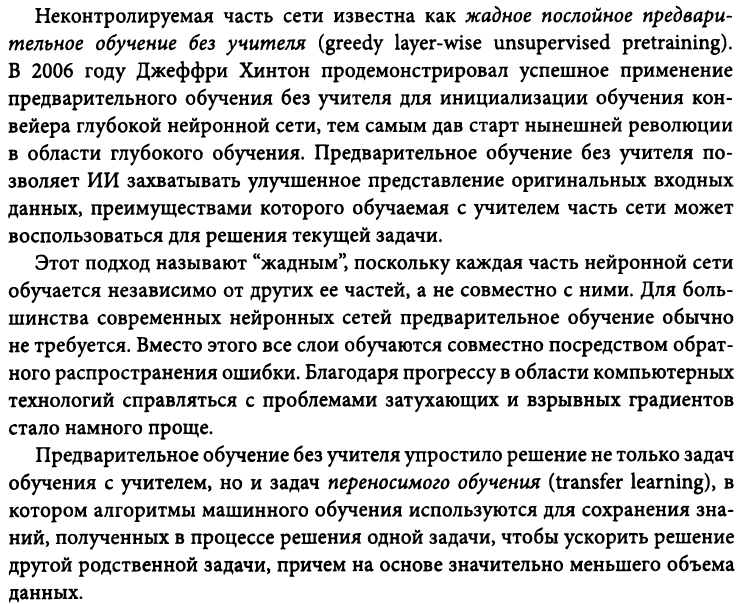

### Ограниченные машины Больцмана

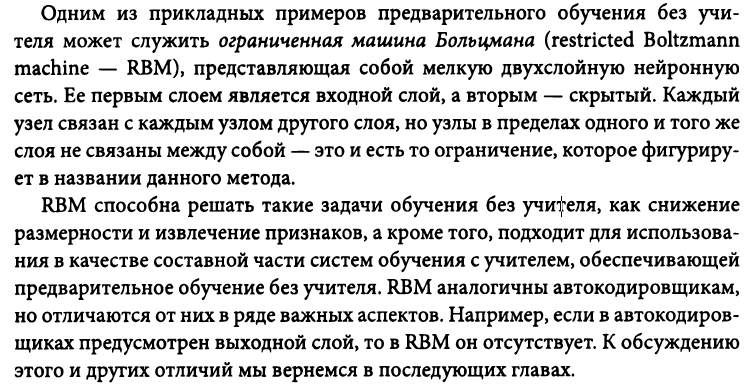

### Глубокие сети доверия

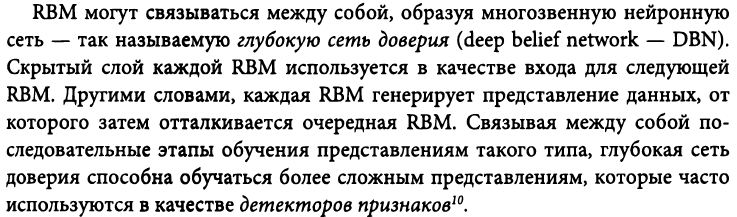

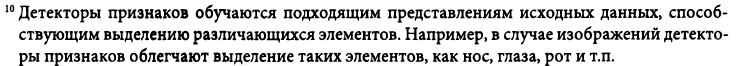

### Генеративно-состязательные сети

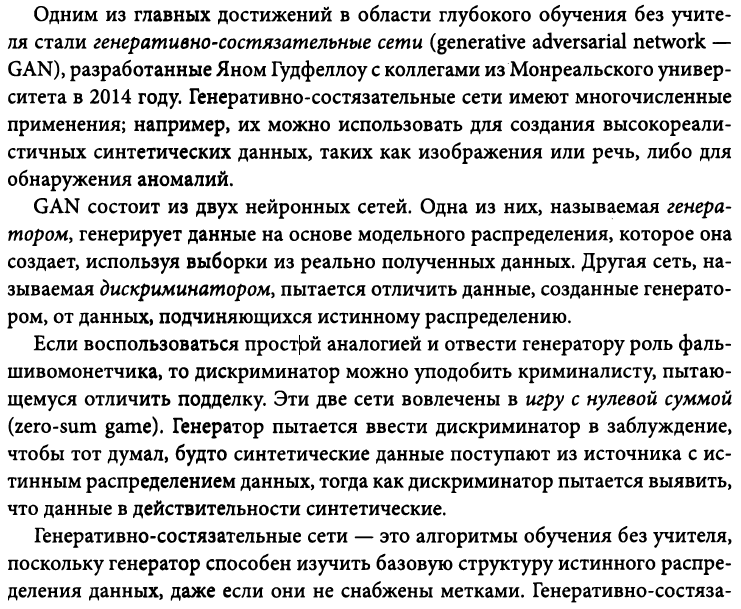

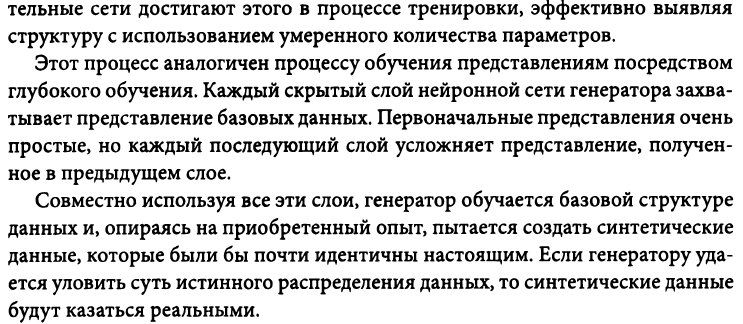

## Обработка последовательных данных с помощью обучения без учителя

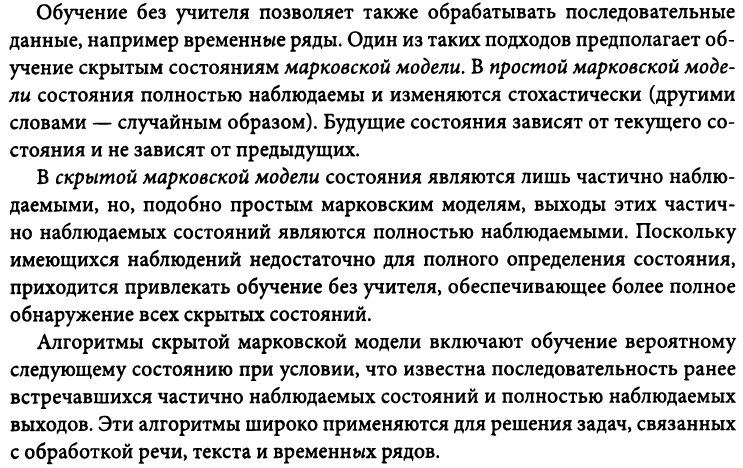

## Обучение с подкреплением с использованием обучения без учителя

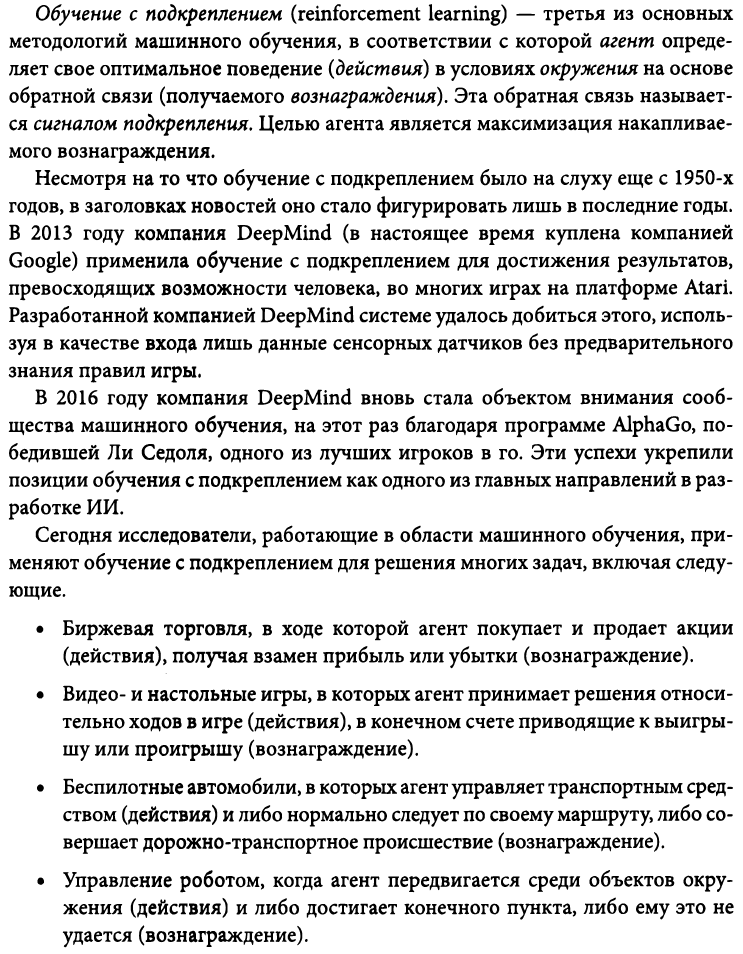

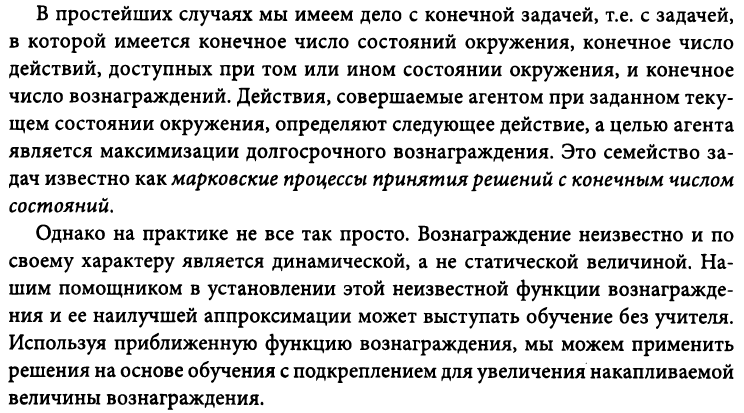

## Обучение с частичным привлечением учителя

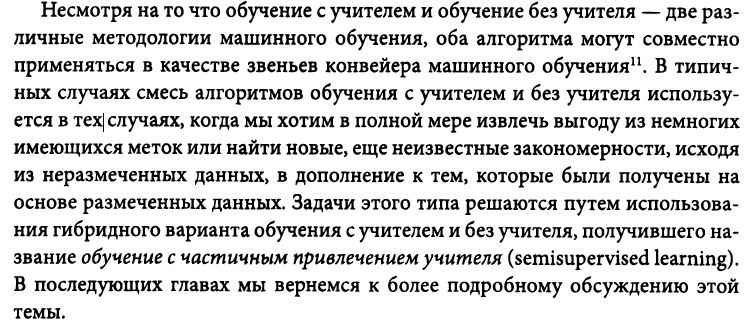

## Успешные примеры обучения без учителя

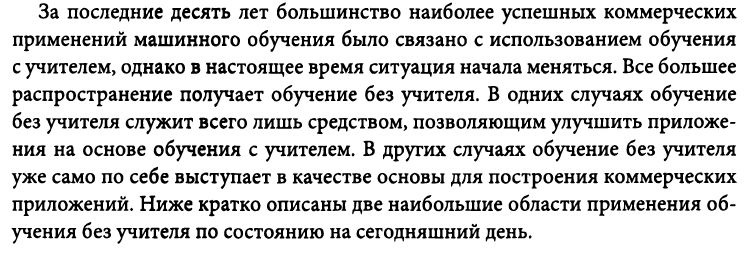

## Обнаружение аномалий

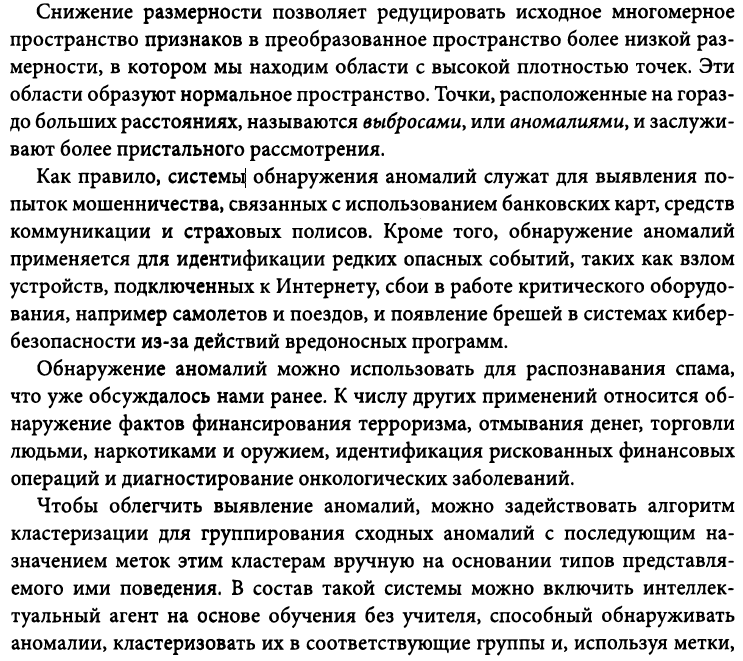

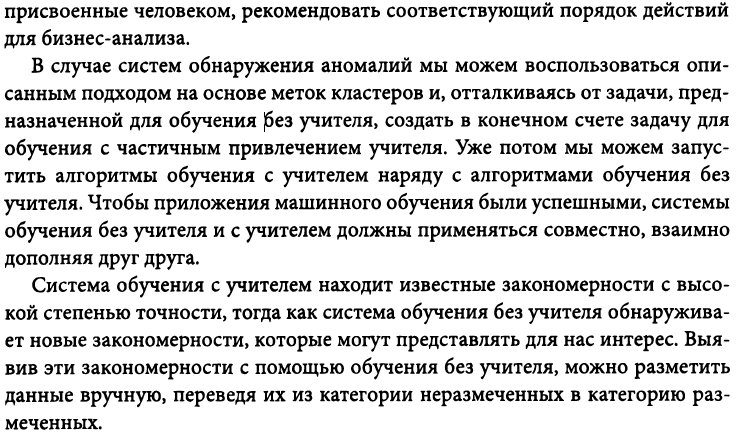

## Сегментирование групп

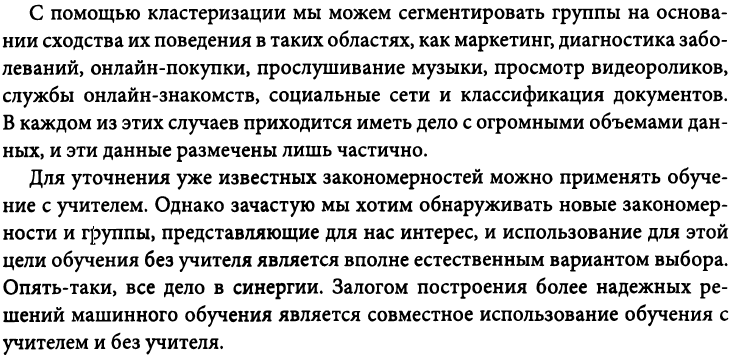

## Резюме

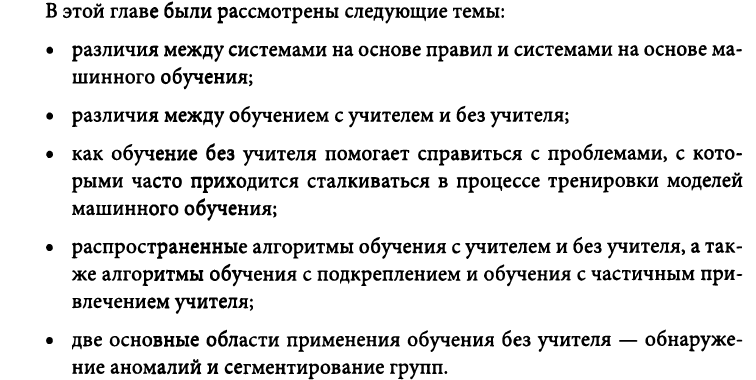

# <span style="color:blue">Готовый проект машинного обучения</span>

## Подготовка среды

<url>https://github.com/aapatel09/handson-unsupervised-learning</url> репозиторий с материалами по книге.  
<b>Дистрибутив <a href='https://www.anaconda.com/'>Anaconda</a></b> - включает в себя Python и библиотеки для научных вычислений.  
<b>Нейронные сети:</b>
<ul>
    <li><b><a href='https://www.tensorflow.org/'>Tensorflow</a></b> - проект Google по нейронным сетям</li>
    <li><b><a href='https://keras.io/'>Keras</a></b> - высокоуровнвое API для работы поверх tensorflow</li>
</ul>
<b>Градиетный бустинг, версия 1:<a href='https://xgboost.readthedocs.io/en/stable/'>XGBoost</a></b> - библиотека.  <p>
    <b>Градиетный бустинг, версия 2:<a href='https://lightgbm.readthedocs.io/en/v3.3.2/'>LightGBM</a></b> - библиотека.  <p>
<b>Алгоритмы кластеризации: </b>  <p>
<ul>
    <li><b><a href='https://pypi.org/project/fastcluster/'>fastcluster</a></b> - - алгоритм кластеризации.</li>
    <li><b><a href='https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html'>hdbscan</a></b> - алгоритм кластеризации.</li>
    <li><b><a href='https://tslearn.readthedocs.io/en/stable/'>tslearn</a></b> -  работа с временными рядами.</li>
</ul>
<b><a href='https://jupyter.org/'>Jupyter Notebook</a></b> - интерактивная вычислительная среда.

## Обзор данных

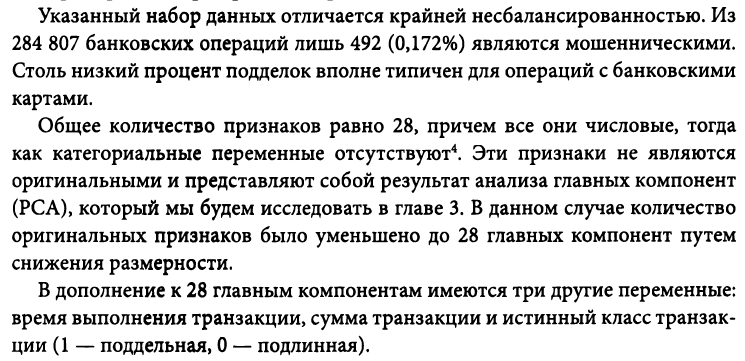

## Подготовка данных
### Загрузка данных

aws s3 cp s3://handson-unsupervised-learning/datasets/ datasets --recursive --no-sign-request

### Импорт библиотек

In [4]:
#основа
import numpy as np
import pandas as pd
import os

#визуализация
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
color = sns.color_palette()

#подготовка данных
from sklearn import preprocessing as pp #стандартизация признаков
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report

#алгоритмы
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

C:\Users\dxrx\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


### Чтение данных

In [5]:
df = pd.read_csv('handson-unsupervised-learning/datasets/credit_card_data/credit_card.csv')

In [6]:
def optimize_memory_usage(df, print_size=True):
    # Function optimizes memory usage in dataframe.
    
    # Types for optimization.
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    # Memory usage size before optimize (Mb).
    before_size = df.memory_usage().sum() / 1024**2    
    for column in df.columns:
        column_type = df[column].dtypes
        if column_type in numerics:
            column_min = df[column].min()
            column_max = df[column].max()
            if str(column_type).startswith('int'):
                if column_min > np.iinfo(np.int8).min and column_max < np.iinfo(np.int8).max:
                    df[column] = df[column].astype(np.int8)
                elif column_min > np.iinfo(np.int16).min and column_max < np.iinfo(np.int16).max:
                    df[column] = df[column].astype(np.int16)
                elif column_min > np.iinfo(np.int32).min and column_max < np.iinfo(np.int32).max:
                    df[column] = df[column].astype(np.int32)
                elif column_min > np.iinfo(np.int64).min and column_max < np.iinfo(np.int64).max:
                    df[column] = df[column].astype(np.int64)  
            else:
                if column_min > np.finfo(np.float32).min and column_max < np.finfo(np.float32).max:
                    df[column] = df[column].astype(np.float32)
                else:
                    df[column] = df[column].astype(np.float64)    
    # Memory usage size after optimize (Mb).
    after_size = df.memory_usage().sum() / 1024**2
    if print_size: print('Memory usage size: before {:5.4f} Mb - after {:5.4f} Mb ({:.1f}%).'.format(before_size, after_size, 100 * (before_size - after_size) / before_size))
    return df

In [7]:
df = optimize_memory_usage(df)

Memory usage size: before 67.3602 Mb - after 32.8653 Mb (51.2%).


Благодаря оптимизации типов данных, удалось сократить размер потребления памяти чуть более чем в два раза.

### Предварительный осмотр

In [8]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.619995,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.690000,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.660004,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.500000,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798279,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.989998,0


In [9]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,284807.000000,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94812.664062,-6.765166e-07,-2.200436e-07,0.000002,0.000001,-2.162242e-07,-3.044802e-07,3.562525e-07,-1.653899e-07,1.252389e-07,...,-1.392230e-08,1.401162e-07,2.286466e-08,-2.529817e-08,-6.366587e-07,-1.851112e-07,-6.904835e-09,-3.216587e-09,88.322945,0.001727
std,47487.195312,1.958611e+00,1.651183e+00,1.516203,1.415832,1.380180e+00,1.332214e+00,1.237020e+00,1.194202e+00,1.098575e+00,...,7.344701e-01,7.256873e-01,6.244100e-01,6.056016e-01,5.212620e-01,4.822155e-01,4.035722e-01,3.300574e-01,250.071564,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-48.325588,-5.683171,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-0.890365,-0.848640,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,0.179846,-0.019847,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097605e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196,0.743341,6.119264e-01,3.985649e-01,5.704361e-01,3.273458e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165001,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382559,16.875343,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519588e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160156,1.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float32
 1   V1      284807 non-null  float32
 2   V2      284807 non-null  float32
 3   V3      284807 non-null  float32
 4   V4      284807 non-null  float32
 5   V5      284807 non-null  float32
 6   V6      284807 non-null  float32
 7   V7      284807 non-null  float32
 8   V8      284807 non-null  float32
 9   V9      284807 non-null  float32
 10  V10     284807 non-null  float32
 11  V11     284807 non-null  float32
 12  V12     284807 non-null  float32
 13  V13     284807 non-null  float32
 14  V14     284807 non-null  float32
 15  V15     284807 non-null  float32
 16  V16     284807 non-null  float32
 17  V17     284807 non-null  float32
 18  V18     284807 non-null  float32
 19  V19     284807 non-null  float32
 20  V20     284807 non-null  float32
 21  V21     28

In [11]:
df['Class'].sum()

492

In [12]:
df.shape

(284807, 31)

В результате быстрого осмотра датасета, мы имеем:  
284807 строк, 31 колонка из которых V1-V28 - числовые признаки  
Time - время операции   
Amount - сумма операции  
Class - метка мошеннической операции (1) в кол-ве 492.  
Пустые значения отсутствуют
Данные требуют стандартизации (масштабирование приводящее среднее значение к нулю, а стандартное отклонение к единице)

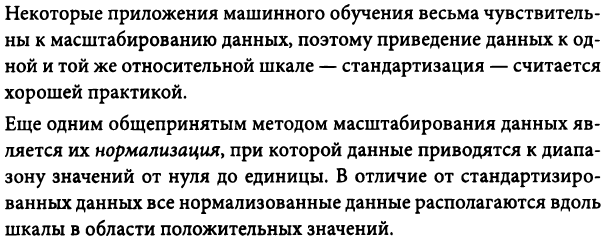

### Вычисление нечисловых и отсутствующих значений

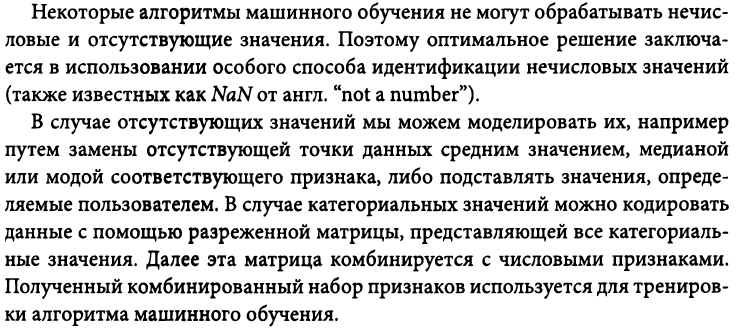

### Выявление различающихся значений признаков

In [13]:
distinctCounter = df.apply(lambda x: len(x.unique()))
distinctCounter

Time      124592
V1        274338
V2        275163
V3        275081
V4        275143
V5        275223
V6        275092
V7        275182
V8        275244
V9        275208
V10       275175
V11       275043
V12       275162
V13       275167
V14       275238
V15       275134
V16       275149
V17       275148
V18       275208
V19       275185
V20       275185
V21       275170
V22       275096
V23       275186
V24       275113
V25       275091
V26       275146
V27       275295
V28       275249
Amount     32767
Class          2
dtype: int64

<b>Time - 124592</b> из 284807 горовит о том, что некоторые операции были выполнены в одно время  
<b>Class - 2</b> метки на мошеннические и обычные операции  
<b>V1-V28</b> имеют тоже малое количество повторений

## Генерирование матрицы признаков и массива меток

<b>Создадим и стандартизируем матрицу признаков X и выделим массив меток Y  
Далее мы будет передавать это алгоритмам машинного обученияв процессе тренировки

### Создание матрицы признаков X и матрицы меток Y

In [14]:
dfX = df.copy().drop(['Class'], axis=1)
dfY = df['Class'].copy()
dfX

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.619995
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.690000
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.660004
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.500000
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.408542,-0.009431,0.798279,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.989998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834784,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.770000
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.790001
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.879997
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.000000


### Стандартизация матрицы признаков X

Стандартизация затронет все признаки кроме Time.

In [15]:
features_columns = dfX.columns #имена признаков
dfX.drop(['Time'], axis=1, inplace=True) #убрал признак со временем
scaler = pp.StandardScaler(copy=False) #объект функции
dfX = scaler.fit_transform(dfX) #стандартизация данных
dfX = pd.DataFrame(dfX) #из серии в датафрейм
dfX.insert(0, 'Time', df['Time']) #добавил обратно столбец
dfX.columns = features_columns #изменил обратно названия столбцов

Алгоритм стандартизации признаков:  
1)Импортируем класс StandardScaler из модуля preprocessing библиотеки sklearn    
2)Объявлем объект StandardScaler  
3)Применяем метод fit_transform к матрице признаков  

Проверим как прошла стандартизация признаков

In [16]:
dfX.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000
mean,94812.664062,5.623947e-07,1.483331e-07,3.698721e-07,2.295117e-07,2.600552e-07,-6.136082e-08,4.059885e-07,2.637950e-07,2.847774e-07,...,-1.135543e-07,1.697835e-07,-5.104619e-07,1.960836e-08,4.159633e-09,-9.163286e-07,-8.394924e-08,-1.851850e-08,1.422097e-08,0.000003
std,47487.195312,9.999582e-01,9.999304e-01,9.999648e-01,9.999756e-01,9.999556e-01,9.999599e-01,9.999459e-01,9.998873e-01,9.999526e-01,...,9.999185e-01,9.999276e-01,9.999853e-01,9.999088e-01,9.999330e-01,9.999778e-01,9.999738e-01,9.998901e-01,9.998924e-01,1.000159
min,0.000000,-2.879856e+01,-4.403529e+01,-3.187173e+01,-4.013918e+00,-8.240810e+01,-1.963606e+01,-3.520940e+01,-6.130252e+01,-1.222802e+01,...,-7.069146e+01,-4.741907e+01,-1.506565e+01,-7.175446e+01,-4.683639e+00,-1.975033e+01,-5.401098e+00,-5.590660e+01,-4.674612e+01,-0.353229
25%,54201.500000,-4.698917e-01,-3.624707e-01,-5.872141e-01,-5.993788e-01,-5.010686e-01,-5.766822e-01,-4.478860e-01,-1.746805e-01,-5.853631e-01,...,-2.746334e-01,-3.109433e-01,-7.473476e-01,-2.591784e-01,-5.854676e-01,-6.084001e-01,-6.780717e-01,-1.755053e-01,-1.604440e-01,-0.330840
50%,84692.000000,9.245352e-03,3.965684e-02,1.186124e-01,-1.401724e-02,-3.936682e-02,-2.058046e-01,3.241723e-02,1.871982e-02,-4.681169e-02,...,-8.104706e-02,-4.009429e-02,9.345377e-03,-1.792420e-02,6.765678e-02,3.183240e-02,-1.081217e-01,3.325174e-03,3.406368e-02,-0.265271
75%,139320.500000,6.716939e-01,4.867202e-01,6.774569e-01,5.250082e-01,4.433465e-01,2.991626e-01,4.611107e-01,2.740785e-01,5.435306e-01,...,1.725733e-01,2.537392e-01,7.283360e-01,2.364319e-01,7.257153e-01,6.728006e-01,4.996663e-01,2.255648e-01,2.371526e-01,-0.044717
max,172792.000000,1.253352e+00,1.335775e+01,6.187993e+00,1.191874e+01,2.521413e+01,5.502015e+01,9.747824e+01,1.675153e+01,1.419494e+01,...,5.113464e+01,3.703471e+01,1.447304e+01,3.607668e+01,7.569684e+00,1.442532e+01,7.293975e+00,7.831940e+01,1.025434e+02,102.362244


## Конструирование и отбор признаков

### Конструирование признаков

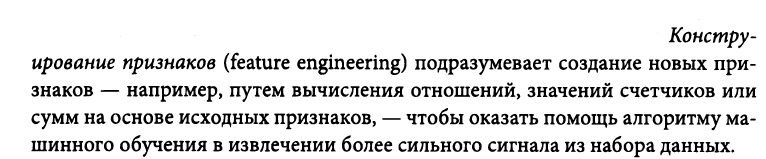

### Отбор признаков

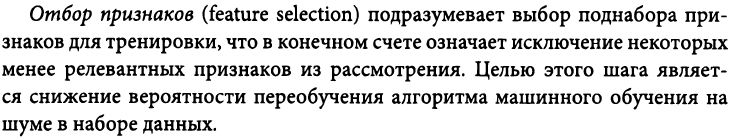

### Проверка корреляции признаков

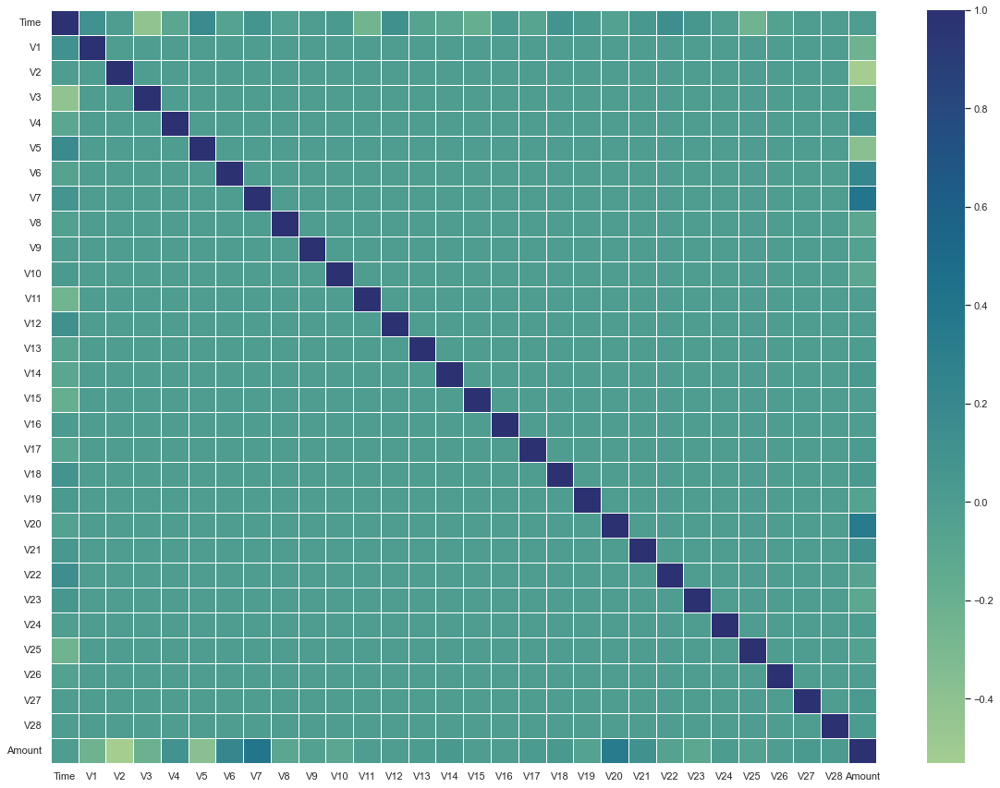

In [17]:
sns.set(rc={"figure.figsize":(20, 15)}) 
sns.heatmap(dfX.corr(), cmap="crest", linewidths='1');

По скольку к данному набору данных был применен метод PCA для понижения размерности,  
то ни о какой значительной корреляции речи идти не может

## Визуализация данных

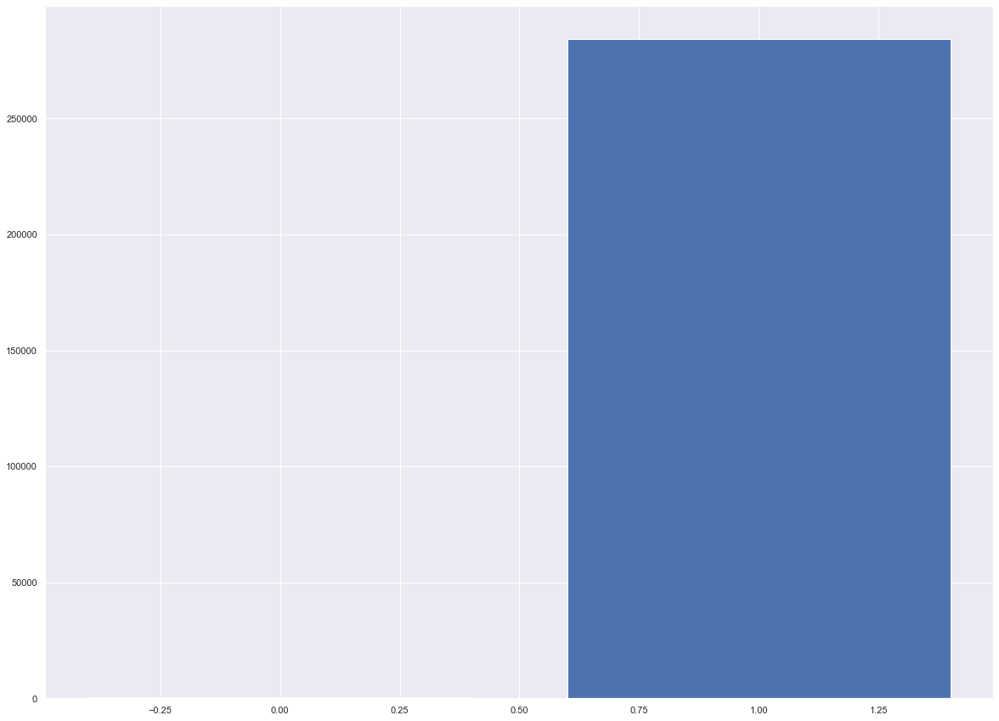

In [18]:
count_class = [df[df['Class'] == 1]['Class'].count(), df[df['Class'] == 0]['Class'].count()]
classes = [0, 1]
plt.bar(classes, count_class)
plt.show()

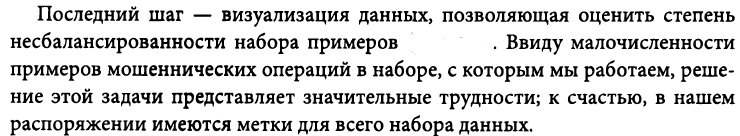

## Подготовка модели

В результате были проделаны следующие шаги:  
<ul>
    <li><b>Импорт необходимых библиотек</b></li> 
    <li><b>Загрузка данных</b></li>
    <li><b>Предварительный осмотр</b></li>
    <li><b>Выявление нечисловых или пропущенных значений</b></li>
    <li><b>Разделение на матрицы признаков и меток</b></li>
    <li><b>Стандартизация матрицы признаков</b></li>
    <li><b>Конструирование и отбор признаков</b></li>
    <li><b>Проверка корреляции признаков</b></li>
    <li><b>Визуализация признаков</b></li>
</ul>  
<p>

### Разбиение данных на тренировочный и тестовый наборы

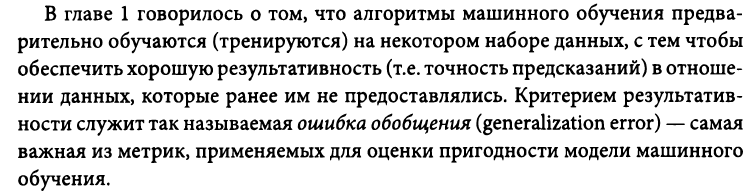

In [19]:
X_train, X_test, y_train, y_test = train_test_split(dfX, dfY, test_size=0.33, random_state=10, stratify=dfY)
# random_state - для воспроизводимости результатов
# stratisfy - для обеспечения одинаковой доли мошеннических операций в тестовой и тренировочном наборе
# test_size - размер тестового набора

### Выбор функции потерь

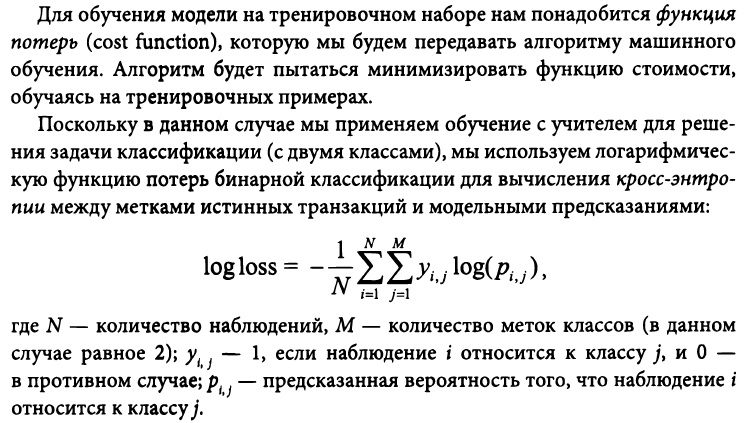

### Создание наборов для k-кратной кросс-проверки

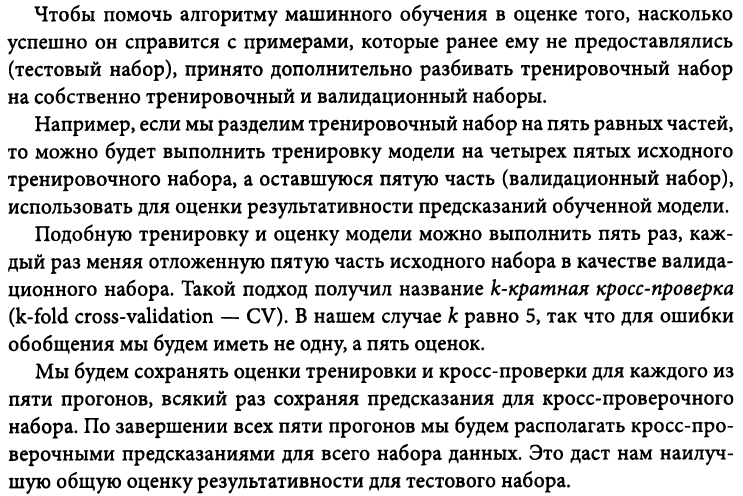

In [20]:
k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=10)

## Модели машинного обучения (Часть 1)

### Модель №1: Логистическая регрессия

Самый простой алгоритм классификации - <a href='https://habr.com/ru/company/io/blog/265007/'>логистическая регрессия</a>
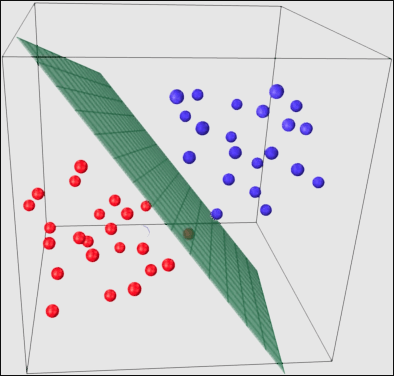

#### Настройка гиперпараметров

<b>penalty = 'l2'</b> - <a href='https://www.chioka.in/differences-between-l1-and-l2-as-loss-function-and-regularization/'>подробнее</a>. l2 регуляризация менее чувствительна к выбросам и назначает ненулевые веса почти по всем признакам, что приводит к более стабильному решению.    <p>
<b>C = 1.0</b> - интенсивность регуляризации. Регуляризация помогает бороться с переобучением, путем наложения штрафов за сложность. Значение по умолчанию 1.  <p>
<b>class_weight = 'balanced'</b> - так как набор является несбалансированным (всего 492 подделки на 285к операций). В таком случае, balanced позволит алгоритму приписывать большие веса положительным (мошенническим) меткам в процессе тренировки.  <p>
<b>random_state = 10</b> - для воспроизведения результатов  <p>
<b>solver = 'liblinear'</b>   - значение по умолчанию.   <p>
<b>n_jobs = 1</b> - кол-во ядер процессора. Так как используем liblinear, то будет 1 только.     <p>
<a href='https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html'>sklearn.linear_model.LogisticRegression</a>


In [21]:
penalty = 'l2'
C = 1.0
class_weight = 'balanced'
random_state = 10
solver = 'liblinear'
n_jobs = 1

logReg = LogisticRegression(penalty=penalty,
                            C=C,
                            class_weight=class_weight,
                            random_state=random_state,
                            solver=solver,
                            n_jobs=n_jobs)

#### Тренировка модели

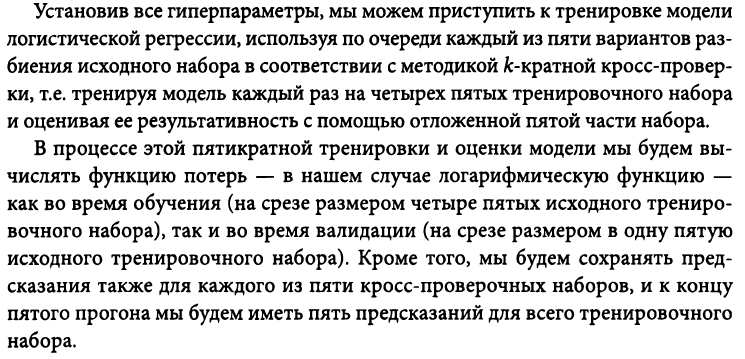

In [22]:
trainingScores = []
cvScores = []

predictionsBasedOnKFolds = pd.DataFrame(data=[],
                                        index=y_train.index,
                                        columns=[0, 1])
model = logReg

#смотреть рисунок ниже
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    
    #4/5 части тренировочного набора для обучения
    X_train_fold =  X_train.iloc[train_index, :]
    #1/5 части тренировочного набора для кросс-валидации
    X_cv_fold = X_train.iloc[cv_index, :]

    #4/5 части тренировочного набора для обучения
    y_train_fold = y_train.iloc[train_index]
    #1/5 части тренировочного набора для кросс-валидации
    y_cv_fold = y_train.iloc[cv_index]
    
    #обучение модели 4-мя блоками данных
    model.fit(X_train_fold, y_train_fold)
    
    #расчет логарифмической функции потерь на обучении
    loglossTraining = log_loss(y_train_fold, model.predict_proba(X_train_fold)[:, 1])
    #занесение расчета потерь в список
    trainingScores.append(loglossTraining)
    
    #занесение предсказаний по кросс-валидации в дата-фрейм.
    predictionsBasedOnKFolds.loc[X_cv_fold.index, :] = model.predict_proba(X_cv_fold)
    #расчет логарифмической функции потерь на кросс-валидации
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 1])
    #занечение расчета потерь в список
    cvScores.append(loglossCV)
    
    print(f'Логарифмические потери обучения: {loglossTraining}')
    print(f'Логарифмические потери валидации: {loglossCV}')
    print('-----------------------------------------------------')

#расчет логарифмической функции потерь по всему тренировочному набору
loglossLogisticRegression = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 1])
print(f'Логарифмические потери логистической регрессии: {loglossLogisticRegression}')

Логарифмические потери обучения: 0.11010264023404186
Логарифмические потери валидации: 0.11293943803242223
-----------------------------------------------------
Логарифмические потери обучения: 0.10653818989483926
Логарифмические потери валидации: 0.10312865651556537
-----------------------------------------------------
Логарифмические потери обучения: 0.11777914140850121
Логарифмические потери валидации: 0.1153261223533166
-----------------------------------------------------
Логарифмические потери обучения: 0.11422993740191201
Логарифмические потери валидации: 0.11434987008905226
-----------------------------------------------------
Логарифмические потери обучения: 0.11975527914994516
Логарифмические потери валидации: 0.12370963369857052
-----------------------------------------------------
Логарифмические потери логистической регрессии: 0.11389074413778542


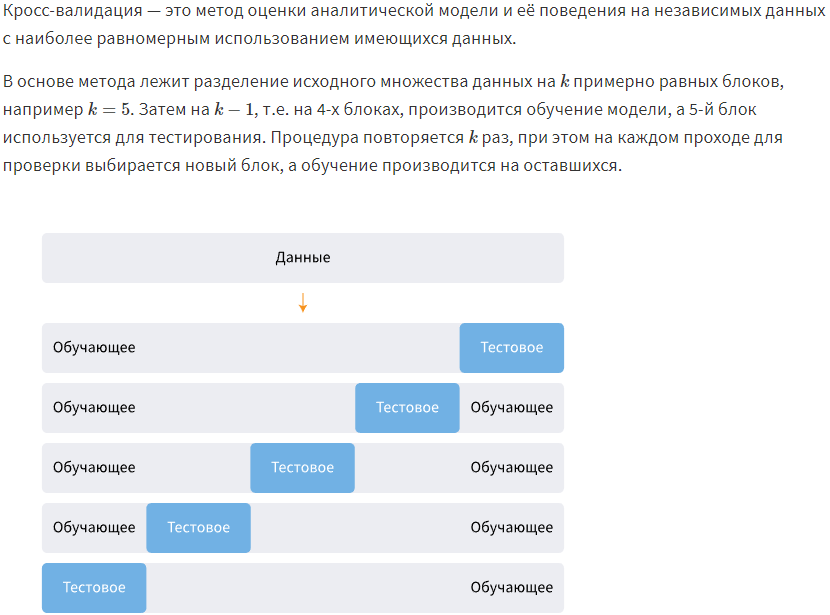

Касательно logloss зачем и почему:  
<a href='https://machinelearningmastery.ru/how-to-score-probability-predictions-in-python/'>Нежное введение в методы оценки вероятности в Python</a>  
<a href='https://datascience.eu/ru/%D0%BF%D1%80%D0%BE%D0%B3%D1%80%D0%B0%D0%BC%D0%BC%D0%B8%D1%80%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5/%D0%BB%D0%BE%D0%B3-%D0%BB%D0%BE%D1%81%D1%81/'>Лог-лосс</a>

#### Оценка результатов

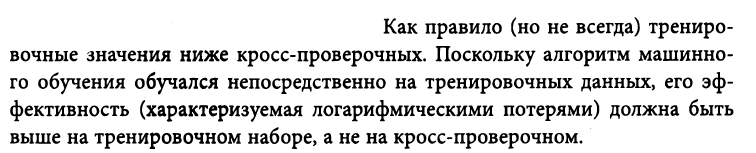

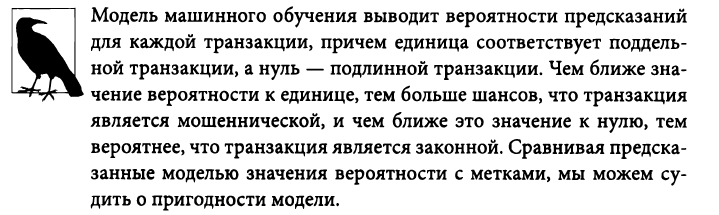

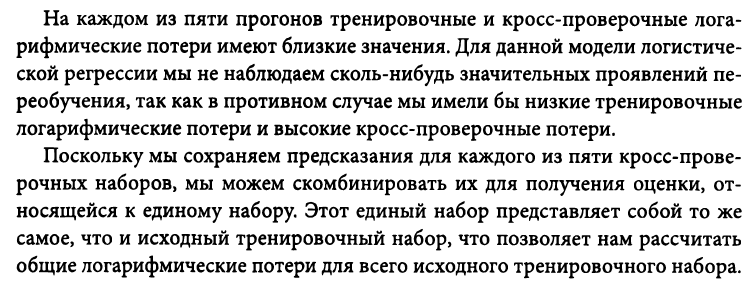

### Оценочные метрики

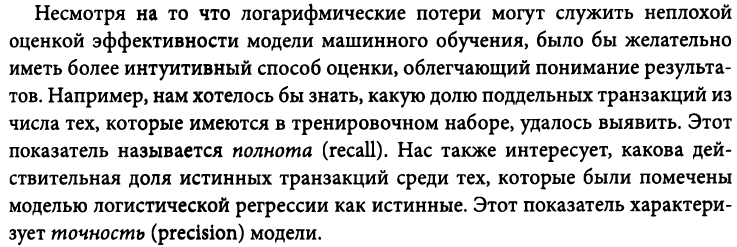

### Матрица неточностей

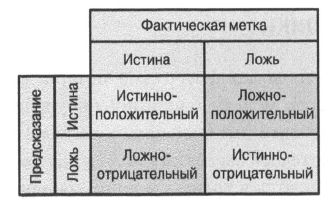

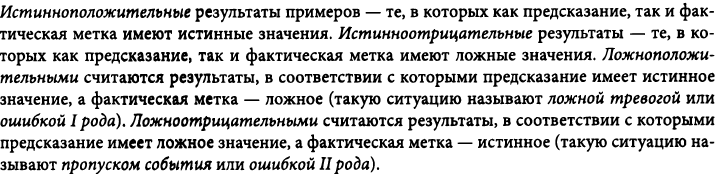

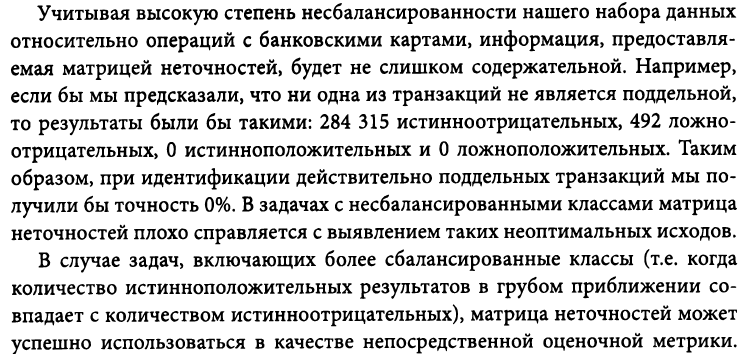

### Кривая "точность-полнота"

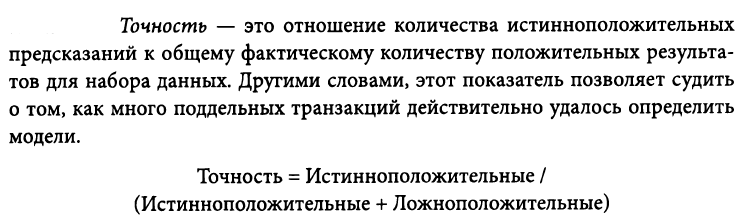

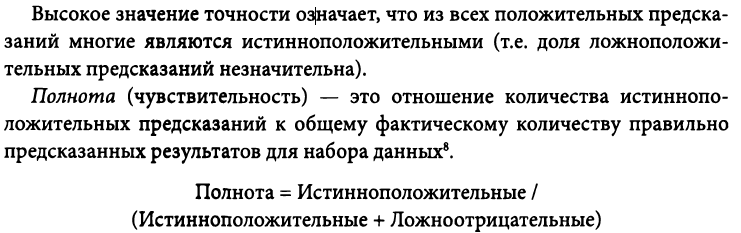

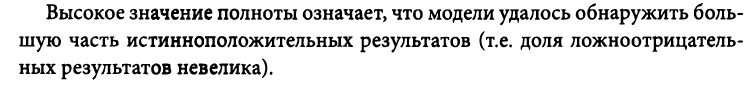

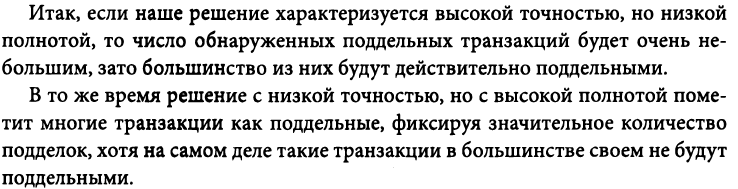

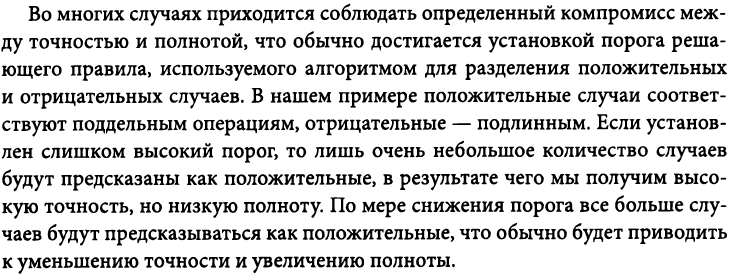

### Рабочая характеристика приемника

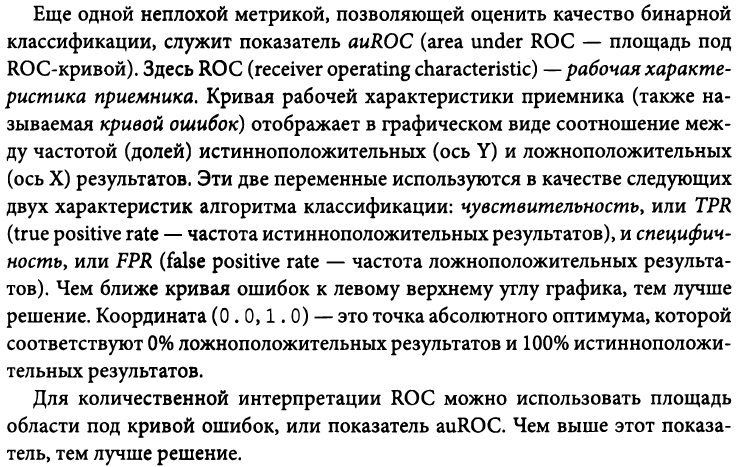

### Вычисление модели логистической регрессии

#### Кривая "точность-полнота"

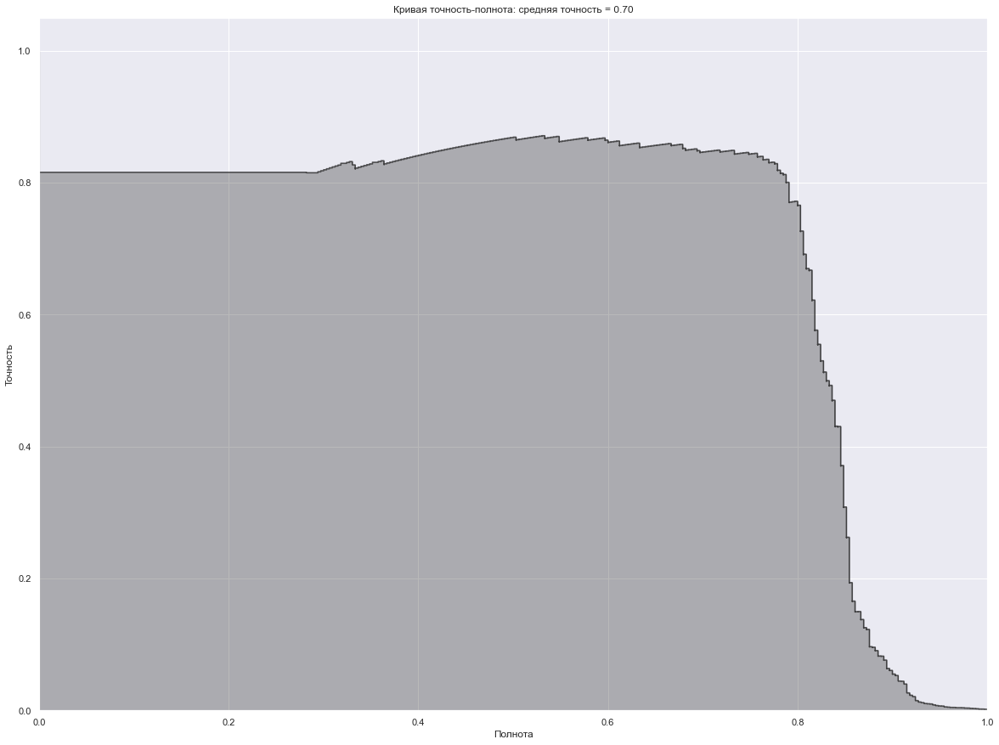

In [23]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:, 1]], axis=1)
preds.columns = ['trueLabel', 'prediction']
predictionsBasedOnKFoldsLogisticRegression = preds.copy()

#расчет метрики
precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])
#расчет метрики
average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

plt.step(recall, precision, color='k', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.3, color='k')

plt.xlabel('Полнота')
plt.ylabel('Точность')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Кривая точность-полнота: средняя точность = {0:0.2f}'.format(average_precision))
plt.show()

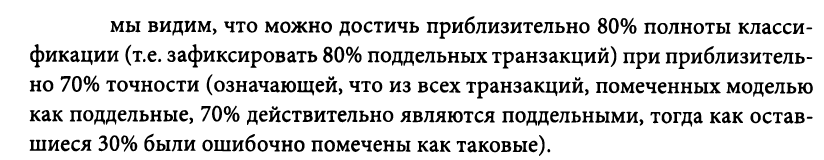

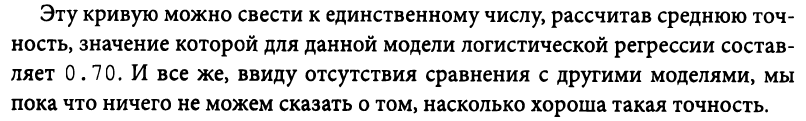

#### Показатель auROC

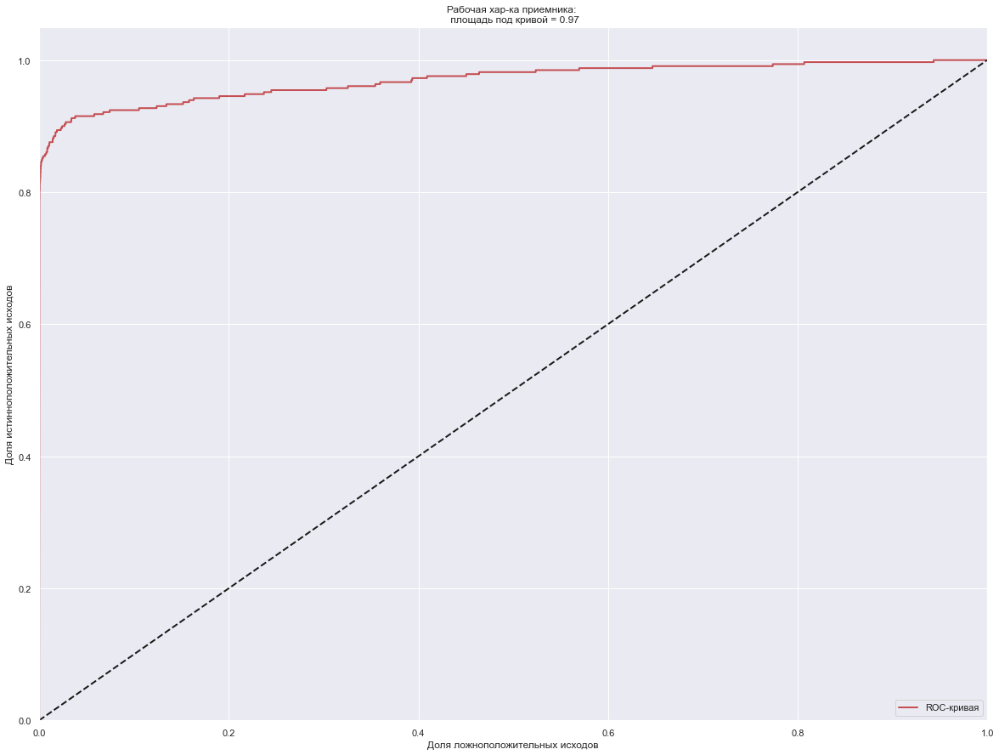

In [24]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'], preds['prediction'])

areaUnderROC = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC-кривая')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Доля ложноположительных исходов')
plt.ylabel('Доля истинноположительных исходов')
plt.title('Рабочая хар-ка приемника: \n площадь под кривой = {0:0.2f}'.format(areaUnderROC))
plt.legend(loc='lower right')
plt.show()

Про <a href='https://www.youtube.com/watch?v=m82eU_NkznM'>ROC</a>  
Судя по графику, мы получаем хорошую область в 0.97. Это хороший показатель на первый взгляд, но  
учитывая, что наши классы являются несбалансированными, то ранжировка объектов будет плохой все равно.

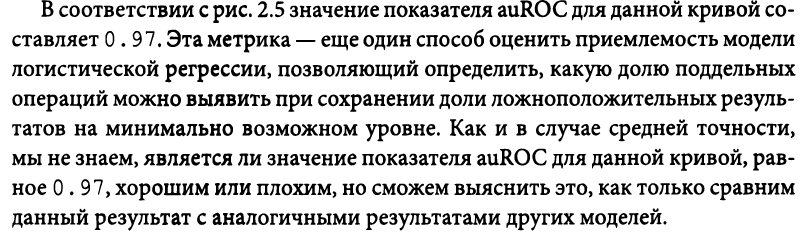

## Модели машинного обучения (Часть 2)

### Модель №2: Случайные леса

#### Настройка гиперпараметров

<b>n_estimators</b> - кол-во деревьев в лесу (по умолчанию 100)  
<b>max_features</b> - число признаков  
<b>max_depth</b> - максимальная глубина деревьев  
<b>min_samples_split</b> - минимальное число объектов, при котором выполняется расщепление  
<b>min_samples_leaf</b> - ограничение на число объектов в листьях     
<b>min_weight_fraction_leaf</b>  
<b>max_leaf_nodes</b>  
<b>bootstrap</b>  
<b>oob_score</b> - оценка обобщения    
<b>n_jobs</b> - кол-во процессоров (-1 : все процессоры используются)  
<b>random_state</b> - для воспроизводимости результата    
<b>class_weight</b> - для балансировки весов в зависимости от частоты (так как у нас баланса нет)  

Более подробно изучить можно:  
<a href='https://alexanderdyakonov.wordpress.com/2016/11/14/%D1%81%D0%BB%D1%83%D1%87%D0%B0%D0%B9%D0%BD%D1%8B%D0%B9-%D0%BB%D0%B5%D1%81-random-forest/'>Случайный лес (Random Forest)</a>  
<a href='https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html'>RandomForestClassifier</a>

In [25]:
n_estimators = 100 # раннее по умолчанию использовалось 10, теперь 100.
max_features = 'auto'
max_depth = None
min_samples_split = 2
min_samples_leaf = 1
min_weight_fraction_leaf = 0.0
max_leaf_nodes = None
bootstrap = True
oob_score = False
n_jobs = -1
random_state = 10
class_weight = 'balanced'

In [26]:
RFC = RandomForestClassifier(n_estimators=n_estimators,
                             max_features=max_features,
                             max_depth=max_depth,
                             min_samples_split=min_samples_split,
                             min_samples_leaf=min_samples_leaf,
                             min_weight_fraction_leaf=min_weight_fraction_leaf,
                             max_leaf_nodes=max_leaf_nodes,
                             bootstrap=bootstrap,
                             oob_score=oob_score,
                             n_jobs=n_jobs,
                             random_state=random_state,
                             class_weight=class_weight)

<b>Касательно: for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):</b>  
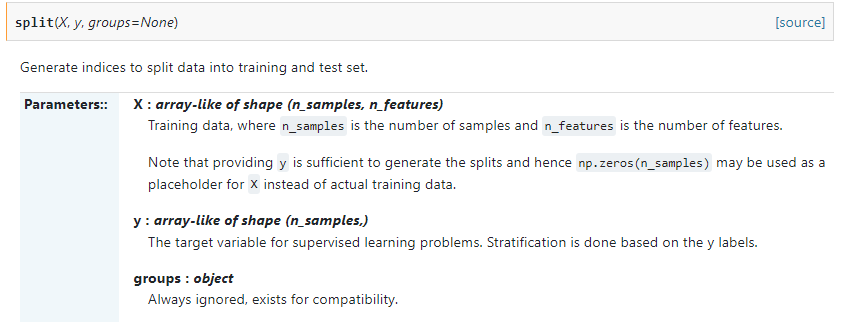

In [27]:
trainingScores = []
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index, columns=[0, 1])

model = RFC

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    
    X_train_fold = X_train.iloc[train_index, :]
    X_cv_fold = X_train.iloc[cv_index, :]
    
    y_train_fold = y_train.iloc[train_index]
    y_cv_fold = y_train.iloc[cv_index]
    
    model.fit(X_train_fold, y_train_fold)
    loglossTraining = log_loss(y_train_fold, model.predict_proba(X_train_fold)[:, 1])
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index, :] = model.predict_proba(X_cv_fold)
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 1])
    cvScores.append(loglossCV)

    print(f'Логарифмические потери обучения: {loglossTraining}')
    print(f'Логарифмические потери валидации: {loglossCV}')
    print('-----------------------------------------------------')

loglossRandomForestClassifier = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 1])
print(f'Логарифмические потери случайных лесов: {loglossRandomForestClassifier}' )

Логарифмические потери обучения: 0.0003815918429033415
Логарифмические потери валидации: 0.009381144657395521
-----------------------------------------------------
Логарифмические потери обучения: 0.00036213539648967267
Логарифмические потери валидации: 0.008938156077795774
-----------------------------------------------------
Логарифмические потери обучения: 0.00040802273391578136
Логарифмические потери валидации: 0.005722266741383716
-----------------------------------------------------
Логарифмические потери обучения: 0.0004057437140686687
Логарифмические потери валидации: 0.006604555529146658
-----------------------------------------------------
Логарифмические потери обучения: 0.0004250613769182105
Логарифмические потери валидации: 0.006344315037475822
-----------------------------------------------------
Логарифмические потери случайных лесов: 0.007398087608639499


<b>Обратим внимание на разницу потерь обучения и валидации!</b>  
Разница значительна и это точно указывает на определенную степень переобучения.  
Итоговые логарифмические потери составили ~0.00739, что гораздо меньше логистической регрессии (в 16 раз).  

#### Кривая "точность-полнота"

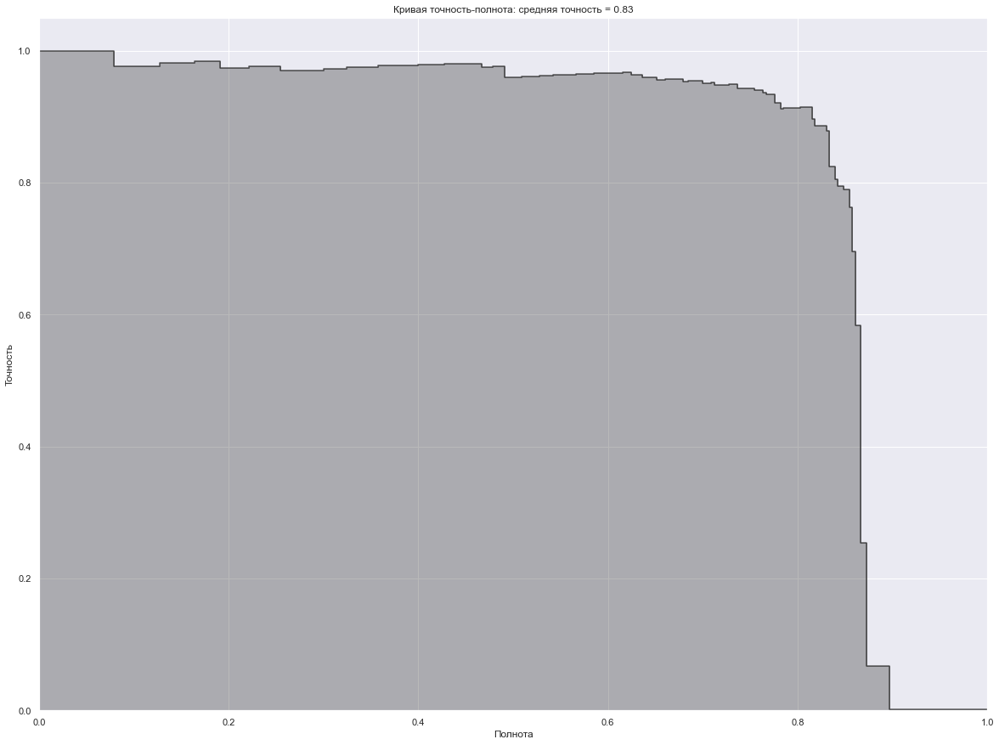

In [28]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:, 1]], axis=1)
preds.columns = ['trueLabel', 'prediction']
predictionsBasedOnKFoldsRandomForests = preds.copy()

#расчет метрики
precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])
#расчет метрики
average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

plt.step(recall, precision, color='k', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.3, color='k')

plt.xlabel('Полнота')
plt.ylabel('Точность')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Кривая точность-полнота: средняя точность = {0:0.2f}'.format(average_precision))
plt.show()

Модель в состоянии обнаружить приблизительно 85% мошеннических операций с точностью 83%.  
Данный результат гораздо лучше по сравнению с логистической регрессией, ее результаты: 80% с точностью 70%.  

#### Показатель auROC

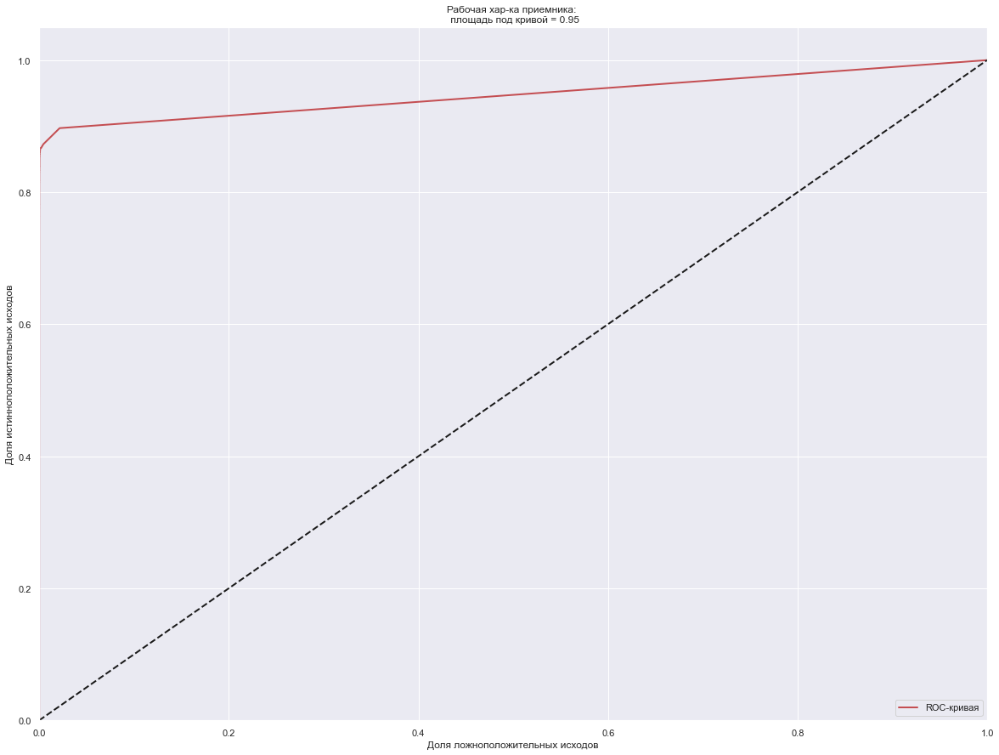

In [29]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'], preds['prediction'])

areaUnderROC = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC-кривая')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Доля ложноположительных исходов')
plt.ylabel('Доля истинноположительных исходов')
plt.title('Рабочая хар-ка приемника: \n площадь под кривой = {0:0.2f}'.format(areaUnderROC))
plt.legend(loc='lower right')
plt.show()

На данном графике "случайные леса" показали себя хуже логистической регрессии

## Модель №3: машина градиентного бустинга XGBoost

Более подробно <a href='https://neerc.ifmo.ru/wiki/index.php?title=XGBoost'><b>XGBoost Wiki</b></a> <a href='https://xgboost.readthedocs.io/en/stable/'><b>XGBoost Documentation</b></a>

#### Настройка гиперпараметров

<b>nthread</b> - кол-во паралельных потоков при запуске.    
<b>gamma</b> - [0;+∞) при увеличении снижается сложность (растет смещение, уменьшается дисперсия). [default = 0]  
<b>max_depth</b> - максимальная глубина дерева. Увеличение делает модель более сложной и с большей вероятностью переобучения. 0 - отсутствие ограничения.  [default = 0]  
<b>min_child_weight</b> - [0;+∞) минимальный вес экземпляра. Если шаг разделения приводит к узлу с суммой весов меньше указанной, то дальшейнего разделения не будет. [default = 1]  
<b>max_delta_step</b> - [0;+∞) помогает при несбалансированных классах, значение 1-10 помогает контролировать. 0 - без ограничений. [default = 0]  
<b>subsample</b> - (0;1] соотношение подвыборки обучающих экземпляров. 0.5 - XGBoost случайно выбирает половину обучающих даных перед постройкой деревьев - предотвратит переоснащение. [default = 1]  
<b>colsample_bytree</b> - отношение подвыборки столбцов при построении каждого дерева. [default = 1]  
<b>objective</b> - цель обучения. [default=reg:squarederror]    
<b>num_class</b> - кол-во классов.   
<b>eval_metric</b> - метрики оценки.    
<b>seed</b> - воспроизводимость результатов.    <p>
<a href='https://xgboost.readthedocs.io/en/stable/parameter.html'>Более подробно о гиперпараметрах XGBoost</a>

In [30]:
params_xGB = {
    'nthread': 16,
    'gamma': 0,
    'max_depth': 6,
    'min_child_weight': 1,
    'max_delta_step': 0,
    'subsample': 1.0,
    'colsample_bytree': 1.0,
    'objective': 'binary:logistic',
    'num_class': 1,
    'eval_metric': 'logloss',
    'seed': 10
}

#### Тренировка модели

In [31]:
trainingScores = []
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index, columns=['prediction'])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    
    X_train_fold = X_train.iloc[train_index, :]
    X_cv_fold = X_train.iloc[cv_index, :]
    
    y_train_fold = y_train.iloc[train_index]
    y_cv_fold = y_train.iloc[cv_index]
    
    dtrain = xgb.DMatrix(data=X_train_fold, label=y_train_fold)
    dCV = xgb.DMatrix(data=X_cv_fold)
    
    bst = xgb.cv(params_xGB, dtrain, num_boost_round=2000, nfold=5, early_stopping_rounds=200, verbose_eval=50)
    
    best_rounds = np.argmin(bst['test-logloss-mean'])
    bst = xgb.train(params_xGB, dtrain, best_rounds)
    
    loglossTraining = log_loss(y_train_fold, bst.predict(dtrain))
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index, 'prediction'] = bst.predict(dCV)
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 'prediction'])
    cvScores.append(loglossCV)
    
    print(f'Логарифмические потери обучения: {loglossTraining}')
    print(f'Логарифмические потери валидации: {loglossCV}')
    print('-----------------------------------------------------')
    
loglossXGBoostGradientBoosting = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 'prediction'])
print(f'Логарифмические потери градиентного бустинга XGBoost: {loglossXGBoostGradientBoosting}')

[0]	train-logloss:0.43791+0.00006	test-logloss:0.43803+0.00007
[50]	train-logloss:0.00014+0.00001	test-logloss:0.00311+0.00090
[100]	train-logloss:0.00006+0.00000	test-logloss:0.00339+0.00106
[150]	train-logloss:0.00004+0.00000	test-logloss:0.00347+0.00110
[200]	train-logloss:0.00003+0.00000	test-logloss:0.00354+0.00115
[226]	train-logloss:0.00003+0.00000	test-logloss:0.00357+0.00116
Логарифмические потери обучения: 0.0011210107855412663
Логарифмические потери валидации: 0.0031136071400901435
-----------------------------------------------------
[0]	train-logloss:0.43785+0.00002	test-logloss:0.43798+0.00004
[50]	train-logloss:0.00013+0.00001	test-logloss:0.00285+0.00067
[100]	train-logloss:0.00005+0.00000	test-logloss:0.00309+0.00072
[150]	train-logloss:0.00004+0.00000	test-logloss:0.00318+0.00074
[200]	train-logloss:0.00003+0.00000	test-logloss:0.00323+0.00075
[229]	train-logloss:0.00003+0.00000	test-logloss:0.00326+0.00076
Логарифмические потери обучения: 0.0007230162798940947
Логари

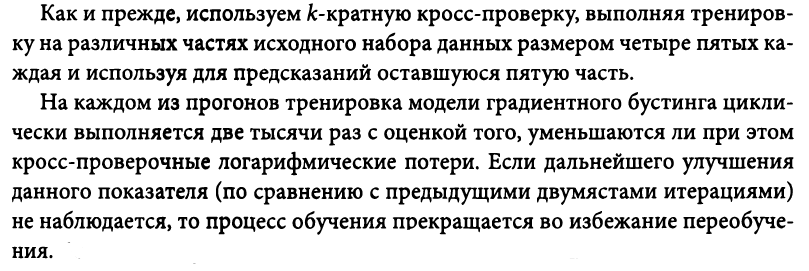

Логарифмические потери градиентного бустинга XGBoost составили: 0.0028, что в 2.6 раз лучше случайных лесов.


#### Кривая "точность-полнота"

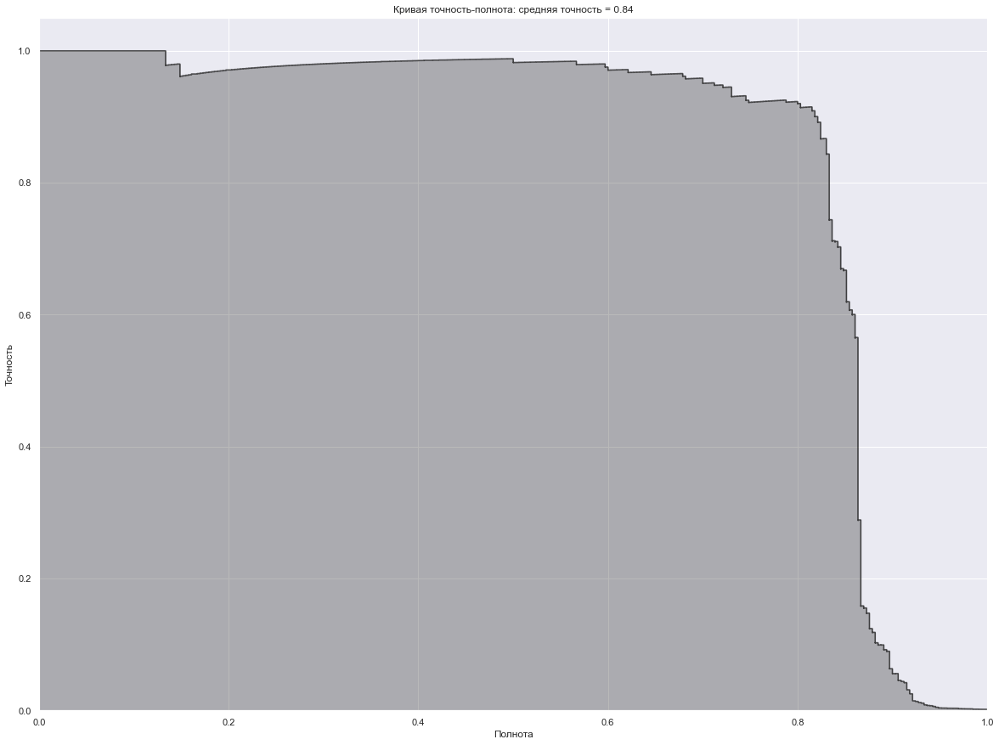

In [32]:
preds = pd.concat([y_train, predictionsBasedOnKFolds], axis=1)
preds.columns = ['trueLabel', 'prediction']
predictionsBasedOnKFoldsXGBoostGradientBoosting = preds.copy()

#расчет метрики
precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])
#расчет метрики
average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

plt.step(recall, precision, color='k', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.3, color='k')

plt.xlabel('Полнота')
plt.ylabel('Точность')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Кривая точность-полнота: средняя точность = {0:0.2f}'.format(average_precision))
plt.show()

Получаем небольшое увеличение средней точности.

#### Показатель auROC

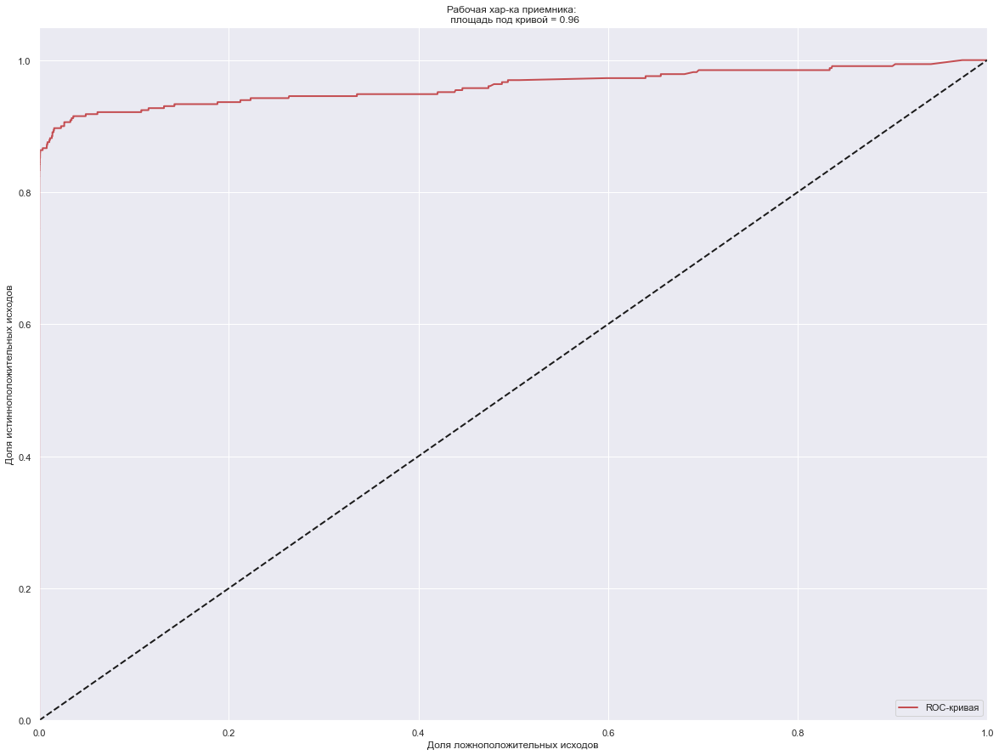

In [33]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'], preds['prediction'])

areaUnderROC = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC-кривая')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Доля ложноположительных исходов')
plt.ylabel('Доля истинноположительных исходов')
plt.title('Рабочая хар-ка приемника: \n площадь под кривой = {0:0.2f}'.format(areaUnderROC))
plt.legend(loc='lower right')
plt.show()

Показатель площади под кривой тоже лишь немного выше

## Модель №4: машина градиентного бустинга LightGBM

### Настройка гиперпараметров

<b>task</b> - 'train' указание задачи.  
<b>application</b> -    
<b>num_class</b> - количество классов.  
<b>boosting</b> -   
<b>objective</b> -   
<b>metric</b> -   
<b>metric_freq</b> -    
<b>is_training_metric</b> -   
<b>max_depth</b> - ограничение глубины дерева.  
<b>num_leaves</b> - параметр сложности модели (кол-во листьев). Необходимо чтобы при настройке значение было < 2**(max_depth), иначе получим переобучение, а слишком низкое значение покажет низкую точность.  
<b>learning_rate</b> - влияет на точность обучения.  
<b>feature_fraction</b> - [0, 1] использование признаков. По умолчанию (1), используются все данные.  
<b>bagging_fraction</b> - [0, 1] по умолчанию (1) использует все наблюдения при обучении на каждой итерации.   
<b>bagging_freq</b> - частота новой выборки.  
<b>bagging_seed</b> - воспроизводимость результатов.  
<b>verbose</b> -   
<b>num_threads</b> - кол-во используемых ядер при обучении модели.     
<p>  
<a href='https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html'>LightGBM гиперпараметры</a>  

In [34]:
params_lightGB = {
    'task': 'train',
    'num_class': 1,
    'boosting': 'gbdt',
    'objective': 'binary',
    'metric': 'binary_logloss',
    'metric_freq': 50,
    'is_training_metric': False,
    'max_depth': -1,
    'num_leaves': 4,
    'learning_rate': 0.01,
    'feature_fraction': 1.0,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'bagging_seed': 10,
    'verbose': -1,
    'num_threads': 8,
}

In [35]:
trainingScores = []
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index, columns=['prediction'])

loglosstrainlist = []
loglosscvlist = []

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    
    X_train_fold = X_train.iloc[train_index, :]
    X_cv_fold = X_train.iloc[cv_index, :]
    
    y_train_fold = y_train.iloc[train_index]
    y_cv_fold = y_train.iloc[cv_index]
    
    lgb_train = lgb.Dataset(X_train_fold, y_train_fold)
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration))
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index, 'prediction'] = gbm.predict(X_cv_fold, num_iteration=gbm.best_iteration)
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 'prediction'])
    cvScores.append(loglossCV)
    
    loglosstrainlist.append(loglossTraining)
    loglosscvlist.append(loglossCV)

for el in range(0, len(loglosstrainlist)):
    print(f'Логарифмические потери обучения: {loglosstrainlist[el]}')
    print(f'Логарифмические потери валидации: {loglosscvlist[el]}')
    print('-----------------------------------------------------')
    
loglossLightGBMGradientBoosting = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 'prediction'])
print(f'Логарифмические потери градиентного бустинга LightGBM: {loglossLightGBMGradientBoosting}')

[1]	valid_0's binary_logloss: 0.00662261
Training until validation scores don't improve for 200 rounds
[2]	valid_0's binary_logloss: 0.00655834
[3]	valid_0's binary_logloss: 0.00643596
[4]	valid_0's binary_logloss: 0.0063513
[5]	valid_0's binary_logloss: 0.00629734
[6]	valid_0's binary_logloss: 0.00622967
[7]	valid_0's binary_logloss: 0.00618105
[8]	valid_0's binary_logloss: 0.0061281
[9]	valid_0's binary_logloss: 0.00608081
[10]	valid_0's binary_logloss: 0.00603648
[11]	valid_0's binary_logloss: 0.00598941
[12]	valid_0's binary_logloss: 0.00594617
[13]	valid_0's binary_logloss: 0.00590259
[14]	valid_0's binary_logloss: 0.00585704
[15]	valid_0's binary_logloss: 0.00581851
[16]	valid_0's binary_logloss: 0.00577975
[17]	valid_0's binary_logloss: 0.00574206
[18]	valid_0's binary_logloss: 0.00570075
[19]	valid_0's binary_logloss: 0.00566492
[20]	valid_0's binary_logloss: 0.00562775
[21]	valid_0's binary_logloss: 0.00559013
[22]	valid_0's binary_logloss: 0.00554477
[23]	valid_0's binary_log

[227]	valid_0's binary_logloss: 0.00343446
[228]	valid_0's binary_logloss: 0.00343109
[229]	valid_0's binary_logloss: 0.00342893
[230]	valid_0's binary_logloss: 0.00342661
[231]	valid_0's binary_logloss: 0.00342425
[232]	valid_0's binary_logloss: 0.0034217
[233]	valid_0's binary_logloss: 0.0034193
[234]	valid_0's binary_logloss: 0.00341804
[235]	valid_0's binary_logloss: 0.00341731
[236]	valid_0's binary_logloss: 0.00341495
[237]	valid_0's binary_logloss: 0.00341376
[238]	valid_0's binary_logloss: 0.00341144
[239]	valid_0's binary_logloss: 0.00340909
[240]	valid_0's binary_logloss: 0.00340602
[241]	valid_0's binary_logloss: 0.00340139
[242]	valid_0's binary_logloss: 0.00339992
[243]	valid_0's binary_logloss: 0.00339761
[244]	valid_0's binary_logloss: 0.00339541
[245]	valid_0's binary_logloss: 0.00339481
[246]	valid_0's binary_logloss: 0.00339377
[247]	valid_0's binary_logloss: 0.0033912
[248]	valid_0's binary_logloss: 0.00338908
[249]	valid_0's binary_logloss: 0.00338852
[250]	valid_0'

[431]	valid_0's binary_logloss: 0.00321726
[432]	valid_0's binary_logloss: 0.00321749
[433]	valid_0's binary_logloss: 0.00321663
[434]	valid_0's binary_logloss: 0.00321654
[435]	valid_0's binary_logloss: 0.00321609
[436]	valid_0's binary_logloss: 0.00321645
[437]	valid_0's binary_logloss: 0.00321649
[438]	valid_0's binary_logloss: 0.00321649
[439]	valid_0's binary_logloss: 0.00321581
[440]	valid_0's binary_logloss: 0.00321607
[441]	valid_0's binary_logloss: 0.0032156
[442]	valid_0's binary_logloss: 0.00321573
[443]	valid_0's binary_logloss: 0.00321531
[444]	valid_0's binary_logloss: 0.00321498
[445]	valid_0's binary_logloss: 0.00321457
[446]	valid_0's binary_logloss: 0.00321182
[447]	valid_0's binary_logloss: 0.00321152
[448]	valid_0's binary_logloss: 0.00321113
[449]	valid_0's binary_logloss: 0.00321124
[450]	valid_0's binary_logloss: 0.00321098
[451]	valid_0's binary_logloss: 0.00321099
[452]	valid_0's binary_logloss: 0.00320854
[453]	valid_0's binary_logloss: 0.00320777
[454]	valid_

[624]	valid_0's binary_logloss: 0.00316636
[625]	valid_0's binary_logloss: 0.00316692
[626]	valid_0's binary_logloss: 0.0031655
[627]	valid_0's binary_logloss: 0.00316534
[628]	valid_0's binary_logloss: 0.00316487
[629]	valid_0's binary_logloss: 0.00316542
[630]	valid_0's binary_logloss: 0.00316499
[631]	valid_0's binary_logloss: 0.00316546
[632]	valid_0's binary_logloss: 0.00316554
[633]	valid_0's binary_logloss: 0.00316447
[634]	valid_0's binary_logloss: 0.00316304
[635]	valid_0's binary_logloss: 0.00316255
[636]	valid_0's binary_logloss: 0.0031626
[637]	valid_0's binary_logloss: 0.00316167
[638]	valid_0's binary_logloss: 0.00316151
[639]	valid_0's binary_logloss: 0.00316212
[640]	valid_0's binary_logloss: 0.00316196
[641]	valid_0's binary_logloss: 0.00316155
[642]	valid_0's binary_logloss: 0.0031619
[643]	valid_0's binary_logloss: 0.00316189
[644]	valid_0's binary_logloss: 0.00316222
[645]	valid_0's binary_logloss: 0.00316271
[646]	valid_0's binary_logloss: 0.00316301
[647]	valid_0'

[1008]	valid_0's binary_logloss: 0.00309766
[1009]	valid_0's binary_logloss: 0.00309717
[1010]	valid_0's binary_logloss: 0.00309753
[1011]	valid_0's binary_logloss: 0.00309837
[1012]	valid_0's binary_logloss: 0.00309837
[1013]	valid_0's binary_logloss: 0.00309815
[1014]	valid_0's binary_logloss: 0.00309767
[1015]	valid_0's binary_logloss: 0.00309701
[1016]	valid_0's binary_logloss: 0.00309725
[1017]	valid_0's binary_logloss: 0.00309809
[1018]	valid_0's binary_logloss: 0.00309819
[1019]	valid_0's binary_logloss: 0.00309824
[1020]	valid_0's binary_logloss: 0.00309816
[1021]	valid_0's binary_logloss: 0.00309828
[1022]	valid_0's binary_logloss: 0.00309783
[1023]	valid_0's binary_logloss: 0.00309762
[1024]	valid_0's binary_logloss: 0.00309662
[1025]	valid_0's binary_logloss: 0.00309719
[1026]	valid_0's binary_logloss: 0.00309735
[1027]	valid_0's binary_logloss: 0.0030981
[1028]	valid_0's binary_logloss: 0.00309831
[1029]	valid_0's binary_logloss: 0.00309837
[1030]	valid_0's binary_logloss: 

[1209]	valid_0's binary_logloss: 0.00310856
[1210]	valid_0's binary_logloss: 0.00310843
[1211]	valid_0's binary_logloss: 0.0031082
[1212]	valid_0's binary_logloss: 0.00310817
[1213]	valid_0's binary_logloss: 0.00310821
[1214]	valid_0's binary_logloss: 0.00310862
[1215]	valid_0's binary_logloss: 0.00310881
[1216]	valid_0's binary_logloss: 0.00310877
[1217]	valid_0's binary_logloss: 0.00310923
[1218]	valid_0's binary_logloss: 0.00310929
[1219]	valid_0's binary_logloss: 0.00310935
[1220]	valid_0's binary_logloss: 0.00310991
[1221]	valid_0's binary_logloss: 0.00311008
[1222]	valid_0's binary_logloss: 0.00311012
[1223]	valid_0's binary_logloss: 0.00310971
[1224]	valid_0's binary_logloss: 0.00310969
Early stopping, best iteration is:
[1024]	valid_0's binary_logloss: 0.00309662
[1]	valid_0's binary_logloss: 0.00720587
Training until validation scores don't improve for 200 rounds
[2]	valid_0's binary_logloss: 0.00706536
[3]	valid_0's binary_logloss: 0.00701255
[4]	valid_0's binary_logloss: 0.0

[177]	valid_0's binary_logloss: 0.00431203
[178]	valid_0's binary_logloss: 0.00430983
[179]	valid_0's binary_logloss: 0.00430834
[180]	valid_0's binary_logloss: 0.00430368
[181]	valid_0's binary_logloss: 0.00430229
[182]	valid_0's binary_logloss: 0.00430065
[183]	valid_0's binary_logloss: 0.00429612
[184]	valid_0's binary_logloss: 0.00429413
[185]	valid_0's binary_logloss: 0.0042929
[186]	valid_0's binary_logloss: 0.00428851
[187]	valid_0's binary_logloss: 0.00428737
[188]	valid_0's binary_logloss: 0.00428308
[189]	valid_0's binary_logloss: 0.00428231
[190]	valid_0's binary_logloss: 0.00428053
[191]	valid_0's binary_logloss: 0.00427637
[192]	valid_0's binary_logloss: 0.00427515
[193]	valid_0's binary_logloss: 0.00427405
[194]	valid_0's binary_logloss: 0.00427001
[195]	valid_0's binary_logloss: 0.004269
[196]	valid_0's binary_logloss: 0.00426505
[197]	valid_0's binary_logloss: 0.00426348
[198]	valid_0's binary_logloss: 0.00426257
[199]	valid_0's binary_logloss: 0.00425874
[200]	valid_0'

[389]	valid_0's binary_logloss: 0.00412972
[390]	valid_0's binary_logloss: 0.00413015
[391]	valid_0's binary_logloss: 0.00413029
[392]	valid_0's binary_logloss: 0.00412978
[393]	valid_0's binary_logloss: 0.00412845
[394]	valid_0's binary_logloss: 0.00412862
[395]	valid_0's binary_logloss: 0.00412801
[396]	valid_0's binary_logloss: 0.00412763
[397]	valid_0's binary_logloss: 0.00412782
[398]	valid_0's binary_logloss: 0.00412653
[399]	valid_0's binary_logloss: 0.00412678
[400]	valid_0's binary_logloss: 0.00412642
[401]	valid_0's binary_logloss: 0.00412733
[402]	valid_0's binary_logloss: 0.00412417
[403]	valid_0's binary_logloss: 0.00412301
[404]	valid_0's binary_logloss: 0.00412432
[405]	valid_0's binary_logloss: 0.0041238
[406]	valid_0's binary_logloss: 0.00412445
[407]	valid_0's binary_logloss: 0.00412406
[408]	valid_0's binary_logloss: 0.00412431
[409]	valid_0's binary_logloss: 0.00412369
[410]	valid_0's binary_logloss: 0.00412337
[411]	valid_0's binary_logloss: 0.00412224
[412]	valid_

[582]	valid_0's binary_logloss: 0.00403033
[583]	valid_0's binary_logloss: 0.00403051
[584]	valid_0's binary_logloss: 0.00402953
[585]	valid_0's binary_logloss: 0.00402884
[586]	valid_0's binary_logloss: 0.00402932
[587]	valid_0's binary_logloss: 0.00402981
[588]	valid_0's binary_logloss: 0.00402732
[589]	valid_0's binary_logloss: 0.00402766
[590]	valid_0's binary_logloss: 0.00402807
[591]	valid_0's binary_logloss: 0.00402743
[592]	valid_0's binary_logloss: 0.00402767
[593]	valid_0's binary_logloss: 0.00402812
[594]	valid_0's binary_logloss: 0.0040278
[595]	valid_0's binary_logloss: 0.00402597
[596]	valid_0's binary_logloss: 0.00402639
[597]	valid_0's binary_logloss: 0.00402677
[598]	valid_0's binary_logloss: 0.00402697
[599]	valid_0's binary_logloss: 0.00402622
[600]	valid_0's binary_logloss: 0.00402673
[601]	valid_0's binary_logloss: 0.00402547
[602]	valid_0's binary_logloss: 0.00402572
[603]	valid_0's binary_logloss: 0.00402591
[604]	valid_0's binary_logloss: 0.00402583
[605]	valid_

[775]	valid_0's binary_logloss: 0.00401273
[776]	valid_0's binary_logloss: 0.00401243
[777]	valid_0's binary_logloss: 0.00401143
[778]	valid_0's binary_logloss: 0.00401135
[779]	valid_0's binary_logloss: 0.00401221
[780]	valid_0's binary_logloss: 0.00401212
[781]	valid_0's binary_logloss: 0.00401245
[782]	valid_0's binary_logloss: 0.00401167
[783]	valid_0's binary_logloss: 0.00401221
[784]	valid_0's binary_logloss: 0.00401195
[785]	valid_0's binary_logloss: 0.00401209
[786]	valid_0's binary_logloss: 0.00401128
[787]	valid_0's binary_logloss: 0.00401124
[788]	valid_0's binary_logloss: 0.00401099
[789]	valid_0's binary_logloss: 0.00401139
[790]	valid_0's binary_logloss: 0.00401218
[791]	valid_0's binary_logloss: 0.00401175
[792]	valid_0's binary_logloss: 0.00401134
[793]	valid_0's binary_logloss: 0.00401171
[794]	valid_0's binary_logloss: 0.00401161
[795]	valid_0's binary_logloss: 0.00401132
[796]	valid_0's binary_logloss: 0.00401062
[797]	valid_0's binary_logloss: 0.00401061
[798]	valid

[970]	valid_0's binary_logloss: 0.0039719
[971]	valid_0's binary_logloss: 0.00397148
[972]	valid_0's binary_logloss: 0.00397084
[973]	valid_0's binary_logloss: 0.00397103
[974]	valid_0's binary_logloss: 0.00397106
[975]	valid_0's binary_logloss: 0.0039713
[976]	valid_0's binary_logloss: 0.00397071
[977]	valid_0's binary_logloss: 0.00397017
[978]	valid_0's binary_logloss: 0.00397011
[979]	valid_0's binary_logloss: 0.00396888
[980]	valid_0's binary_logloss: 0.00396851
[981]	valid_0's binary_logloss: 0.00396909
[982]	valid_0's binary_logloss: 0.00396924
[983]	valid_0's binary_logloss: 0.00397013
[984]	valid_0's binary_logloss: 0.00396969
[985]	valid_0's binary_logloss: 0.00396986
[986]	valid_0's binary_logloss: 0.00397064
[987]	valid_0's binary_logloss: 0.00396973
[988]	valid_0's binary_logloss: 0.0039701
[989]	valid_0's binary_logloss: 0.00396975
[990]	valid_0's binary_logloss: 0.00396936
[991]	valid_0's binary_logloss: 0.00396976
[992]	valid_0's binary_logloss: 0.00396958
[993]	valid_0'

[1189]	valid_0's binary_logloss: 0.00395647
[1190]	valid_0's binary_logloss: 0.0039581
[1191]	valid_0's binary_logloss: 0.00395821
[1192]	valid_0's binary_logloss: 0.0039584
[1193]	valid_0's binary_logloss: 0.00395828
[1194]	valid_0's binary_logloss: 0.00395764
[1195]	valid_0's binary_logloss: 0.00395821
[1196]	valid_0's binary_logloss: 0.00395847
[1197]	valid_0's binary_logloss: 0.00395838
[1198]	valid_0's binary_logloss: 0.00395797
[1199]	valid_0's binary_logloss: 0.00395769
[1200]	valid_0's binary_logloss: 0.00395744
[1201]	valid_0's binary_logloss: 0.0039577
[1202]	valid_0's binary_logloss: 0.00395761
[1203]	valid_0's binary_logloss: 0.00395697
[1204]	valid_0's binary_logloss: 0.00395708
[1205]	valid_0's binary_logloss: 0.00395692
[1206]	valid_0's binary_logloss: 0.00395664
[1207]	valid_0's binary_logloss: 0.0039563
[1208]	valid_0's binary_logloss: 0.00395681
[1209]	valid_0's binary_logloss: 0.0039569
[1210]	valid_0's binary_logloss: 0.0039571
[1211]	valid_0's binary_logloss: 0.003

[1377]	valid_0's binary_logloss: 0.00395688
[1378]	valid_0's binary_logloss: 0.00395632
[1379]	valid_0's binary_logloss: 0.0039568
[1380]	valid_0's binary_logloss: 0.00395595
[1381]	valid_0's binary_logloss: 0.00395584
[1382]	valid_0's binary_logloss: 0.00395614
[1383]	valid_0's binary_logloss: 0.00395669
[1384]	valid_0's binary_logloss: 0.00395637
[1385]	valid_0's binary_logloss: 0.0039566
[1386]	valid_0's binary_logloss: 0.0039564
[1387]	valid_0's binary_logloss: 0.00395684
[1388]	valid_0's binary_logloss: 0.00395658
[1389]	valid_0's binary_logloss: 0.00395706
[1390]	valid_0's binary_logloss: 0.00395673
[1391]	valid_0's binary_logloss: 0.00395654
[1392]	valid_0's binary_logloss: 0.00395724
[1393]	valid_0's binary_logloss: 0.00395886
[1394]	valid_0's binary_logloss: 0.00395875
[1395]	valid_0's binary_logloss: 0.00395729
[1396]	valid_0's binary_logloss: 0.00395762
[1397]	valid_0's binary_logloss: 0.00395731
[1398]	valid_0's binary_logloss: 0.0039572
[1399]	valid_0's binary_logloss: 0.0

[1576]	valid_0's binary_logloss: 0.00395481
[1577]	valid_0's binary_logloss: 0.0039548
[1578]	valid_0's binary_logloss: 0.00395496
[1579]	valid_0's binary_logloss: 0.0039545
[1580]	valid_0's binary_logloss: 0.00395548
[1581]	valid_0's binary_logloss: 0.00395512
[1582]	valid_0's binary_logloss: 0.00395484
[1583]	valid_0's binary_logloss: 0.00395501
[1584]	valid_0's binary_logloss: 0.00395561
[1585]	valid_0's binary_logloss: 0.00395693
[1586]	valid_0's binary_logloss: 0.00395637
[1587]	valid_0's binary_logloss: 0.00395661
[1588]	valid_0's binary_logloss: 0.00395676
[1589]	valid_0's binary_logloss: 0.003956
[1590]	valid_0's binary_logloss: 0.0039559
[1591]	valid_0's binary_logloss: 0.00395568
[1592]	valid_0's binary_logloss: 0.00395666
[1593]	valid_0's binary_logloss: 0.0039563
[1594]	valid_0's binary_logloss: 0.00395647
[1595]	valid_0's binary_logloss: 0.00395585
[1596]	valid_0's binary_logloss: 0.00395585
[1597]	valid_0's binary_logloss: 0.00395551
[1598]	valid_0's binary_logloss: 0.003

[133]	valid_0's binary_logloss: 0.00327282
[134]	valid_0's binary_logloss: 0.00326585
[135]	valid_0's binary_logloss: 0.00325914
[136]	valid_0's binary_logloss: 0.00325189
[137]	valid_0's binary_logloss: 0.00324358
[138]	valid_0's binary_logloss: 0.00323881
[139]	valid_0's binary_logloss: 0.00323246
[140]	valid_0's binary_logloss: 0.00322556
[141]	valid_0's binary_logloss: 0.00321756
[142]	valid_0's binary_logloss: 0.00321148
[143]	valid_0's binary_logloss: 0.00320702
[144]	valid_0's binary_logloss: 0.00320045
[145]	valid_0's binary_logloss: 0.00319274
[146]	valid_0's binary_logloss: 0.00318699
[147]	valid_0's binary_logloss: 0.00318278
[148]	valid_0's binary_logloss: 0.00317604
[149]	valid_0's binary_logloss: 0.00316984
[150]	valid_0's binary_logloss: 0.00316247
[151]	valid_0's binary_logloss: 0.00315623
[152]	valid_0's binary_logloss: 0.00314917
[153]	valid_0's binary_logloss: 0.00314821
[154]	valid_0's binary_logloss: 0.00313792
[155]	valid_0's binary_logloss: 0.00313401
[156]	valid

[353]	valid_0's binary_logloss: 0.00271083
[354]	valid_0's binary_logloss: 0.00271014
[355]	valid_0's binary_logloss: 0.00271003
[356]	valid_0's binary_logloss: 0.0027082
[357]	valid_0's binary_logloss: 0.00270753
[358]	valid_0's binary_logloss: 0.00270686
[359]	valid_0's binary_logloss: 0.00270598
[360]	valid_0's binary_logloss: 0.00270534
[361]	valid_0's binary_logloss: 0.00270486
[362]	valid_0's binary_logloss: 0.00270348
[363]	valid_0's binary_logloss: 0.00270193
[364]	valid_0's binary_logloss: 0.00270147
[365]	valid_0's binary_logloss: 0.00270061
[366]	valid_0's binary_logloss: 0.00269885
[367]	valid_0's binary_logloss: 0.002698
[368]	valid_0's binary_logloss: 0.00269802
[369]	valid_0's binary_logloss: 0.00269741
[370]	valid_0's binary_logloss: 0.00269731
[371]	valid_0's binary_logloss: 0.00269674
[372]	valid_0's binary_logloss: 0.00269543
[373]	valid_0's binary_logloss: 0.00269502
[374]	valid_0's binary_logloss: 0.00269448
[375]	valid_0's binary_logloss: 0.00269369
[376]	valid_0'

[548]	valid_0's binary_logloss: 0.00261896
[549]	valid_0's binary_logloss: 0.00261902
[550]	valid_0's binary_logloss: 0.0026186
[551]	valid_0's binary_logloss: 0.00261846
[552]	valid_0's binary_logloss: 0.00261763
[553]	valid_0's binary_logloss: 0.00261695
[554]	valid_0's binary_logloss: 0.00261737
[555]	valid_0's binary_logloss: 0.00261538
[556]	valid_0's binary_logloss: 0.00261497
[557]	valid_0's binary_logloss: 0.00261509
[558]	valid_0's binary_logloss: 0.00261407
[559]	valid_0's binary_logloss: 0.00261367
[560]	valid_0's binary_logloss: 0.00261393
[561]	valid_0's binary_logloss: 0.00261383
[562]	valid_0's binary_logloss: 0.00261284
[563]	valid_0's binary_logloss: 0.00261209
[564]	valid_0's binary_logloss: 0.00261109
[565]	valid_0's binary_logloss: 0.002611
[566]	valid_0's binary_logloss: 0.00261104
[567]	valid_0's binary_logloss: 0.00261096
[568]	valid_0's binary_logloss: 0.00261061
[569]	valid_0's binary_logloss: 0.00261022
[570]	valid_0's binary_logloss: 0.00260925
[571]	valid_0'

[749]	valid_0's binary_logloss: 0.00255443
[750]	valid_0's binary_logloss: 0.00255449
[751]	valid_0's binary_logloss: 0.0025534
[752]	valid_0's binary_logloss: 0.00255356
[753]	valid_0's binary_logloss: 0.00255329
[754]	valid_0's binary_logloss: 0.00255258
[755]	valid_0's binary_logloss: 0.00255243
[756]	valid_0's binary_logloss: 0.00255219
[757]	valid_0's binary_logloss: 0.00255204
[758]	valid_0's binary_logloss: 0.00255164
[759]	valid_0's binary_logloss: 0.00255214
[760]	valid_0's binary_logloss: 0.00255193
[761]	valid_0's binary_logloss: 0.00255136
[762]	valid_0's binary_logloss: 0.0025511
[763]	valid_0's binary_logloss: 0.00255003
[764]	valid_0's binary_logloss: 0.0025503
[765]	valid_0's binary_logloss: 0.00254995
[766]	valid_0's binary_logloss: 0.00254959
[767]	valid_0's binary_logloss: 0.00254927
[768]	valid_0's binary_logloss: 0.00254883
[769]	valid_0's binary_logloss: 0.0025475
[770]	valid_0's binary_logloss: 0.00254799
[771]	valid_0's binary_logloss: 0.00254769
[772]	valid_0's

[949]	valid_0's binary_logloss: 0.00249794
[950]	valid_0's binary_logloss: 0.00249789
[951]	valid_0's binary_logloss: 0.00249769
[952]	valid_0's binary_logloss: 0.00249821
[953]	valid_0's binary_logloss: 0.00249865
[954]	valid_0's binary_logloss: 0.0024984
[955]	valid_0's binary_logloss: 0.00249822
[956]	valid_0's binary_logloss: 0.00249842
[957]	valid_0's binary_logloss: 0.00249824
[958]	valid_0's binary_logloss: 0.00249817
[959]	valid_0's binary_logloss: 0.00249788
[960]	valid_0's binary_logloss: 0.00249859
[961]	valid_0's binary_logloss: 0.00249825
[962]	valid_0's binary_logloss: 0.00249746
[963]	valid_0's binary_logloss: 0.00249664
[964]	valid_0's binary_logloss: 0.00249608
[965]	valid_0's binary_logloss: 0.00249544
[966]	valid_0's binary_logloss: 0.00249526
[967]	valid_0's binary_logloss: 0.00249463
[968]	valid_0's binary_logloss: 0.00249495
[969]	valid_0's binary_logloss: 0.00249463
[970]	valid_0's binary_logloss: 0.00249479
[971]	valid_0's binary_logloss: 0.00249429
[972]	valid_

[1154]	valid_0's binary_logloss: 0.0024567
[1155]	valid_0's binary_logloss: 0.00245659
[1156]	valid_0's binary_logloss: 0.00245625
[1157]	valid_0's binary_logloss: 0.002456
[1158]	valid_0's binary_logloss: 0.00245589
[1159]	valid_0's binary_logloss: 0.0024547
[1160]	valid_0's binary_logloss: 0.00245415
[1161]	valid_0's binary_logloss: 0.00245466
[1162]	valid_0's binary_logloss: 0.00245491
[1163]	valid_0's binary_logloss: 0.00245448
[1164]	valid_0's binary_logloss: 0.00245454
[1165]	valid_0's binary_logloss: 0.00245466
[1166]	valid_0's binary_logloss: 0.00245462
[1167]	valid_0's binary_logloss: 0.00245513
[1168]	valid_0's binary_logloss: 0.0024551
[1169]	valid_0's binary_logloss: 0.00245446
[1170]	valid_0's binary_logloss: 0.00245418
[1171]	valid_0's binary_logloss: 0.00245405
[1172]	valid_0's binary_logloss: 0.00245432
[1173]	valid_0's binary_logloss: 0.00245411
[1174]	valid_0's binary_logloss: 0.0024546
[1175]	valid_0's binary_logloss: 0.00245393
[1176]	valid_0's binary_logloss: 0.002

[1363]	valid_0's binary_logloss: 0.00241259
[1364]	valid_0's binary_logloss: 0.00241243
[1365]	valid_0's binary_logloss: 0.00241221
[1366]	valid_0's binary_logloss: 0.00241197
[1367]	valid_0's binary_logloss: 0.0024122
[1368]	valid_0's binary_logloss: 0.0024113
[1369]	valid_0's binary_logloss: 0.0024109
[1370]	valid_0's binary_logloss: 0.00241064
[1371]	valid_0's binary_logloss: 0.00240981
[1372]	valid_0's binary_logloss: 0.00241015
[1373]	valid_0's binary_logloss: 0.00241066
[1374]	valid_0's binary_logloss: 0.00241059
[1375]	valid_0's binary_logloss: 0.00241092
[1376]	valid_0's binary_logloss: 0.00241062
[1377]	valid_0's binary_logloss: 0.00240984
[1378]	valid_0's binary_logloss: 0.00240976
[1379]	valid_0's binary_logloss: 0.00240926
[1380]	valid_0's binary_logloss: 0.00240838
[1381]	valid_0's binary_logloss: 0.00240772
[1382]	valid_0's binary_logloss: 0.00240793
[1383]	valid_0's binary_logloss: 0.0024077
[1384]	valid_0's binary_logloss: 0.00240785
[1385]	valid_0's binary_logloss: 0.0

[1571]	valid_0's binary_logloss: 0.00236466
[1572]	valid_0's binary_logloss: 0.00236434
[1573]	valid_0's binary_logloss: 0.00236385
[1574]	valid_0's binary_logloss: 0.00236351
[1575]	valid_0's binary_logloss: 0.00236358
[1576]	valid_0's binary_logloss: 0.002363
[1577]	valid_0's binary_logloss: 0.00236352
[1578]	valid_0's binary_logloss: 0.00236349
[1579]	valid_0's binary_logloss: 0.0023631
[1580]	valid_0's binary_logloss: 0.00236289
[1581]	valid_0's binary_logloss: 0.0023624
[1582]	valid_0's binary_logloss: 0.0023625
[1583]	valid_0's binary_logloss: 0.0023627
[1584]	valid_0's binary_logloss: 0.002363
[1585]	valid_0's binary_logloss: 0.00236279
[1586]	valid_0's binary_logloss: 0.00236221
[1587]	valid_0's binary_logloss: 0.00236163
[1588]	valid_0's binary_logloss: 0.00236149
[1589]	valid_0's binary_logloss: 0.00236132
[1590]	valid_0's binary_logloss: 0.00236152
[1591]	valid_0's binary_logloss: 0.0023614
[1592]	valid_0's binary_logloss: 0.00236129
[1593]	valid_0's binary_logloss: 0.002360

[1778]	valid_0's binary_logloss: 0.00233745
[1779]	valid_0's binary_logloss: 0.00233737
[1780]	valid_0's binary_logloss: 0.00233725
[1781]	valid_0's binary_logloss: 0.00233758
[1782]	valid_0's binary_logloss: 0.00233758
[1783]	valid_0's binary_logloss: 0.00233718
[1784]	valid_0's binary_logloss: 0.00233749
[1785]	valid_0's binary_logloss: 0.0023372
[1786]	valid_0's binary_logloss: 0.00233722
[1787]	valid_0's binary_logloss: 0.00233709
[1788]	valid_0's binary_logloss: 0.00233701
[1789]	valid_0's binary_logloss: 0.00233701
[1790]	valid_0's binary_logloss: 0.00233664
[1791]	valid_0's binary_logloss: 0.00233639
[1792]	valid_0's binary_logloss: 0.00233684
[1793]	valid_0's binary_logloss: 0.00233665
[1794]	valid_0's binary_logloss: 0.00233693
[1795]	valid_0's binary_logloss: 0.00233671
[1796]	valid_0's binary_logloss: 0.00233625
[1797]	valid_0's binary_logloss: 0.00233612
[1798]	valid_0's binary_logloss: 0.00233595
[1799]	valid_0's binary_logloss: 0.00233587
[1800]	valid_0's binary_logloss: 

[1990]	valid_0's binary_logloss: 0.00232353
[1991]	valid_0's binary_logloss: 0.00232339
[1992]	valid_0's binary_logloss: 0.00232379
[1993]	valid_0's binary_logloss: 0.00232383
[1994]	valid_0's binary_logloss: 0.0023234
[1995]	valid_0's binary_logloss: 0.00232383
[1996]	valid_0's binary_logloss: 0.00232385
[1997]	valid_0's binary_logloss: 0.00232367
[1998]	valid_0's binary_logloss: 0.00232351
[1999]	valid_0's binary_logloss: 0.00232354
[2000]	valid_0's binary_logloss: 0.00232332
Did not meet early stopping. Best iteration is:
[2000]	valid_0's binary_logloss: 0.00232332
[1]	valid_0's binary_logloss: 0.00657178
Training until validation scores don't improve for 200 rounds
[2]	valid_0's binary_logloss: 0.00643781
[3]	valid_0's binary_logloss: 0.00636645
[4]	valid_0's binary_logloss: 0.00629296
[5]	valid_0's binary_logloss: 0.00623114
[6]	valid_0's binary_logloss: 0.00617449
[7]	valid_0's binary_logloss: 0.00612046
[8]	valid_0's binary_logloss: 0.00606867
[9]	valid_0's binary_logloss: 0.006

[222]	valid_0's binary_logloss: 0.00334448
[223]	valid_0's binary_logloss: 0.00334257
[224]	valid_0's binary_logloss: 0.00334017
[225]	valid_0's binary_logloss: 0.00333719
[226]	valid_0's binary_logloss: 0.00333573
[227]	valid_0's binary_logloss: 0.00333173
[228]	valid_0's binary_logloss: 0.00332851
[229]	valid_0's binary_logloss: 0.00332647
[230]	valid_0's binary_logloss: 0.00332334
[231]	valid_0's binary_logloss: 0.00331978
[232]	valid_0's binary_logloss: 0.00331781
[233]	valid_0's binary_logloss: 0.003315
[234]	valid_0's binary_logloss: 0.00331352
[235]	valid_0's binary_logloss: 0.00331017
[236]	valid_0's binary_logloss: 0.00330744
[237]	valid_0's binary_logloss: 0.00330536
[238]	valid_0's binary_logloss: 0.00330391
[239]	valid_0's binary_logloss: 0.00330052
[240]	valid_0's binary_logloss: 0.00329932
[241]	valid_0's binary_logloss: 0.00329638
[242]	valid_0's binary_logloss: 0.00329421
[243]	valid_0's binary_logloss: 0.00329105
[244]	valid_0's binary_logloss: 0.00328914
[245]	valid_0

[432]	valid_0's binary_logloss: 0.00304173
[433]	valid_0's binary_logloss: 0.00304016
[434]	valid_0's binary_logloss: 0.00303958
[435]	valid_0's binary_logloss: 0.00303828
[436]	valid_0's binary_logloss: 0.00303735
[437]	valid_0's binary_logloss: 0.00303691
[438]	valid_0's binary_logloss: 0.00303627
[439]	valid_0's binary_logloss: 0.00303508
[440]	valid_0's binary_logloss: 0.00303452
[441]	valid_0's binary_logloss: 0.00303383
[442]	valid_0's binary_logloss: 0.00303296
[443]	valid_0's binary_logloss: 0.00303272
[444]	valid_0's binary_logloss: 0.00303134
[445]	valid_0's binary_logloss: 0.00303073
[446]	valid_0's binary_logloss: 0.00303077
[447]	valid_0's binary_logloss: 0.00303133
[448]	valid_0's binary_logloss: 0.00303081
[449]	valid_0's binary_logloss: 0.00302859
[450]	valid_0's binary_logloss: 0.00302793
[451]	valid_0's binary_logloss: 0.00302659
[452]	valid_0's binary_logloss: 0.00302655
[453]	valid_0's binary_logloss: 0.00302601
[454]	valid_0's binary_logloss: 0.00302547
[455]	valid

[633]	valid_0's binary_logloss: 0.00294541
[634]	valid_0's binary_logloss: 0.00294546
[635]	valid_0's binary_logloss: 0.00294486
[636]	valid_0's binary_logloss: 0.002945
[637]	valid_0's binary_logloss: 0.00294391
[638]	valid_0's binary_logloss: 0.00294385
[639]	valid_0's binary_logloss: 0.00294175
[640]	valid_0's binary_logloss: 0.00294155
[641]	valid_0's binary_logloss: 0.00294099
[642]	valid_0's binary_logloss: 0.00294089
[643]	valid_0's binary_logloss: 0.00294059
[644]	valid_0's binary_logloss: 0.00293802
[645]	valid_0's binary_logloss: 0.00293616
[646]	valid_0's binary_logloss: 0.00293506
[647]	valid_0's binary_logloss: 0.00293565
[648]	valid_0's binary_logloss: 0.00293512
[649]	valid_0's binary_logloss: 0.00293413
[650]	valid_0's binary_logloss: 0.0029338
[651]	valid_0's binary_logloss: 0.00293133
[652]	valid_0's binary_logloss: 0.00293165
[653]	valid_0's binary_logloss: 0.00293152
[654]	valid_0's binary_logloss: 0.00293135
[655]	valid_0's binary_logloss: 0.0029312
[656]	valid_0's

[841]	valid_0's binary_logloss: 0.00285023
[842]	valid_0's binary_logloss: 0.00284985
[843]	valid_0's binary_logloss: 0.00284926
[844]	valid_0's binary_logloss: 0.00284968
[845]	valid_0's binary_logloss: 0.00284906
[846]	valid_0's binary_logloss: 0.00284944
[847]	valid_0's binary_logloss: 0.00284892
[848]	valid_0's binary_logloss: 0.00284815
[849]	valid_0's binary_logloss: 0.00284757
[850]	valid_0's binary_logloss: 0.0028475
[851]	valid_0's binary_logloss: 0.00284741
[852]	valid_0's binary_logloss: 0.00284592
[853]	valid_0's binary_logloss: 0.00284564
[854]	valid_0's binary_logloss: 0.00284607
[855]	valid_0's binary_logloss: 0.00284625
[856]	valid_0's binary_logloss: 0.00284547
[857]	valid_0's binary_logloss: 0.00284566
[858]	valid_0's binary_logloss: 0.00284527
[859]	valid_0's binary_logloss: 0.00284529
[860]	valid_0's binary_logloss: 0.0028438
[861]	valid_0's binary_logloss: 0.00284323
[862]	valid_0's binary_logloss: 0.00284315
[863]	valid_0's binary_logloss: 0.00284265
[864]	valid_0

[1052]	valid_0's binary_logloss: 0.00279381
[1053]	valid_0's binary_logloss: 0.00279275
[1054]	valid_0's binary_logloss: 0.00279275
[1055]	valid_0's binary_logloss: 0.00279277
[1056]	valid_0's binary_logloss: 0.00279278
[1057]	valid_0's binary_logloss: 0.00279251
[1058]	valid_0's binary_logloss: 0.00279227
[1059]	valid_0's binary_logloss: 0.00279233
[1060]	valid_0's binary_logloss: 0.00279213
[1061]	valid_0's binary_logloss: 0.00279211
[1062]	valid_0's binary_logloss: 0.00279032
[1063]	valid_0's binary_logloss: 0.00279033
[1064]	valid_0's binary_logloss: 0.00278988
[1065]	valid_0's binary_logloss: 0.00279044
[1066]	valid_0's binary_logloss: 0.00279058
[1067]	valid_0's binary_logloss: 0.00279025
[1068]	valid_0's binary_logloss: 0.00279002
[1069]	valid_0's binary_logloss: 0.00279001
[1070]	valid_0's binary_logloss: 0.00278976
[1071]	valid_0's binary_logloss: 0.00279036
[1072]	valid_0's binary_logloss: 0.0027886
[1073]	valid_0's binary_logloss: 0.00278827
[1074]	valid_0's binary_logloss: 

[1273]	valid_0's binary_logloss: 0.00272742
[1274]	valid_0's binary_logloss: 0.00272703
[1275]	valid_0's binary_logloss: 0.002727
[1276]	valid_0's binary_logloss: 0.00272667
[1277]	valid_0's binary_logloss: 0.0027268
[1278]	valid_0's binary_logloss: 0.00272713
[1279]	valid_0's binary_logloss: 0.00272683
[1280]	valid_0's binary_logloss: 0.00272667
[1281]	valid_0's binary_logloss: 0.00272657
[1282]	valid_0's binary_logloss: 0.00272652
[1283]	valid_0's binary_logloss: 0.00272647
[1284]	valid_0's binary_logloss: 0.00272677
[1285]	valid_0's binary_logloss: 0.00272737
[1286]	valid_0's binary_logloss: 0.00272743
[1287]	valid_0's binary_logloss: 0.00272604
[1288]	valid_0's binary_logloss: 0.00272594
[1289]	valid_0's binary_logloss: 0.00272592
[1290]	valid_0's binary_logloss: 0.00272583
[1291]	valid_0's binary_logloss: 0.00272505
[1292]	valid_0's binary_logloss: 0.00272416
[1293]	valid_0's binary_logloss: 0.00272389
[1294]	valid_0's binary_logloss: 0.00272397
[1295]	valid_0's binary_logloss: 0.

[1468]	valid_0's binary_logloss: 0.00270421
[1469]	valid_0's binary_logloss: 0.00270364
[1470]	valid_0's binary_logloss: 0.0027033
[1471]	valid_0's binary_logloss: 0.00270337
[1472]	valid_0's binary_logloss: 0.00270345
[1473]	valid_0's binary_logloss: 0.00270345
[1474]	valid_0's binary_logloss: 0.00270341
[1475]	valid_0's binary_logloss: 0.00270346
[1476]	valid_0's binary_logloss: 0.00270333
[1477]	valid_0's binary_logloss: 0.00270305
[1478]	valid_0's binary_logloss: 0.00270339
[1479]	valid_0's binary_logloss: 0.00270306
[1480]	valid_0's binary_logloss: 0.00270348
[1481]	valid_0's binary_logloss: 0.00270374
[1482]	valid_0's binary_logloss: 0.00270392
[1483]	valid_0's binary_logloss: 0.00270384
[1484]	valid_0's binary_logloss: 0.00270381
[1485]	valid_0's binary_logloss: 0.00270328
[1486]	valid_0's binary_logloss: 0.00270324
[1487]	valid_0's binary_logloss: 0.00270263
[1488]	valid_0's binary_logloss: 0.00270247
[1489]	valid_0's binary_logloss: 0.0027023
[1490]	valid_0's binary_logloss: 0

[1664]	valid_0's binary_logloss: 0.00268566
[1665]	valid_0's binary_logloss: 0.00268543
[1666]	valid_0's binary_logloss: 0.00268557
[1667]	valid_0's binary_logloss: 0.00268549
[1668]	valid_0's binary_logloss: 0.00268559
[1669]	valid_0's binary_logloss: 0.00268527
[1670]	valid_0's binary_logloss: 0.00268542
[1671]	valid_0's binary_logloss: 0.00268539
[1672]	valid_0's binary_logloss: 0.00268562
[1673]	valid_0's binary_logloss: 0.00268507
[1674]	valid_0's binary_logloss: 0.00268568
[1675]	valid_0's binary_logloss: 0.0026854
[1676]	valid_0's binary_logloss: 0.0026845
[1677]	valid_0's binary_logloss: 0.00268388
[1678]	valid_0's binary_logloss: 0.00268373
[1679]	valid_0's binary_logloss: 0.00268548
[1680]	valid_0's binary_logloss: 0.00268553
[1681]	valid_0's binary_logloss: 0.00268451
[1682]	valid_0's binary_logloss: 0.00268446
[1683]	valid_0's binary_logloss: 0.00268422
[1684]	valid_0's binary_logloss: 0.00268414
[1685]	valid_0's binary_logloss: 0.00268463
[1686]	valid_0's binary_logloss: 0

[1866]	valid_0's binary_logloss: 0.00267056
[1867]	valid_0's binary_logloss: 0.0026707
[1868]	valid_0's binary_logloss: 0.00267087
[1869]	valid_0's binary_logloss: 0.00267041
[1870]	valid_0's binary_logloss: 0.00267049
[1871]	valid_0's binary_logloss: 0.00266962
[1872]	valid_0's binary_logloss: 0.00266977
[1873]	valid_0's binary_logloss: 0.00267034
[1874]	valid_0's binary_logloss: 0.00267163
[1875]	valid_0's binary_logloss: 0.00267221
[1876]	valid_0's binary_logloss: 0.00267243
[1877]	valid_0's binary_logloss: 0.00267189
[1878]	valid_0's binary_logloss: 0.00267194
[1879]	valid_0's binary_logloss: 0.00267258
[1880]	valid_0's binary_logloss: 0.00267299
[1881]	valid_0's binary_logloss: 0.00267297
[1882]	valid_0's binary_logloss: 0.00267321
[1883]	valid_0's binary_logloss: 0.00267311
[1884]	valid_0's binary_logloss: 0.00267297
[1885]	valid_0's binary_logloss: 0.00267313
[1886]	valid_0's binary_logloss: 0.00267319
[1887]	valid_0's binary_logloss: 0.00267376
[1888]	valid_0's binary_logloss: 

[52]	valid_0's binary_logloss: 0.00441991
[53]	valid_0's binary_logloss: 0.00439819
[54]	valid_0's binary_logloss: 0.00437689
[55]	valid_0's binary_logloss: 0.00435632
[56]	valid_0's binary_logloss: 0.00433575
[57]	valid_0's binary_logloss: 0.00431593
[58]	valid_0's binary_logloss: 0.00429603
[59]	valid_0's binary_logloss: 0.00427613
[60]	valid_0's binary_logloss: 0.00425722
[61]	valid_0's binary_logloss: 0.00423832
[62]	valid_0's binary_logloss: 0.00421939
[63]	valid_0's binary_logloss: 0.00420083
[64]	valid_0's binary_logloss: 0.00418304
[65]	valid_0's binary_logloss: 0.00416537
[66]	valid_0's binary_logloss: 0.00414766
[67]	valid_0's binary_logloss: 0.00413028
[68]	valid_0's binary_logloss: 0.00411353
[69]	valid_0's binary_logloss: 0.00409666
[70]	valid_0's binary_logloss: 0.00408041
[71]	valid_0's binary_logloss: 0.00406439
[72]	valid_0's binary_logloss: 0.00404934
[73]	valid_0's binary_logloss: 0.00403351
[74]	valid_0's binary_logloss: 0.00401797
[75]	valid_0's binary_logloss: 0.0

[258]	valid_0's binary_logloss: 0.00278681
[259]	valid_0's binary_logloss: 0.00278316
[260]	valid_0's binary_logloss: 0.00278121
[261]	valid_0's binary_logloss: 0.00277552
[262]	valid_0's binary_logloss: 0.0027736
[263]	valid_0's binary_logloss: 0.00277201
[264]	valid_0's binary_logloss: 0.00277069
[265]	valid_0's binary_logloss: 0.00276755
[266]	valid_0's binary_logloss: 0.00276606
[267]	valid_0's binary_logloss: 0.00276446
[268]	valid_0's binary_logloss: 0.00276008
[269]	valid_0's binary_logloss: 0.00275922
[270]	valid_0's binary_logloss: 0.00275856
[271]	valid_0's binary_logloss: 0.00275754
[272]	valid_0's binary_logloss: 0.00275211
[273]	valid_0's binary_logloss: 0.00275067
[274]	valid_0's binary_logloss: 0.00274908
[275]	valid_0's binary_logloss: 0.00274611
[276]	valid_0's binary_logloss: 0.00274533
[277]	valid_0's binary_logloss: 0.00274387
[278]	valid_0's binary_logloss: 0.00273997
[279]	valid_0's binary_logloss: 0.00273868
[280]	valid_0's binary_logloss: 0.00273698
[281]	valid_

[458]	valid_0's binary_logloss: 0.00248659
[459]	valid_0's binary_logloss: 0.00248583
[460]	valid_0's binary_logloss: 0.00248504
[461]	valid_0's binary_logloss: 0.00248518
[462]	valid_0's binary_logloss: 0.00248563
[463]	valid_0's binary_logloss: 0.00248368
[464]	valid_0's binary_logloss: 0.00248343
[465]	valid_0's binary_logloss: 0.00248388
[466]	valid_0's binary_logloss: 0.00248233
[467]	valid_0's binary_logloss: 0.00248161
[468]	valid_0's binary_logloss: 0.00248101
[469]	valid_0's binary_logloss: 0.00248117
[470]	valid_0's binary_logloss: 0.00248095
[471]	valid_0's binary_logloss: 0.00247937
[472]	valid_0's binary_logloss: 0.00247972
[473]	valid_0's binary_logloss: 0.0024801
[474]	valid_0's binary_logloss: 0.00247951
[475]	valid_0's binary_logloss: 0.00247973
[476]	valid_0's binary_logloss: 0.00247986
[477]	valid_0's binary_logloss: 0.00248031
[478]	valid_0's binary_logloss: 0.00248035
[479]	valid_0's binary_logloss: 0.00247921
[480]	valid_0's binary_logloss: 0.00247778
[481]	valid_

[665]	valid_0's binary_logloss: 0.00244544
[666]	valid_0's binary_logloss: 0.00244538
[667]	valid_0's binary_logloss: 0.00244474
[668]	valid_0's binary_logloss: 0.0024447
[669]	valid_0's binary_logloss: 0.00244462
[670]	valid_0's binary_logloss: 0.00244461
[671]	valid_0's binary_logloss: 0.00244346
[672]	valid_0's binary_logloss: 0.00244339
[673]	valid_0's binary_logloss: 0.00244372
[674]	valid_0's binary_logloss: 0.00244221
[675]	valid_0's binary_logloss: 0.00244211
[676]	valid_0's binary_logloss: 0.00244175
[677]	valid_0's binary_logloss: 0.00244185
[678]	valid_0's binary_logloss: 0.00244203
[679]	valid_0's binary_logloss: 0.00244197
[680]	valid_0's binary_logloss: 0.00244239
[681]	valid_0's binary_logloss: 0.00244224
[682]	valid_0's binary_logloss: 0.00244216
[683]	valid_0's binary_logloss: 0.00244186
[684]	valid_0's binary_logloss: 0.00244253
[685]	valid_0's binary_logloss: 0.00244247
[686]	valid_0's binary_logloss: 0.0024428
[687]	valid_0's binary_logloss: 0.00244266
[688]	valid_0

[874]	valid_0's binary_logloss: 0.00240998
[875]	valid_0's binary_logloss: 0.00240944
[876]	valid_0's binary_logloss: 0.00240941
[877]	valid_0's binary_logloss: 0.00241009
[878]	valid_0's binary_logloss: 0.0024094
[879]	valid_0's binary_logloss: 0.00240935
[880]	valid_0's binary_logloss: 0.00240948
[881]	valid_0's binary_logloss: 0.00240765
[882]	valid_0's binary_logloss: 0.002408
[883]	valid_0's binary_logloss: 0.00240838
[884]	valid_0's binary_logloss: 0.00240744
[885]	valid_0's binary_logloss: 0.00240701
[886]	valid_0's binary_logloss: 0.00240665
[887]	valid_0's binary_logloss: 0.00240578
[888]	valid_0's binary_logloss: 0.00240609
[889]	valid_0's binary_logloss: 0.00240634
[890]	valid_0's binary_logloss: 0.00240622
[891]	valid_0's binary_logloss: 0.00240566
[892]	valid_0's binary_logloss: 0.00240545
[893]	valid_0's binary_logloss: 0.00240431
[894]	valid_0's binary_logloss: 0.00240366
[895]	valid_0's binary_logloss: 0.00240372
[896]	valid_0's binary_logloss: 0.00240376
[897]	valid_0'

[1065]	valid_0's binary_logloss: 0.00239053
[1066]	valid_0's binary_logloss: 0.00239096
[1067]	valid_0's binary_logloss: 0.00239079
[1068]	valid_0's binary_logloss: 0.00239088
[1069]	valid_0's binary_logloss: 0.00239108
[1070]	valid_0's binary_logloss: 0.00239138
[1071]	valid_0's binary_logloss: 0.00239103
[1072]	valid_0's binary_logloss: 0.00239116
[1073]	valid_0's binary_logloss: 0.00239117
[1074]	valid_0's binary_logloss: 0.00239104
[1075]	valid_0's binary_logloss: 0.00239033
[1076]	valid_0's binary_logloss: 0.00238997
[1077]	valid_0's binary_logloss: 0.00238885
[1078]	valid_0's binary_logloss: 0.00238937
[1079]	valid_0's binary_logloss: 0.00238797
[1080]	valid_0's binary_logloss: 0.00238871
[1081]	valid_0's binary_logloss: 0.00238756
[1082]	valid_0's binary_logloss: 0.00238773
[1083]	valid_0's binary_logloss: 0.00238759
[1084]	valid_0's binary_logloss: 0.00238861
[1085]	valid_0's binary_logloss: 0.00238848
[1086]	valid_0's binary_logloss: 0.00238892
[1087]	valid_0's binary_logloss:

[1277]	valid_0's binary_logloss: 0.00235568
[1278]	valid_0's binary_logloss: 0.00235605
[1279]	valid_0's binary_logloss: 0.00235563
[1280]	valid_0's binary_logloss: 0.0023556
[1281]	valid_0's binary_logloss: 0.00235526
[1282]	valid_0's binary_logloss: 0.00235548
[1283]	valid_0's binary_logloss: 0.00235456
[1284]	valid_0's binary_logloss: 0.00235416
[1285]	valid_0's binary_logloss: 0.00235322
[1286]	valid_0's binary_logloss: 0.00235328
[1287]	valid_0's binary_logloss: 0.00235388
[1288]	valid_0's binary_logloss: 0.00235393
[1289]	valid_0's binary_logloss: 0.00235447
[1290]	valid_0's binary_logloss: 0.00235473
[1291]	valid_0's binary_logloss: 0.00235439
[1292]	valid_0's binary_logloss: 0.00235451
[1293]	valid_0's binary_logloss: 0.00235447
[1294]	valid_0's binary_logloss: 0.00235455
[1295]	valid_0's binary_logloss: 0.00235422
[1296]	valid_0's binary_logloss: 0.00235347
[1297]	valid_0's binary_logloss: 0.00235382
[1298]	valid_0's binary_logloss: 0.00235377
[1299]	valid_0's binary_logloss: 

[1488]	valid_0's binary_logloss: 0.0023324
[1489]	valid_0's binary_logloss: 0.002333
[1490]	valid_0's binary_logloss: 0.00233352
[1491]	valid_0's binary_logloss: 0.00233338
[1492]	valid_0's binary_logloss: 0.00233269
[1493]	valid_0's binary_logloss: 0.00233198
[1494]	valid_0's binary_logloss: 0.00233253
[1495]	valid_0's binary_logloss: 0.0023331
[1496]	valid_0's binary_logloss: 0.00233259
[1497]	valid_0's binary_logloss: 0.00233252
[1498]	valid_0's binary_logloss: 0.00233243
[1499]	valid_0's binary_logloss: 0.0023328
[1500]	valid_0's binary_logloss: 0.00233341
[1501]	valid_0's binary_logloss: 0.00233309
[1502]	valid_0's binary_logloss: 0.00233305
[1503]	valid_0's binary_logloss: 0.00233334
[1504]	valid_0's binary_logloss: 0.00233348
[1505]	valid_0's binary_logloss: 0.00233341
[1506]	valid_0's binary_logloss: 0.00233277
[1507]	valid_0's binary_logloss: 0.00233318
[1508]	valid_0's binary_logloss: 0.00233308
[1509]	valid_0's binary_logloss: 0.0023324
[1510]	valid_0's binary_logloss: 0.002

[1699]	valid_0's binary_logloss: 0.00232349
[1700]	valid_0's binary_logloss: 0.00232333
[1701]	valid_0's binary_logloss: 0.00232384
[1702]	valid_0's binary_logloss: 0.00232422
[1703]	valid_0's binary_logloss: 0.00232363
[1704]	valid_0's binary_logloss: 0.00232361
[1705]	valid_0's binary_logloss: 0.0023235
[1706]	valid_0's binary_logloss: 0.00232368
[1707]	valid_0's binary_logloss: 0.00232398
[1708]	valid_0's binary_logloss: 0.00232378
[1709]	valid_0's binary_logloss: 0.00232341
[1710]	valid_0's binary_logloss: 0.00232375
[1711]	valid_0's binary_logloss: 0.00232372
[1712]	valid_0's binary_logloss: 0.00232338
[1713]	valid_0's binary_logloss: 0.00232328
[1714]	valid_0's binary_logloss: 0.00232318
[1715]	valid_0's binary_logloss: 0.00232217
[1716]	valid_0's binary_logloss: 0.00232192
[1717]	valid_0's binary_logloss: 0.0023223
[1718]	valid_0's binary_logloss: 0.0023219
[1719]	valid_0's binary_logloss: 0.00232142
[1720]	valid_0's binary_logloss: 0.00232197
[1721]	valid_0's binary_logloss: 0.

[1887]	valid_0's binary_logloss: 0.002309
[1888]	valid_0's binary_logloss: 0.00230931
[1889]	valid_0's binary_logloss: 0.00230899
[1890]	valid_0's binary_logloss: 0.0023098
[1891]	valid_0's binary_logloss: 0.00230936
[1892]	valid_0's binary_logloss: 0.00230909
[1893]	valid_0's binary_logloss: 0.00230857
[1894]	valid_0's binary_logloss: 0.00230855
[1895]	valid_0's binary_logloss: 0.00230902
[1896]	valid_0's binary_logloss: 0.00230887
[1897]	valid_0's binary_logloss: 0.00230828
[1898]	valid_0's binary_logloss: 0.00230821
[1899]	valid_0's binary_logloss: 0.00230753
[1900]	valid_0's binary_logloss: 0.00230744
[1901]	valid_0's binary_logloss: 0.00230782
[1902]	valid_0's binary_logloss: 0.0023084
[1903]	valid_0's binary_logloss: 0.00230808
[1904]	valid_0's binary_logloss: 0.00230791
[1905]	valid_0's binary_logloss: 0.00230791
[1906]	valid_0's binary_logloss: 0.00230764
[1907]	valid_0's binary_logloss: 0.00230721
[1908]	valid_0's binary_logloss: 0.00230801
[1909]	valid_0's binary_logloss: 0.0

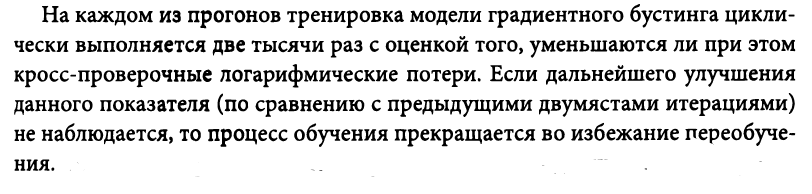

#### Кривая "точность-полнота"

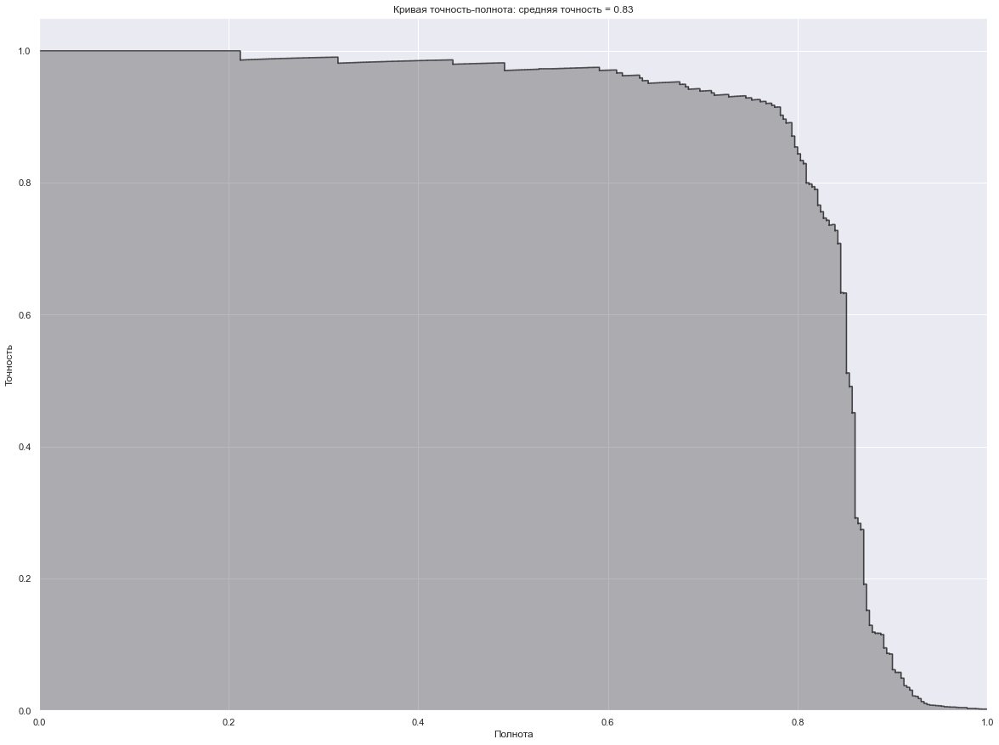

In [36]:
preds = pd.concat([y_train, predictionsBasedOnKFolds], axis=1)
preds.columns = ['trueLabel', 'prediction']
predictionsBasedOnKFoldsLightGBMGradientBoosting = preds.copy()

#расчет метрики
precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])
#расчет метрики
average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])
plt.step(recall, precision, color='k', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.3, color='k')

plt.xlabel('Полнота')
plt.ylabel('Точность')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Кривая точность-полнота: средняя точность = {0:0.2f}'.format(average_precision))
plt.show()

Логарифмические потери практически как у XGBoost. Также наблюдается большая разница потерь на обучении и валидации, что говорит о некоторой степени переобучении модели. Помимо этого время затраты на обучение у LightGBM значительно ниже (32с против 9м 50с)

#### Показатель auROC

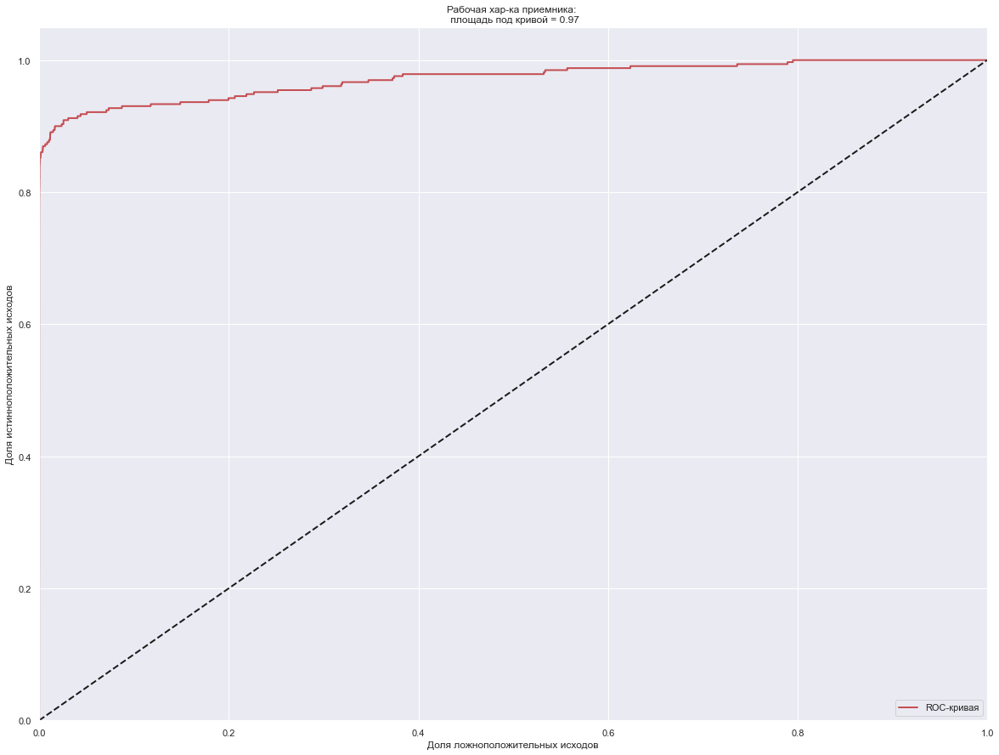

In [37]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'], preds['prediction'])

areaUnderROC = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC-кривая')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Доля ложноположительных исходов')
plt.ylabel('Доля истинноположительных исходов')
plt.title('Рабочая хар-ка приемника: \n площадь под кривой = {0:0.2f}'.format(areaUnderROC))
plt.legend(loc='lower right')
plt.show()

Показатель auROC выше на 0.01 по сравнению с XGBoost.

## Оценка четерых моделей с помощью тестового набора

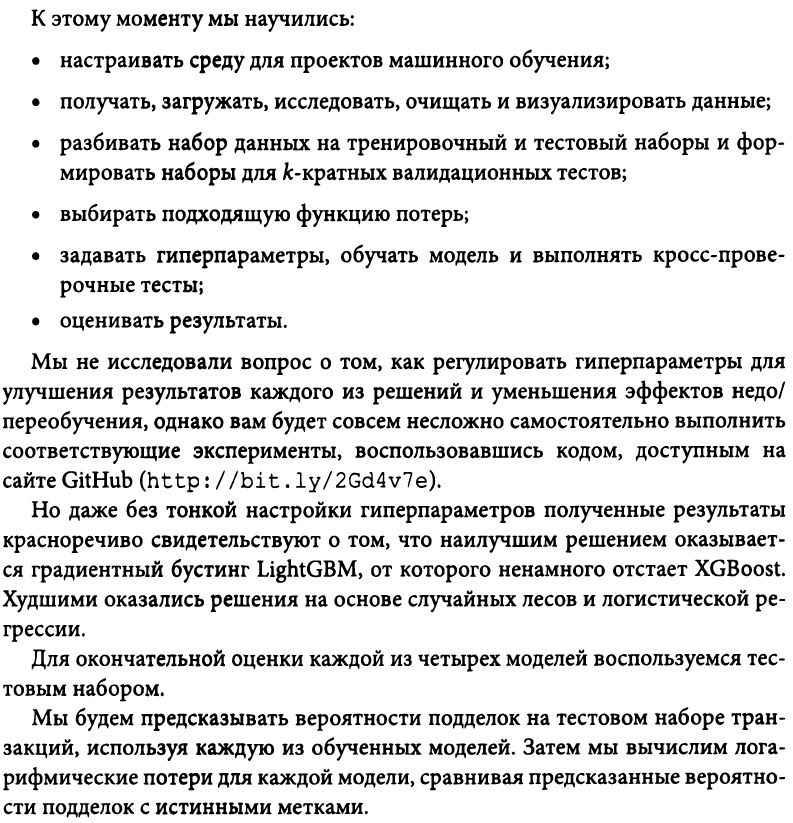

#### Предсказание на тестовом наборе:

In [38]:
#LogisticRegression
predictionsTestSetLogisticRegression = pd.DataFrame(data=[], index=y_test.index, columns=['prediction'])
predictionsTestSetLogisticRegression.loc[:, 'prediction'] = logReg.predict_proba(X_test)[:, 1]
logLossTestSetLogisticRegression = log_loss(y_test, predictionsTestSetLogisticRegression)

#RandomForests
predictionsTestSetRandomForests = pd.DataFrame(data=[], index=y_test.index, columns=['prediction'])
predictionsTestSetRandomForests.loc[:, 'prediction'] = RFC.predict_proba(X_test)[:, 1]
logLossTestSetRandomForests = log_loss(y_test, predictionsTestSetRandomForests)

#XGBoost
predictionsTestSetXGBoostGradientBoosting = pd.DataFrame(data=[], index=y_test.index, columns=['prediction'])
dtest = xgb.DMatrix(data=X_test)
predictionsTestSetXGBoostGradientBoosting.loc[:, 'prediction'] = bst.predict(dtest)
logLossTestSetXGBoostGradientBoosting = log_loss(y_test, predictionsTestSetXGBoostGradientBoosting)

#LightGBM
predictionsTestSetLightGBMGradientBoosting = pd.DataFrame(data=[], index=y_test.index, columns=['prediction'])
predictionsTestSetLightGBMGradientBoosting.loc[:, 'prediction'] = gbm.predict(X_test, num_iteration=gbm.best_iteration)
logLossTestSetLightGBMGradientBoosting = log_loss(y_test, predictionsTestSetLightGBMGradientBoosting)

#### Логарифмические потери каждой модели на тестовом наборе:

In [39]:
print(f'Logistic Regression: {logLossTestSetLogisticRegression}')
print(f'Random Forests:      {logLossTestSetRandomForests}')
print(f'XGBoost:             {logLossTestSetXGBoostGradientBoosting}')
print(f'LightGBM:            {logLossTestSetLightGBMGradientBoosting}')

Logistic Regression: 0.11956853335361141
Random Forests:      0.00686570483745583
XGBoost:             0.0025757499721995895
LightGBM:            0.002717531952788655


Наилучшим вариантом оказался XGBoost, но LightGBM находится очень близко. Также напомню, что на XGBoost ушло ~10 минут, а на LightGBM порядка ~35 секунд.

#### Графики "точность-полнота" и ROC-кривые:

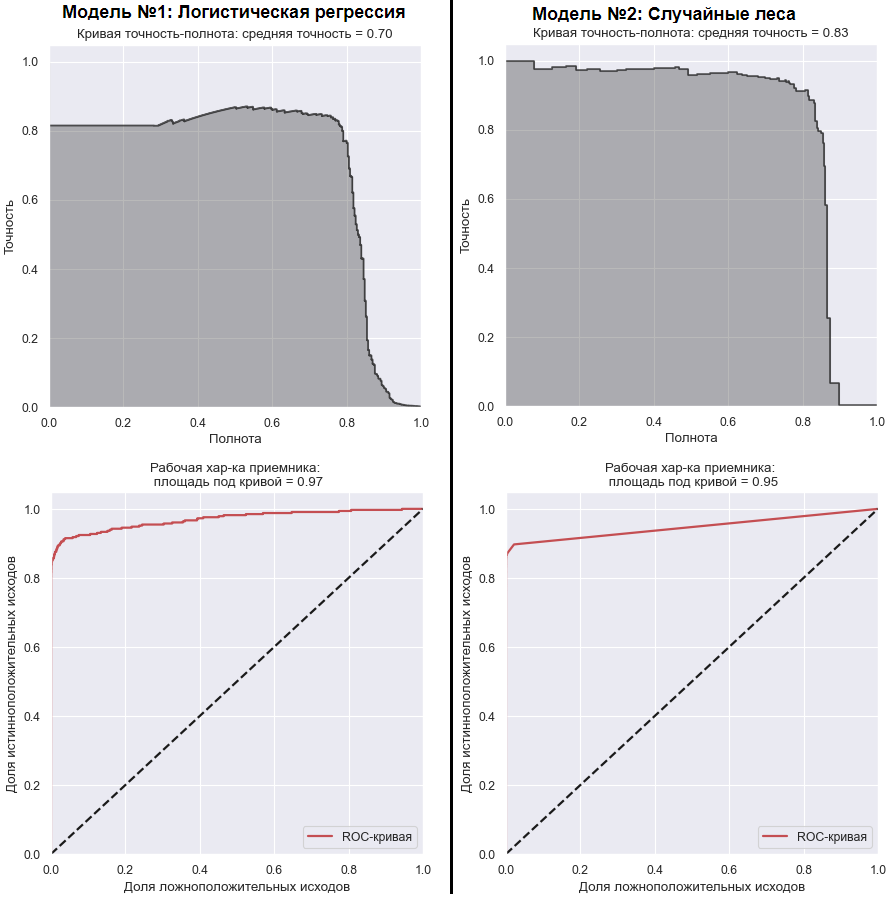

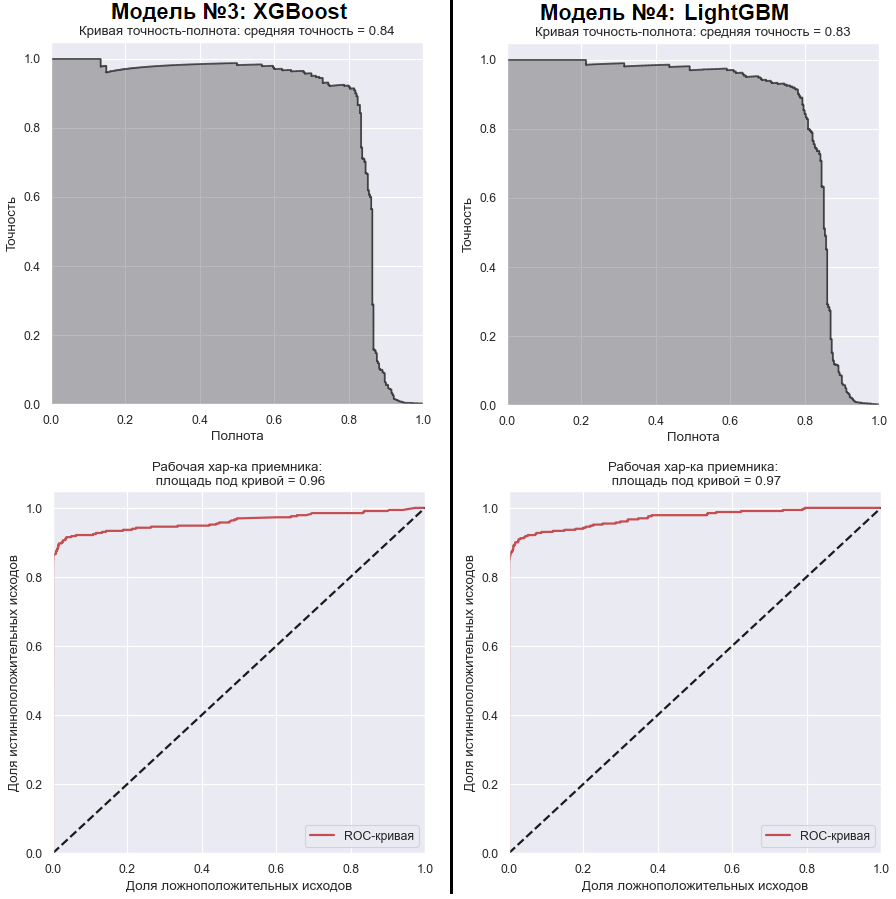

Худший результат показывает линейная регрессия  
LightGBM проигрывает в точности.  
Пока на данный момент мой выбор пал на XGBoost в решении данной задачи бинарной классификации.  

Также стоит учесть, что данные являются несбалансированными, количество поддельных транзакций ничтожно мало. Достижение подобного результа выше хорошего!

## Ансамбли

<a href='https://www.kaggle.com/code/arthurtok/introduction-to-ensembling-stacking-in-python/notebook'>Introduction to Ensembling/Stacking in Python</a> - пример комбинирования базовых моделей обучения.  
<a href='https://habr.com/ru/post/571296/'>Ансамблевые методы машинного обучения</a> более просто с примерами.

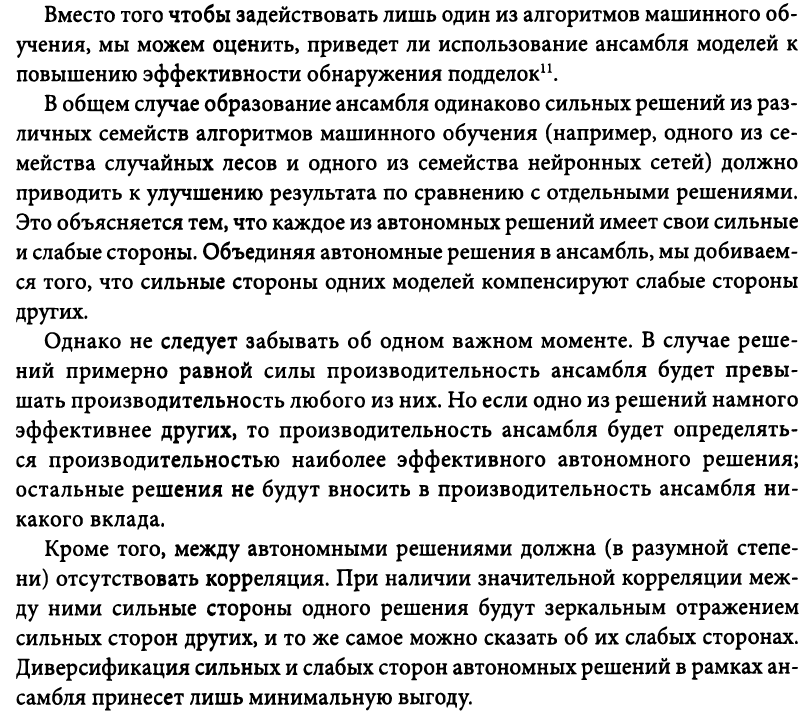

### Стекинг

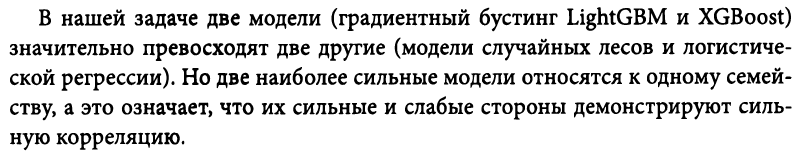

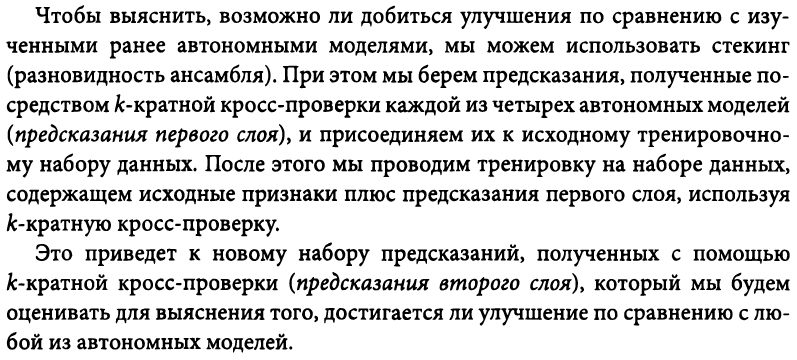

### Комбинирование предсказний первого слоя с оригинальным тренировочным набором

In [40]:
#объединим предсказания 4-ех моделей машинного обучения

predictionsBasedOnKFoldsFourModels = pd.DataFrame(data=[], index=y_train.index)
predictionsBasedOnKFoldsFourModels['LogisticRegression'] = predictionsBasedOnKFoldsLogisticRegression['prediction']
predictionsBasedOnKFoldsFourModels['RandomForests'] = predictionsBasedOnKFoldsRandomForests['prediction']
predictionsBasedOnKFoldsFourModels['XGBoost'] = predictionsBasedOnKFoldsXGBoostGradientBoosting['prediction']
predictionsBasedOnKFoldsFourModels['LightGBM'] = predictionsBasedOnKFoldsLightGBMGradientBoosting['prediction']
predictionsBasedOnKFoldsFourModels[['LogisticRegression', 'RandomForests', 'XGBoost', 'LightGBM']] = \
predictionsBasedOnKFoldsFourModels[['LogisticRegression', 'RandomForests', 'XGBoost', 'LightGBM']].astype(float)
#заносим предсказания в тренировочный набор
X_trainWithPredictions = X_train.merge(predictionsBasedOnKFoldsFourModels, left_index=True, right_index=True)

### Настройка гиперпараметров

In [41]:
params_lightGB = {
    'task': 'train',
    'objective': 'binary',
    'num_class': 1,
    'boosting': 'gbdt',
    'objective': 'binary',
    'metric': 'binary_logloss',
    'metric_freq': 50,
    'is_training_metric': False,
    'max_depth': -1,
    'num_leaves': 31,
    'learning_rate': 0.01,
    'feature_fraction': 1.0,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'bagging_seed': 10,
    'verbose': 0,
    'num_threads': 8,
    'force_col_wise': True
}

### Тренировка модели

In [42]:
trainingScores = []
cvScored = []
predictionsBasedOnKFoldsEnsemble = pd.DataFrame(data=[], index=y_train.index, columns=['prediction'])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold = X_trainWithPredictions.iloc[train_index, :]
    X_cv_fold = X_trainWithPredictions.iloc[cv_index, :]
    
    y_train_fold = y_train.iloc[train_index]
    y_cv_fold = y_train.iloc[cv_index]
    
    lgb_train = lgb.Dataset(X_train_fold, y_train_fold)
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration))
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index, 'prediction'] = gbm.predict(X_cv_fold, num_iteration=gbm.best_iteration)
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index, 'prediction'])
    cvScores.append(loglossCV)
    
    print(f'Логарифмические потери обучения: {loglossTraining}')
    print(f'Логарифмические потери валидации: {loglossCV}')
    
loglossEnsemble = log_loss(y_train, predictionsBasedOnKFoldsEnsemble.loc[:, 'prediction'])
print(f'Логарифмические потери ансамбля: {loglossEnsemble}')
    

[1]	valid_0's binary_logloss: 0.00570842
Training until validation scores don't improve for 200 rounds
[2]	valid_0's binary_logloss: 0.00565705
[3]	valid_0's binary_logloss: 0.00560563
[4]	valid_0's binary_logloss: 0.00555957
[5]	valid_0's binary_logloss: 0.00551703
[6]	valid_0's binary_logloss: 0.00547141
[7]	valid_0's binary_logloss: 0.00542745
[8]	valid_0's binary_logloss: 0.00538151
[9]	valid_0's binary_logloss: 0.00534079
[10]	valid_0's binary_logloss: 0.0053012
[11]	valid_0's binary_logloss: 0.0052599
[12]	valid_0's binary_logloss: 0.0052197
[13]	valid_0's binary_logloss: 0.00518438
[14]	valid_0's binary_logloss: 0.00514918
[15]	valid_0's binary_logloss: 0.00511505
[16]	valid_0's binary_logloss: 0.00508
[17]	valid_0's binary_logloss: 0.00504597
[18]	valid_0's binary_logloss: 0.00501472
[19]	valid_0's binary_logloss: 0.00498234
[20]	valid_0's binary_logloss: 0.00495034
[21]	valid_0's binary_logloss: 0.00491838
[22]	valid_0's binary_logloss: 0.00488758
[23]	valid_0's binary_logloss

[199]	valid_0's binary_logloss: 0.00316334
[200]	valid_0's binary_logloss: 0.00316169
[201]	valid_0's binary_logloss: 0.00316092
[202]	valid_0's binary_logloss: 0.0031593
[203]	valid_0's binary_logloss: 0.00315866
[204]	valid_0's binary_logloss: 0.00315814
[205]	valid_0's binary_logloss: 0.00315818
[206]	valid_0's binary_logloss: 0.00315724
[207]	valid_0's binary_logloss: 0.00315567
[208]	valid_0's binary_logloss: 0.00315467
[209]	valid_0's binary_logloss: 0.00315419
[210]	valid_0's binary_logloss: 0.00315369
[211]	valid_0's binary_logloss: 0.00315285
[212]	valid_0's binary_logloss: 0.00315159
[213]	valid_0's binary_logloss: 0.00315084
[214]	valid_0's binary_logloss: 0.00315044
[215]	valid_0's binary_logloss: 0.00315039
[216]	valid_0's binary_logloss: 0.00314959
[217]	valid_0's binary_logloss: 0.00314821
[218]	valid_0's binary_logloss: 0.00314729
[219]	valid_0's binary_logloss: 0.00314689
[220]	valid_0's binary_logloss: 0.00314557
[221]	valid_0's binary_logloss: 0.00314331
[222]	valid_

[405]	valid_0's binary_logloss: 0.0033231
[406]	valid_0's binary_logloss: 0.00332584
[407]	valid_0's binary_logloss: 0.00332848
[408]	valid_0's binary_logloss: 0.00333098
[409]	valid_0's binary_logloss: 0.00333371
[410]	valid_0's binary_logloss: 0.00333618
[411]	valid_0's binary_logloss: 0.00333828
[412]	valid_0's binary_logloss: 0.00334088
[413]	valid_0's binary_logloss: 0.00334356
[414]	valid_0's binary_logloss: 0.00334532
[415]	valid_0's binary_logloss: 0.00334803
[416]	valid_0's binary_logloss: 0.00334871
[417]	valid_0's binary_logloss: 0.00334953
[418]	valid_0's binary_logloss: 0.00335269
[419]	valid_0's binary_logloss: 0.00335352
[420]	valid_0's binary_logloss: 0.00335534
[421]	valid_0's binary_logloss: 0.00335801
[422]	valid_0's binary_logloss: 0.0033589
[423]	valid_0's binary_logloss: 0.00335977
[424]	valid_0's binary_logloss: 0.00336158
[425]	valid_0's binary_logloss: 0.00336468
[426]	valid_0's binary_logloss: 0.0033656
[427]	valid_0's binary_logloss: 0.00336686
[428]	valid_0'

[128]	valid_0's binary_logloss: 0.00431522
[129]	valid_0's binary_logloss: 0.0043099
[130]	valid_0's binary_logloss: 0.00430608
[131]	valid_0's binary_logloss: 0.00430076
[132]	valid_0's binary_logloss: 0.00429495
[133]	valid_0's binary_logloss: 0.00429109
[134]	valid_0's binary_logloss: 0.00428617
[135]	valid_0's binary_logloss: 0.00428047
[136]	valid_0's binary_logloss: 0.00427504
[137]	valid_0's binary_logloss: 0.00427165
[138]	valid_0's binary_logloss: 0.00426396
[139]	valid_0's binary_logloss: 0.00425947
[140]	valid_0's binary_logloss: 0.00425206
[141]	valid_0's binary_logloss: 0.00424791
[142]	valid_0's binary_logloss: 0.00424479
[143]	valid_0's binary_logloss: 0.00423993
[144]	valid_0's binary_logloss: 0.00423332
[145]	valid_0's binary_logloss: 0.0042293
[146]	valid_0's binary_logloss: 0.00422296
[147]	valid_0's binary_logloss: 0.00421961
[148]	valid_0's binary_logloss: 0.0042139
[149]	valid_0's binary_logloss: 0.0042093
[150]	valid_0's binary_logloss: 0.00420222
[151]	valid_0's

[336]	valid_0's binary_logloss: 0.00419965
[337]	valid_0's binary_logloss: 0.00420178
[338]	valid_0's binary_logloss: 0.00420383
[339]	valid_0's binary_logloss: 0.00420648
[340]	valid_0's binary_logloss: 0.00420856
[341]	valid_0's binary_logloss: 0.0042104
[342]	valid_0's binary_logloss: 0.00421368
[343]	valid_0's binary_logloss: 0.00421526
[344]	valid_0's binary_logloss: 0.00421653
[345]	valid_0's binary_logloss: 0.00421877
[346]	valid_0's binary_logloss: 0.00422072
[347]	valid_0's binary_logloss: 0.00422201
[348]	valid_0's binary_logloss: 0.00422452
[349]	valid_0's binary_logloss: 0.0042264
[350]	valid_0's binary_logloss: 0.00422773
[351]	valid_0's binary_logloss: 0.00422935
[352]	valid_0's binary_logloss: 0.00423234
[353]	valid_0's binary_logloss: 0.00423593
[354]	valid_0's binary_logloss: 0.00423766
[355]	valid_0's binary_logloss: 0.00424122
[356]	valid_0's binary_logloss: 0.00424485
[357]	valid_0's binary_logloss: 0.00424639
[358]	valid_0's binary_logloss: 0.00424999
[359]	valid_0

[105]	valid_0's binary_logloss: 0.00290083
[106]	valid_0's binary_logloss: 0.00289135
[107]	valid_0's binary_logloss: 0.00288209
[108]	valid_0's binary_logloss: 0.00287289
[109]	valid_0's binary_logloss: 0.00286335
[110]	valid_0's binary_logloss: 0.002854
[111]	valid_0's binary_logloss: 0.00284468
[112]	valid_0's binary_logloss: 0.00283549
[113]	valid_0's binary_logloss: 0.00283008
[114]	valid_0's binary_logloss: 0.00282115
[115]	valid_0's binary_logloss: 0.00281208
[116]	valid_0's binary_logloss: 0.00280902
[117]	valid_0's binary_logloss: 0.00280035
[118]	valid_0's binary_logloss: 0.00279115
[119]	valid_0's binary_logloss: 0.00278373
[120]	valid_0's binary_logloss: 0.0027794
[121]	valid_0's binary_logloss: 0.00277284
[122]	valid_0's binary_logloss: 0.00276631
[123]	valid_0's binary_logloss: 0.00276006
[124]	valid_0's binary_logloss: 0.00275214
[125]	valid_0's binary_logloss: 0.00274619
[126]	valid_0's binary_logloss: 0.0027377
[127]	valid_0's binary_logloss: 0.00273187
[128]	valid_0's

[307]	valid_0's binary_logloss: 0.00230146
[308]	valid_0's binary_logloss: 0.00230234
[309]	valid_0's binary_logloss: 0.00230368
[310]	valid_0's binary_logloss: 0.00230287
[311]	valid_0's binary_logloss: 0.00230324
[312]	valid_0's binary_logloss: 0.00230427
[313]	valid_0's binary_logloss: 0.00230353
[314]	valid_0's binary_logloss: 0.00230453
[315]	valid_0's binary_logloss: 0.00230554
[316]	valid_0's binary_logloss: 0.00230532
[317]	valid_0's binary_logloss: 0.00230424
[318]	valid_0's binary_logloss: 0.00230362
[319]	valid_0's binary_logloss: 0.00230525
[320]	valid_0's binary_logloss: 0.00230643
[321]	valid_0's binary_logloss: 0.00230674
[322]	valid_0's binary_logloss: 0.00230712
[323]	valid_0's binary_logloss: 0.00230714
[324]	valid_0's binary_logloss: 0.00230751
[325]	valid_0's binary_logloss: 0.00230788
[326]	valid_0's binary_logloss: 0.00230796
[327]	valid_0's binary_logloss: 0.00230801
[328]	valid_0's binary_logloss: 0.00230832
[329]	valid_0's binary_logloss: 0.00230883
[330]	valid

[28]	valid_0's binary_logloss: 0.00430351
[29]	valid_0's binary_logloss: 0.0042759
[30]	valid_0's binary_logloss: 0.00424784
[31]	valid_0's binary_logloss: 0.00421996
[32]	valid_0's binary_logloss: 0.00419249
[33]	valid_0's binary_logloss: 0.00416617
[34]	valid_0's binary_logloss: 0.0041407
[35]	valid_0's binary_logloss: 0.0041122
[36]	valid_0's binary_logloss: 0.00408732
[37]	valid_0's binary_logloss: 0.00406358
[38]	valid_0's binary_logloss: 0.00403956
[39]	valid_0's binary_logloss: 0.00401523
[40]	valid_0's binary_logloss: 0.00398679
[41]	valid_0's binary_logloss: 0.00395564
[42]	valid_0's binary_logloss: 0.00392598
[43]	valid_0's binary_logloss: 0.00389694
[44]	valid_0's binary_logloss: 0.00387584
[45]	valid_0's binary_logloss: 0.00385426
[46]	valid_0's binary_logloss: 0.00383358
[47]	valid_0's binary_logloss: 0.00380776
[48]	valid_0's binary_logloss: 0.00378225
[49]	valid_0's binary_logloss: 0.00376333
[50]	valid_0's binary_logloss: 0.00374464
[51]	valid_0's binary_logloss: 0.0037

[229]	valid_0's binary_logloss: 0.00246831
[230]	valid_0's binary_logloss: 0.00246738
[231]	valid_0's binary_logloss: 0.00246632
[232]	valid_0's binary_logloss: 0.00246463
[233]	valid_0's binary_logloss: 0.00246422
[234]	valid_0's binary_logloss: 0.00246426
[235]	valid_0's binary_logloss: 0.00246353
[236]	valid_0's binary_logloss: 0.00246344
[237]	valid_0's binary_logloss: 0.00246301
[238]	valid_0's binary_logloss: 0.00246289
[239]	valid_0's binary_logloss: 0.00246288
[240]	valid_0's binary_logloss: 0.0024625
[241]	valid_0's binary_logloss: 0.00246094
[242]	valid_0's binary_logloss: 0.0024609
[243]	valid_0's binary_logloss: 0.00245947
[244]	valid_0's binary_logloss: 0.00245948
[245]	valid_0's binary_logloss: 0.00245821
[246]	valid_0's binary_logloss: 0.00245807
[247]	valid_0's binary_logloss: 0.00245676
[248]	valid_0's binary_logloss: 0.00245513
[249]	valid_0's binary_logloss: 0.00245326
[250]	valid_0's binary_logloss: 0.00245214
[251]	valid_0's binary_logloss: 0.00245085
[252]	valid_0

[423]	valid_0's binary_logloss: 0.00251055
[424]	valid_0's binary_logloss: 0.00251039
[425]	valid_0's binary_logloss: 0.00251258
[426]	valid_0's binary_logloss: 0.00251279
[427]	valid_0's binary_logloss: 0.00251353
[428]	valid_0's binary_logloss: 0.00251459
[429]	valid_0's binary_logloss: 0.00251476
[430]	valid_0's binary_logloss: 0.00251537
[431]	valid_0's binary_logloss: 0.00251619
[432]	valid_0's binary_logloss: 0.00251697
[433]	valid_0's binary_logloss: 0.00251682
[434]	valid_0's binary_logloss: 0.00251794
[435]	valid_0's binary_logloss: 0.00251874
[436]	valid_0's binary_logloss: 0.00251976
[437]	valid_0's binary_logloss: 0.00252007
[438]	valid_0's binary_logloss: 0.00252163
[439]	valid_0's binary_logloss: 0.00252232
[440]	valid_0's binary_logloss: 0.0025234
[441]	valid_0's binary_logloss: 0.00252374
[442]	valid_0's binary_logloss: 0.00252494
[443]	valid_0's binary_logloss: 0.00252637
[444]	valid_0's binary_logloss: 0.00252671
[445]	valid_0's binary_logloss: 0.00252646
[446]	valid_

[121]	valid_0's binary_logloss: 0.00262867
[122]	valid_0's binary_logloss: 0.00262013
[123]	valid_0's binary_logloss: 0.00261179
[124]	valid_0's binary_logloss: 0.00260404
[125]	valid_0's binary_logloss: 0.00259568
[126]	valid_0's binary_logloss: 0.00258849
[127]	valid_0's binary_logloss: 0.00258214
[128]	valid_0's binary_logloss: 0.00257439
[129]	valid_0's binary_logloss: 0.00256641
[130]	valid_0's binary_logloss: 0.00255892
[131]	valid_0's binary_logloss: 0.00255134
[132]	valid_0's binary_logloss: 0.00254445
[133]	valid_0's binary_logloss: 0.00253843
[134]	valid_0's binary_logloss: 0.00253174
[135]	valid_0's binary_logloss: 0.00252533
[136]	valid_0's binary_logloss: 0.00251894
[137]	valid_0's binary_logloss: 0.0025134
[138]	valid_0's binary_logloss: 0.002507
[139]	valid_0's binary_logloss: 0.00250144
[140]	valid_0's binary_logloss: 0.00249577
[141]	valid_0's binary_logloss: 0.00248982
[142]	valid_0's binary_logloss: 0.00248373
[143]	valid_0's binary_logloss: 0.00247833
[144]	valid_0'

[323]	valid_0's binary_logloss: 0.00207956
[324]	valid_0's binary_logloss: 0.00207911
[325]	valid_0's binary_logloss: 0.00207791
[326]	valid_0's binary_logloss: 0.00207668
[327]	valid_0's binary_logloss: 0.00207647
[328]	valid_0's binary_logloss: 0.00207697
[329]	valid_0's binary_logloss: 0.00207639
[330]	valid_0's binary_logloss: 0.00207531
[331]	valid_0's binary_logloss: 0.00207484
[332]	valid_0's binary_logloss: 0.00207449
[333]	valid_0's binary_logloss: 0.00207346
[334]	valid_0's binary_logloss: 0.00207261
[335]	valid_0's binary_logloss: 0.00207217
[336]	valid_0's binary_logloss: 0.0020718
[337]	valid_0's binary_logloss: 0.00207174
[338]	valid_0's binary_logloss: 0.00207112
[339]	valid_0's binary_logloss: 0.00206996
[340]	valid_0's binary_logloss: 0.0020694
[341]	valid_0's binary_logloss: 0.00206852
[342]	valid_0's binary_logloss: 0.00206794
[343]	valid_0's binary_logloss: 0.00206845
[344]	valid_0's binary_logloss: 0.00206725
[345]	valid_0's binary_logloss: 0.00206679
[346]	valid_0

[518]	valid_0's binary_logloss: 0.00216453
[519]	valid_0's binary_logloss: 0.00216483
[520]	valid_0's binary_logloss: 0.00216673
[521]	valid_0's binary_logloss: 0.00216794
[522]	valid_0's binary_logloss: 0.0021681
[523]	valid_0's binary_logloss: 0.00216932
[524]	valid_0's binary_logloss: 0.00217046
[525]	valid_0's binary_logloss: 0.00217207
[526]	valid_0's binary_logloss: 0.00217224
[527]	valid_0's binary_logloss: 0.00217368
[528]	valid_0's binary_logloss: 0.00217428
[529]	valid_0's binary_logloss: 0.0021749
[530]	valid_0's binary_logloss: 0.00217625
[531]	valid_0's binary_logloss: 0.00217605
[532]	valid_0's binary_logloss: 0.00217775
[533]	valid_0's binary_logloss: 0.00217749
[534]	valid_0's binary_logloss: 0.00217911
[535]	valid_0's binary_logloss: 0.00217972
[536]	valid_0's binary_logloss: 0.00217954
[537]	valid_0's binary_logloss: 0.00218079
[538]	valid_0's binary_logloss: 0.00218132
[539]	valid_0's binary_logloss: 0.00218259
[540]	valid_0's binary_logloss: 0.00218343
[541]	valid_0

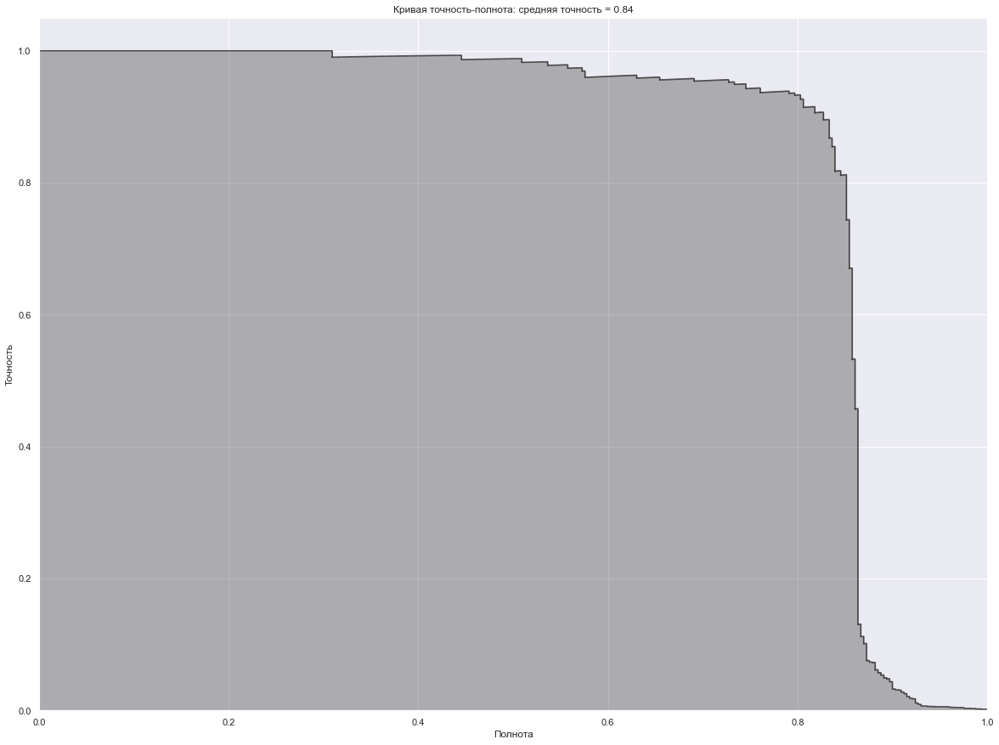

In [43]:
preds = pd.concat([y_train, predictionsBasedOnKFoldsEnsemble], axis=1)
preds.columns = ['trueLabel', 'prediction']

#расчет метрики
precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])
#расчет метрики
average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

plt.step(recall, precision, color='k', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.3, color='k')

plt.xlabel('Полнота')
plt.ylabel('Точность')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Кривая точность-полнота: средняя точность = {0:0.2f}'.format(average_precision))
plt.show()

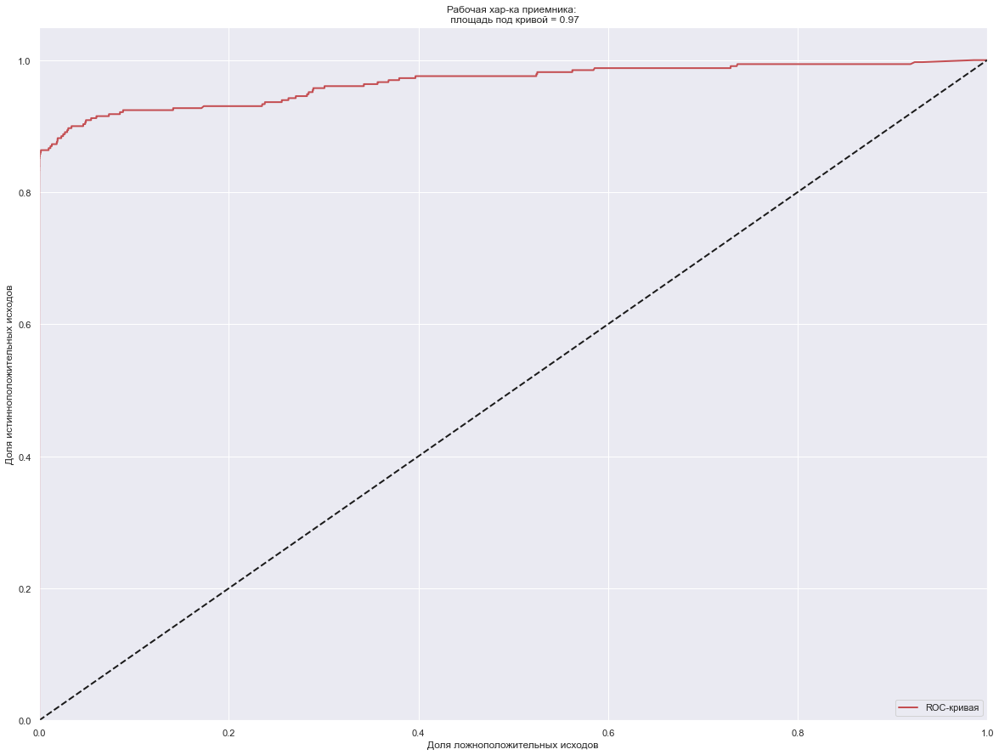

In [44]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'], preds['prediction'])

areaUnderROC = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC-кривая')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Доля ложноположительных исходов')
plt.ylabel('Доля истинноположительных исходов')
plt.title('Рабочая хар-ка приемника: \n площадь под кривой = {0:0.2f}'.format(areaUnderROC))
plt.legend(loc='lower right')
plt.show()

### Оценка результатов

Проявилось улучшение на 0.02 в точности модели. Логарифмические потери близки, но все же немного ниже.
Результат нестолько превосходит, так как наилучшие автономные решения принадлежат к одному и тому же семейству (градиентный бустинг). Их сильные и слабые стороны характеризуются высокой степенью корреляции, поэтому диверсификация по моделям не вносит значительного выигрыша.

## Выбор окончательной модели

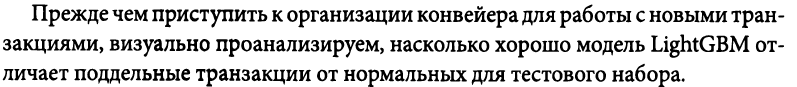

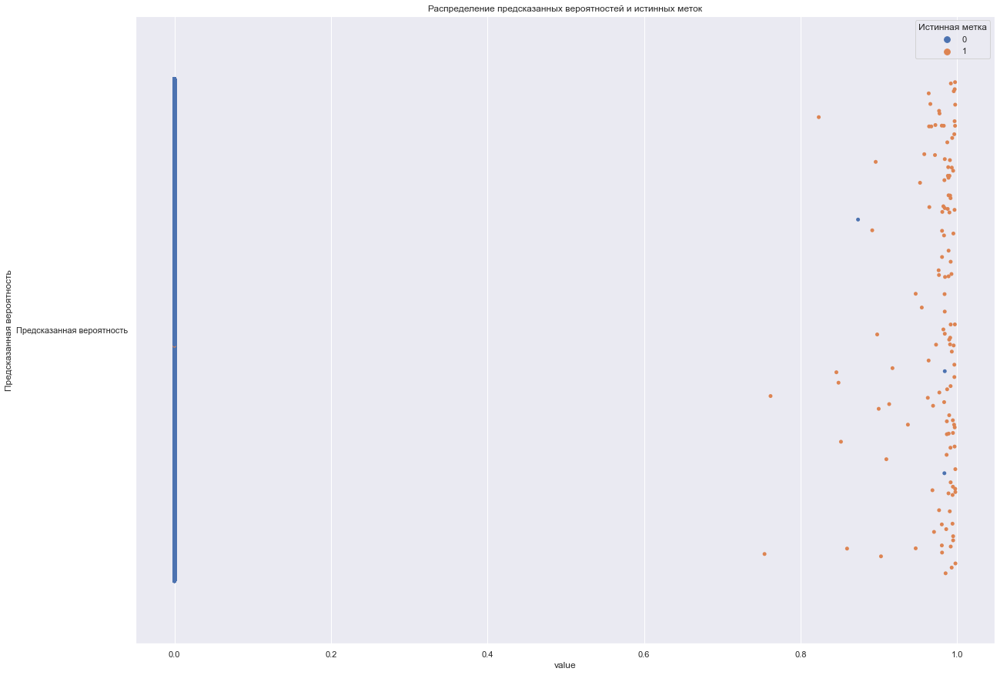

In [76]:
#объединим предсказания LightGBM и верные ответы.
scatterDataLightGBM = predictionsTestSetXGBoostGradientBoosting.join(y_test, how='left')
scatterDataLightGBM.columns = ['Предсказанная вероятность', 'Истинная метка']

#scatterDataMetled = pd.melt(scatterDataLightGBM, 'Истинная метка', var_name='Предсказанная вероятность')
ax = sns.stripplot(x='value', y='Предсказанная вероятность', hue='Истинная метка', jitter=0.4, data=scatterDataMetled)
ax.set_title('Распределение предсказанных вероятностей и истинных меток')
plt.show()

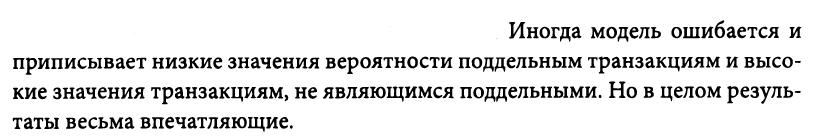

## Производственный конвейер

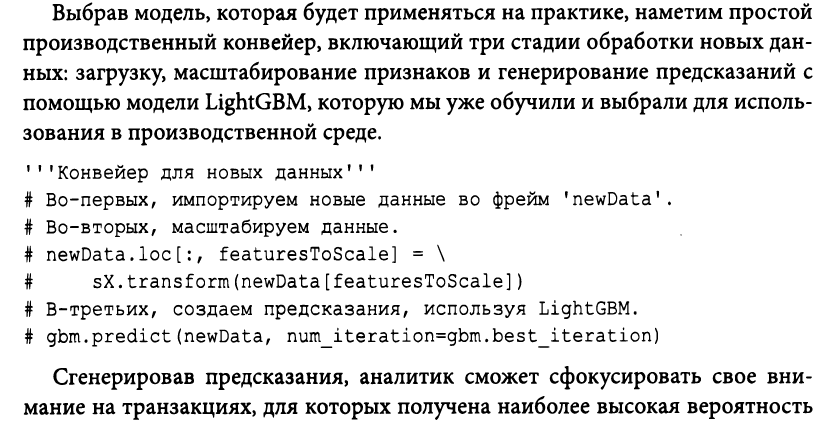

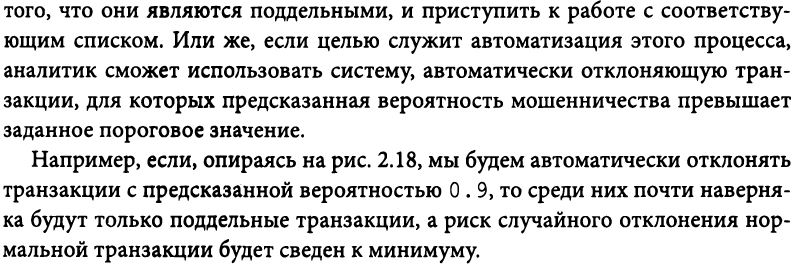

## Резюме

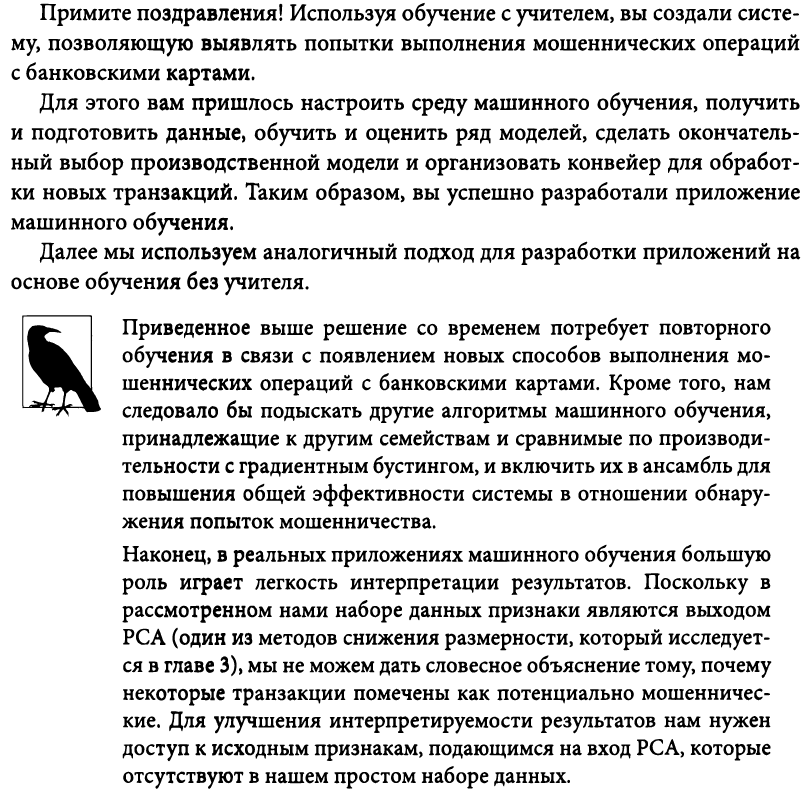